In [104]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numpy import exp, abs, log
from scipy.special import gamma, factorial
import os
import scipy.stats as stats
import statsmodels.api as sm
from utils import *
import time
import datetime as dt
import universal as up
from universal import tools, algos
from universal.algos import *

np.set_printoptions(suppress=True)
np.set_printoptions(precision=4)
np.set_printoptions(threshold=np.inf)

In [105]:
def get_res(path, phase, maxiter, subn, lb):
    data_path1 = path%(phase, maxiter, subn, lb)
    print(data_path1)
    data1 = np.load(data_path1)
    return data1['predY0'], data1['std_varY0'], data1['val_predY0'], data1['val_std_varY0'], data1['sample_Y0']

def ucb_strategy(lam, predY0, std_varY0, sample_Y0):
    rt_v = []
    ninvest = 10

    for i in range(len(predY0)):
        p = predY0[i]
        sell_idx = np.argsort(p-lam*std_varY0[i])[:ninvest//2]
        buy_idx = np.argsort(-(p+lam*std_varY0[i]))[:ninvest//2]
        rr = 1/ninvest
        tmp = rr*(sum(exp(sample_Y0[i, buy_idx]))+sum(exp(-sample_Y0[i, sell_idx])))
        rt_v.append(log(tmp))
    return rt_v


def opt_strategy(predY0, std_var_Y0, sample_Y0, cov, delta, cash=1.0):
    rt_v = []
    for i in range(len(predY0)):
        r = exp(predY0[i])
        cov_dia = std_var_Y0[i]**2 * r * r
#         cov_current = np.zeros_like(cov)
        cov_current = cov.copy()
        for k in range(len(r)):
            cov_current[k, k] = cov_dia[k]
#         x_opt = solve(len(r), r, cov_current, delta, cash)
        x_opt = solve2(len(r), r, cov_current, delta)
        
        print(x_opt)
#         print(sum(x_opt))
#         print(sample_Y0[i])
        print(sum(x_opt * exp(sample_Y0[i])))
#         print(predY0[i])
#         print(cov_current[:10, :10])
        
        tmp = sum(x_opt * exp(sample_Y0[i])) / cash
        rt_v.append(log(tmp))
    return rt_v


def max_redraw(rt_v):
    res = max([rt_v[i] - min(rt_v[i+1:]) for i in range(len(rt_v)-1)])
    return res

In [106]:
testv = np.arange(-0.1, 0.10001, 0.01)

In [107]:
def run(path, maxiter, subn, lb, figsize=(10,5), testv=testv, delta=10000):
    rt_lst, rd_lst, naive_lst, opt_lst = [], [], [], []
    for phs in range(4, 12):
#     for phs in range(10, 11):
        print('Phase %d' % phs)
        data_path = './stock_data/stock_phase%02d_lb%d.npz' % (phs, lb)
        data = np.load(data_path)
        cov_train, choice = data['cov_train'], data['choice']
        cov = cov_train[choice[:subn], :][:, choice[:subn]]

        print('Validating...')
        plt.figure(figsize=figsize)
        _, _, predY0, std_varY0, sample_Y0 = get_res(path, phs, maxiter, subn, lb)

        print('Opt strategy')
        rt_v = opt_strategy(predY0, std_varY0, sample_Y0, cov, delta)
        rd = max_redraw(rt_v)
        print('Opt strategy   Total log return: %.8f    Max redraw: %.8f' % (sum(rt_v), rd))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt = rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i] += exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'r-', label='Opt strategy')

        print('UCB strategy')
        best_logrt = -np.inf
        best_rt_lam = 0
        best_rd = np.inf
        best_rd_lam = 0
        for lam in testv:
            rt_v=ucb_strategy(lam, predY0, std_varY0, sample_Y0)
            rd = max_redraw(rt_v)
            print('lambda: %.3f   Total log return: %.8f    Max redraw: %.8f' % (lam, sum(rt_v), rd))
            if sum(rt_v)>best_logrt:
                best_logrt=sum(rt_v)
                best_rt_lam=lam
            if rd<best_rd:
                best_rd=rd
                best_rd_lam=lam
            exp_rt=rt_v
            for i in range(1, len(rt_v)):
                exp_rt[i]+=exp_rt[i-1]
            exp_rt = exp(exp_rt)
            plt.plot(exp_rt, color='gray', linewidth=0.2)
        rt_v=ucb_strategy(best_rt_lam, predY0, std_varY0, sample_Y0)
        print('best return lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b-', label='best return, lambda=%.3f'%best_rt_lam)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        print('best redraw lambda: %.3f   Total log return: %.8f' % (best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g-', label='best redraw, lambda=%.3f'%best_rd_lam)
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Validation UCB');    plt.grid();    plt.legend();    plt.show()
        val_best_rt_lam = best_rt_lam
        val_best_rd_lam = best_rd_lam



        print('Testing...')
        plt.figure(figsize=figsize)
        predY0, std_varY0, _, _, sample_Y0 = get_res(path, phs, maxiter, subn, lb)

        print('UCB strategy')
        best_logrt = -np.inf
        best_rt_lam = 0
        best_rd = np.inf
        best_rd_lam = 0

        for lam in testv:
            rt_v=ucb_strategy(lam, predY0, std_varY0, sample_Y0)
            rd = max_redraw(rt_v)
            print('lambda: %.3f   Total log return: %.8f    Max redraw: %.8f' % (lam, sum(rt_v), rd))
            if sum(rt_v)>best_logrt:
                best_logrt=sum(rt_v)
                best_rt_lam=lam
            if rd<best_rd:
                best_rd=rd
                best_rd_lam=lam
            exp_rt=rt_v
            for i in range(1, len(rt_v)):
                exp_rt[i]+=exp_rt[i-1]
            exp_rt = exp(exp_rt)
            plt.plot(exp_rt, color='gray', linewidth=0.2)
        rt_v=ucb_strategy(best_rt_lam, predY0, std_varY0, sample_Y0)
        print('best return lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b--', label='best return, lambda=%.3f'%best_rt_lam, linewidth=0.2)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        print('best redraw lambda: %.3f   Total log return: %.8f' % (best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g--', label='best redraw, lambda=%.3f'%best_rd_lam, linewidth=0.2)

        print('------------------------------------------------------------------------------------')

        print('Opt strategy')
        rt_v = opt_strategy(predY0, std_varY0, sample_Y0, cov, delta)
        opt_lst += rt_v.copy()
        print('Opt strategy   Total log return: %.8f    Max redraw: %.8f' % (sum(rt_v), rd))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt = rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i] += exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'r', label='Opt strategy')

        rt_v=ucb_strategy(val_best_rt_lam, predY0, std_varY0, sample_Y0)
        rt_lst += rt_v.copy()
        print('best return val lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b', label='best return, val lambda=%.3f'%val_best_rt_lam)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        rd_lst += rt_v.copy()
        print('best redraw val lambda: %.3f   Total log return: %.8f' % (val_best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g', label='best redraw, val lambda=%.3f'%val_best_rd_lam)
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        naive_lst += rt_v.copy()
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Test UCB');    plt.grid();    plt.legend();    plt.show()
    print('-----------------------------Final result-----------------------------')
    plt.figure(figsize=figsize)
    rt_v = opt_lst
    print('Opt strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt = rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i] += exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'r', label='Opt strategy')

    rt_v=rt_lst
    print('best return strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'b', label='best return strategy')
    rt_v=rd_lst
    print('best redraw strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'g', label='best redraw strategy')
    rt_v=naive_lst
    print('Naive strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'y-', label='Naive strategy')
    plt.title('Overall Test');    plt.grid();    plt.legend();    plt.show()
    
    return opt_lst

In [108]:
lb = 5
maxiter = 8000
subn = 100
path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
# delta = 0.005

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[-0.    -0.    -0.    -0.     0.148 -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.3   -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.     0.3
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.252 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.   ]
1.041280826147528
[ 0.    0.   -0.    0.    0.   -0.    0.   -0.   -0.    0.    0.    0.
 -0.    0.    0.    0.    0.    0.   -0.   -0.    0.3   0.   -0.   -0.
 -0.    0.   -0.    0.    0.    0.    0.   -0.    0.    0.26  0.3   0.
 -0. 

[0.     0.     0.     0.0696 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0304 0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
1.0197021060723366
[ 0.   0.   0.  -0.   0.3  0.   0.   0.   0.  -0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.   0.
  0.   0.1  0.  -0.   0.3  0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.   0.  -0. 

[0.     0.     0.     0.1972 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1849 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.2126 0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1052 0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
1.0029990674907074
[ 0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.233  -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.2593  0.      0.      0.1977  0.
 -0.      0.      0.     -0.  

[0.     0.     0.     0.     0.     0.     0.     0.1136 0.     0.
 0.     0.     0.     0.     0.232  0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0316 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0228
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.977395941548913
[ 0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3
  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   

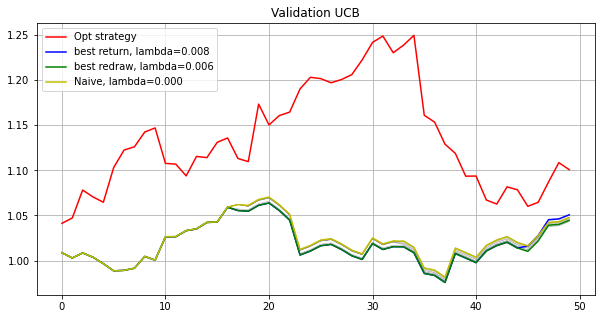

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0704
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
  0.1182  0.2114 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9780801215744492
[ 0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2094
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
1.0050980537608045
[-0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.   0.1  0.  -0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.   0.  -0.   0.3  0.  -0.   0.
 -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
  0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3 -0.
 -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.

[ 0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.0027 -0.      0.     -0.
  0.      0.      0.2406 -0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.0822  0.3     0.      0.     -0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.0746  0.
  0.      0.     -0.     -0.      0.      0.3     0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.    ]
0.9983615956190988
[ 0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.0881  0.      0.      0.      0.      0.
  0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0268 -0.     -0.
 -0.     -0.      0.0007 -0.      0.3    -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0725 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9896899703252897
[-0.  -0.   0.  -0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.
 -0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.  -0.   0.   0.3
 -0.  -0.  -0.   0.3 -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2118 0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.115  0.
 0.     0.     0.     0.     0.     0.     0.0075 0.     0.     0.
 0.0658 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
1.0039838709850288
[0.     0.     0.     0.     0.1985 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.1854 0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.

[ 0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
1.0167285259469392
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.2043 0.     0.     0.
 0.1111 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.2993 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0368 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0587 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0052 0.     0.     0.    ]
1.0259300402266047
[ 0.      0.      0.      0.      0.0425  0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.2446  0.      0.      0.      0.      0.
  0.0867  0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.

[ 0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.3     0.     -0.     -0.     -0.      0.      0.2676
  0.      0.      0.     -0.      0.3     0.      0.1324 -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
1.0191855067297872
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.3    -0.
  0.      0.3     0.      0.0648  0.      0.      0.      0.0352  0.
 

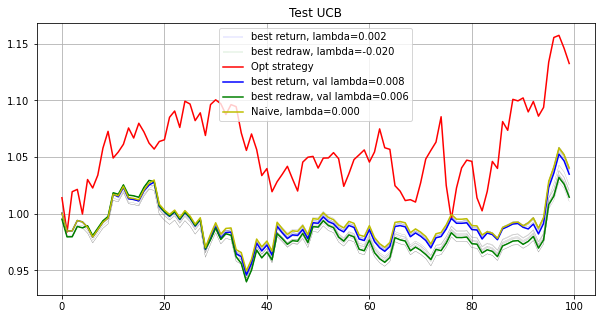

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1284 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0007 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.0631 -0.     -0.     -0.     -0.     -0.
 -0.      0.2455 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1625 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9849175444019118
[ 0.     0.     0.3   -0.    -0.     0.     0.    -0.    -0.     0.
 -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.     0.216 -

[ 0.     -0.      0.0497  0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
 -0.     -0.      0.      0.3     0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.      0.3
  0.      0.3     0.     -0.     -0.     -0.      0.     -0.      0.
  0.      0.      0.0215  0.0288  0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.    ]
0.9956050488170564
[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1874
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.


[ 0.      0.      0.2858 -0.     -0.     -0.      0.      0.     -0.
  0.     -0.     -0.     -0.     -0.      0.0231 -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.2265  0.1646 -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9974727194281965
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.

[-0.     -0.     -0.      0.3     0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.0213 -0.      0.3    -0.      0.     -0.
 -0.     -0.      0.0787  0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.3    -0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.    ]
0.9789290351873439
[ 0.0689  0.      0.3    -0.     -0.     -0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.     -0.     -0.      0.1715
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0116 -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0884 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0038883190252355
[-0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.0516  0.
 -0. 

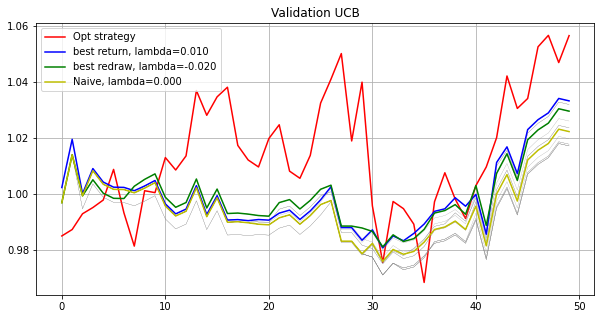

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2646 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.2799 0.     0.     0.     0.     0.     0.     0.     0.1435 0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.012  0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
1.0076808988188297
[0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.1897 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.175  0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.

[-0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0077
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0923 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9932104611104324
[-0.     -0.     -0.     -0.     -0.      0.0522 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.0705 -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2471 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0018 -0.      0.1527 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9983623622649236
[ 0.1 -0.   0.3  0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.
 -0.   0.   0.3  0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
 -

[-0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.3  0.3  0.  -0.   0.  -0.   0.1  0.  -0.   0.   0.  -0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.3 -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
  0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.  -0.
  0.   0. ]
1.0150441712159146
[ 0.2374 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.189  -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2736  0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0786  0.2381  0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.2603  0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.123   0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
0.9973289728813431
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.3    -0.
  0. 

[-0.     -0.     -0.      0.0777 -0.      0.      0.      0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.3    -0.     -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0042  0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.2446 -0.      0.0735 -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
1.0003502814712477
[ 0.   0.   0.3  0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.
  0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
 

[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.   0.  -0.  -0.   0.  -0.   0.1 -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.3  0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.   0.3  0.  -0.   0.   0.  -0.  -0.  -0.   0.3  0.  -0.  -0.  -0.
  0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.  -0.
  0.   0. ]
0.9941973619857306
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1418  0.      0.      0.
  0.2073  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.0509  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.3     0.      0.      0.      0.      0.      0.      0.     

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0338 -0.      0.0791 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.      0.0013 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0344 -0.     -0.     -0.
 -0.     -0.      0.2514 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.021916765012477
[ 0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.2421  0.      0.      0.      0.      0.     -0.     -0.      0.
  0. 

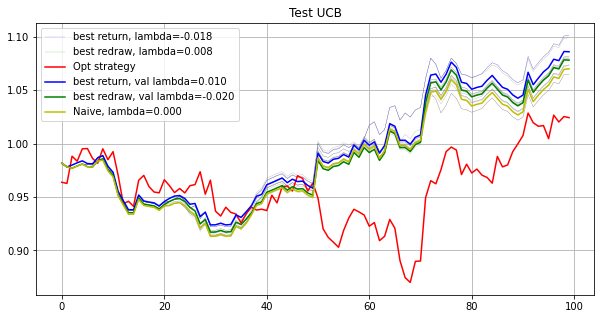

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.2312 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.2947 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0046 0.     0.     0.0745 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.095  0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9972051200804621
[-0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.  -0.   0.3  0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.   0.  

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.2595  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.0698
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.3     0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.1699  0.      0.      0.1023  0.0985 -0.      0.      0.
  0.    ]
0.9962121429219314
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.1468 -0.     -0.     -0.      0.0443 -0.
 

[-0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.0638  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.0362  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
0.9902387414967608
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.2272  0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.     -0.      0.
 -0. 

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.3  0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.  -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
1.0176637476269215
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.0392 -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.3     0.      0.     -0.      0.      0.     -0.
  0.0791 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2818  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1298 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2748
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2954 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9911803658269522
Opt strategy   Total log return: 0.05149571    Max redraw: 0.05851056
Total return: 1.05284467
Mean return: 1.00103044
UCB strategy
lambda: -0.020   Total log return: 0.04554256    Max redraw: 0.05163812
lamb

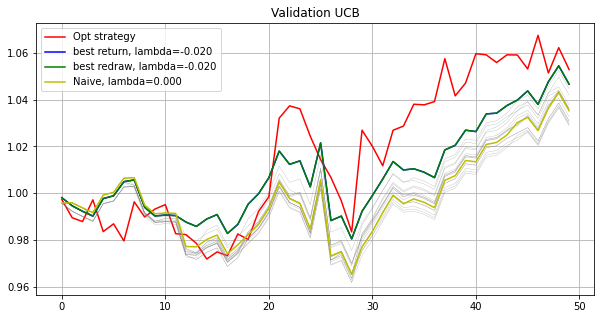

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.0834  0.2295  0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.0871
 -0.      0.      0.     -0.      0.     -0.      0.     -0.      0.3
  0.      0.3     0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
1.0041934755438557
[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.0665 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.


[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.0619  0.      0.      0.2154 -0.
  0.3     0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.      0.3
  0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.1227 -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
1.020497488167712
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0415 -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0. 

[ 0.    0.    0.    0.   -0.    0.   -0.    0.   -0.   -0.   -0.    0.
 -0.   -0.   -0.    0.25 -0.    0.   -0.   -0.    0.    0.    0.   -0.
  0.    0.3  -0.    0.    0.    0.    0.   -0.    0.    0.   -0.   -0.
  0.15  0.   -0.    0.    0.    0.   -0.    0.    0.3  -0.    0.   -0.
 -0.    0.    0.   -0.   -0.   -0.   -0.    0.   -0.    0.   -0.    0.
  0.    0.   -0.    0.    0.    0.    0.    0.    0.   -0.    0.    0.
 -0.   -0.   -0.   -0.   -0.    0.   -0.    0.   -0.   -0.   -0.   -0.
 -0.    0.   -0.   -0.   -0.   -0.    0.   -0.    0.   -0.   -0.   -0.
 -0.    0.    0.   -0.  ]
1.0185591142027688
[ 0.      0.1565 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.1153  0.     -0.     -0.     -0.      

[ 0.      0.0558 -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.1571  0.     -0.     -0.      0.     -0.      0.2954 -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1917 -0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9999537348731985
[ 0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
  0.3    -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0. 

[ 0.      0.      0.      0.      0.0463  0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.0891  0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.1185 -0.      0.      0.1212  0.
  0.      0.1843  0.      0.      0.     -0.      0.      0.      0.0009
  0.     -0.      0.     -0.      0.0546 -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.0853  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
0.9987440949507633
[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.3    -0.      0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 

[ 0.      0.3     0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.0493 -0.     -0.
  0.      0.2048  0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.3
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.1459 -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.    ]
0.9926724337593373
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.1282  0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.

[ 0.      0.2743 -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1257  0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0072297334480744
[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.      0.0526 -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.
  0.

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1209 0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.1944 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.05   0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0347 0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9994829407711447
[ 0.1845  0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.1534 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.1598 -0.      0.  

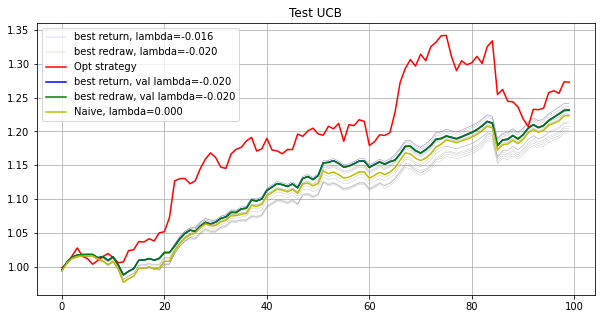

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[-0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.3
 -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.   0.  -0.   0.3 -0.  -0.   0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.   0.1  0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
0.9834223557922829
[ 0.0129  0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.139   0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.  

[-0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.1588  0.0804  0.      0.      0.     -0.     -0.      0.
  0.      0.      0.1101 -0.      0.      0.     -0.     -0.     -0.
 -0.      0.0508 -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.3    -0.      0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.
 -0.    ]
1.0232589286859701
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2301 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0. 

[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1075  0.      0.
  0.      0.      0.      0.0634 -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.1226  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0527  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.0538  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.    ]
1.015970129379776
[-0.     -0.     -0.     -0.      0.1408 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.      0.0443  0.0557  0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.3     0.3    -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
0.9867938535908922
[0.     0.     0.     0.     0.     0.0395 0.     0.     0.     0.0448
 0.     0.     0.     0.     0.     0.     0.     0.     0.1735 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.    

[-0.     -0.     -0.     -0.     -0.      0.164  -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0254 -0.     -0.
 -0.      0.3    -0.      0.0375 -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1001 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1358 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0217 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2155 -0.     -0.
 -0.    ]
1.0037780956083628
[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.1819  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0. 

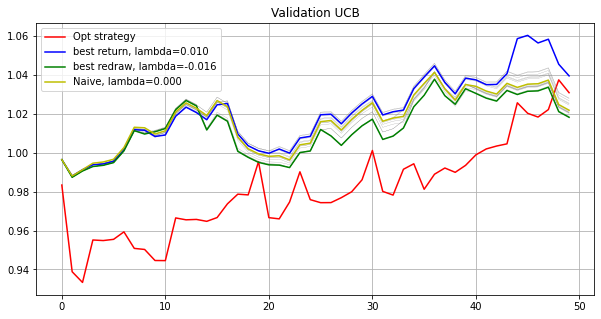

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.   0.   0.   0.1  0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0. ]
1.0009577433762322
[ 0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1523 -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.3    -0.      0.      0.
  0.     -0.      0.3     0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.2477  0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.     

[-0.   0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.3
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.1 -0.   0.  -0.   0.
  0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.
 -0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.
 -0.  -0.  -0.  -0.   0.3  0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
  0.  -0. ]
1.0064092710782355
[ 0.1016 -0.     -0.     -0.     -0.      0.091  -0.     -0.     -0.
 -0.     -0.      0.0169 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.      0.1904
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.

[ 0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.2226  0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.1774
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.3    -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0014280934555109
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.1468  0.      0.      0.      0.      0.      0.2429  0.      0.
  0.      0.      0.      0.0898  0.      0.      0.      0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0818 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.3     0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.075
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.0427 -0.
 -0.     -0.      0.027  -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.1735 -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.    ]
0.9991700563843747
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -

[ 0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.3    -0.     -0.     -0.      0.0208  0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.177   0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2022 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0111089114530087
[-0.  -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.
  0.   0.  -0.   0.   0.   0.3 -0.  -0.  -0.   0.   0.3 -0.  -0.   0.
 

[ 0.0334  0.2826 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0528 -0.     -0.     -0.      0.0452 -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0292 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1002
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1566 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9990233656192609
[-0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.0341 -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.3     0.      0.     -0.      0.      0.     -0.      0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0141 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.0859 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0096813488130105
[ 0.2089  0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.2847  0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
 -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0336 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0664 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0198675478689105
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.2352  0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0. 

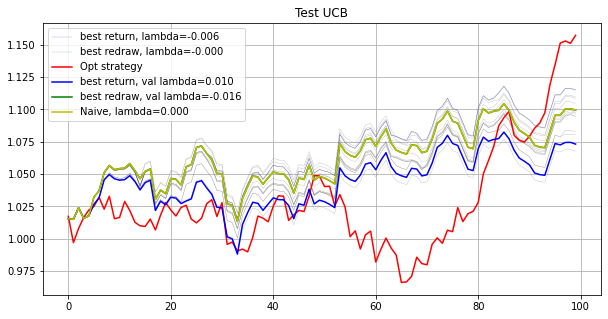

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.1395 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0007
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.3    -0.
  0.2598 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0115895584610308
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0007 -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.0279 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0729
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9870056837374624
[ 0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.      0.0124 -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0876 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0068698232227693
[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.1337
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.


[ 0.      0.      0.0603  0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.2176  0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.2423
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.3     0.     -0.      0.
  0.1799]
1.0015210841839304
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2797 0.     0.     0.     0.     0.
 0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.1003 -0.     -0.     -0.
 -0.     -0.     -0.      0.0004 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9861316381732345
Opt strategy   Total log return: 0.09676298    Max redraw: 0.04364695
Total return: 1.10159924
Mean return: 1.00193713
UCB strategy
lambda: -0.020   Total log return: 0.03696350    Max redraw: 0.03625933
lambda: 

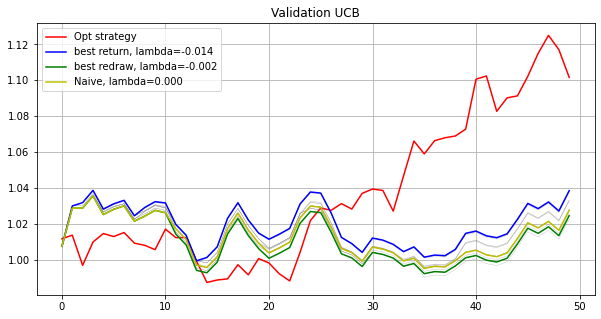

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1
 -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
  0.   0.3 -0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.3  0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
0.9878832756661997
[0.     0.     0.     0.0222 0.0047 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2717
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0854 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.016  0.     0.     0.     0.     0.
 0.  

[0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.3   0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.254 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.3
 0.    0.    0.    0.146]
1.015613191025483
[-0.   0.  -0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.3
  0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.
  0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.  -0.   0.   0.  -0.   0.   0.   0.

[ 0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.      0.0548 -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.2046 -0.     -0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.1406
 -0.     -0.     -0.     -0.      0.      0.3     0.     -0.      0.
 -0.    ]
1.001108708721695
[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.281   0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0322 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1416 -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.2262 -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0021039750634988
[ 0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0. 

[ 0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
1.0071891847189112
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0178 -0.    

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0714 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0286 0.     0.     0.     0.3    0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9829859557189308
[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.3

[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.1428 -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.2664  0.3     0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.1495  0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.1413  0.      0.
  0.    ]
1.007572915372025
[0.     0.     0.1026 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1174 0.  

[-0.      0.0006 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.03   -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0232 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.      0.048  -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.016658353219428
[ 0.      0.      0.2289  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0821  0.      0.      0.      0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
  0. 

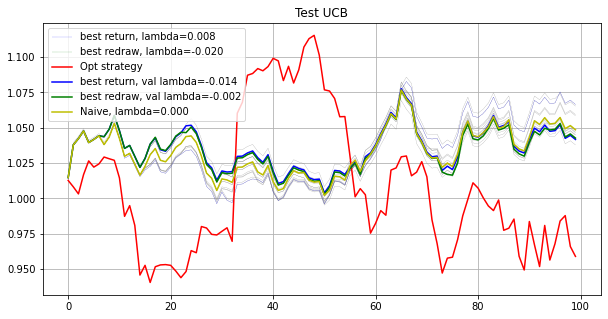

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[-0.  -0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.3  0.  -0.   0.   0.   0.   0.   0.  -0.  -0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.   0.1
  0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.
  0.   0.   0.3  0.   0.   0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.
  0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0. ]
1.019785409048426
[0.     0.1518 0.     0.     0.     0.     0.2956 0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.151  0.     0.     0.     0.     0.0259
 0.     0.     0.     0.     0.     0.0756 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.  

[ 0.     -0.     -0.      0.3    -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.3     0.     -0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.3     0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.0834 -0.      0.     -0.      0.      0.      0.0166  0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.    ]
0.9904357586286818
[-0.     -0.     -0.      0.1134 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0. 

[-0.      0.2267 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0236
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2964 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1545 -0.     -0.
 -0.    ]
1.0117175311276967
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.2598  0.     -0.
 

[ 0.      0.      0.      0.      0.      0.      0.      0.0368  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.1915  0.      0.      0.      0.      0.      0.0286
  0.      0.      0.     -0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.1938  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.1967  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0525
  0.    ]
1.021483859117352
[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.     -0

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0899  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0335  0.      0.      0.
  0.      0.259   0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0176  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3    -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
1.002707538052881
Opt strategy   Total log return: 0.17475700    Max redraw: 0.08532308
Total return: 1.19095677
Mean return: 1.00350126
UCB strategy
lambda: -0.020   Total log return: 0.04493265    Max redraw: 0.03606477
lambda: 

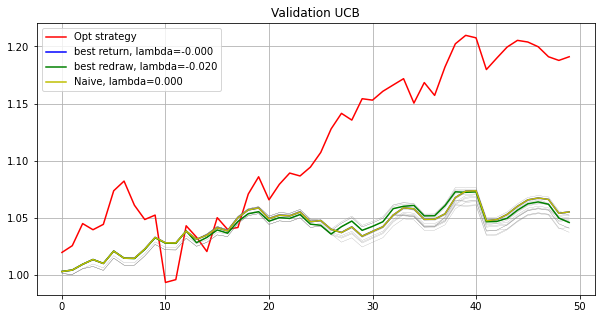

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.      0.1029 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.2971 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.976116251070418
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0144 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.  

[ 0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0313 -0.     -0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.072  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.      0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0232 -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.2853 -0.     -0.     -0.     -0.      0.0676 -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.029  -0.     -0.     -0.     -0.     -0.     -0.
  0.1915]
1.010621686266077
[ 0.      0.0501  0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.3     0.     -0.
 -0.      0.     -0.      0.      0.     -0.      0.0499  0.     -0.
  0.  

[ 0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.0742  0.1049
 -0.      0.      0.     -0.     -0.      0.      0.      0.2209  0.
  0.     -0.      0.     -0.     -0.      0.3    -0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
 -0.    ]
0.9949282704283873
[ 0.      0.     -0.      0.     -0.     -0.      0.197  -0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.0878  0.     -0.
 

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.0062 -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.0938  0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3     0.3     0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.000701690308241
[0.     0.1009 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.  

[ 0.      0.2278 -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1799 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2923 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0033122264986638
[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.0778 -0.      0.     -0.      0.     -0.      0.0125
 

[-0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0064 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0936 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0103176398582439
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0926
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 

[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.
 -0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.3  0.   0.
 -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.   0.  -0.
 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.3  0.
 -0.  -0. ]
1.010483340291531
[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0605  0.0413
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2466 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1104 -0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
  0.0896 -0.     -0.     -0.     -0.      0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.1399 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.1705 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
1.0077395078772196
[ 0.      0.1584  0.      0.      0.     -0.      0.      0.      0.0427
 -0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.3     0.     -0.
 

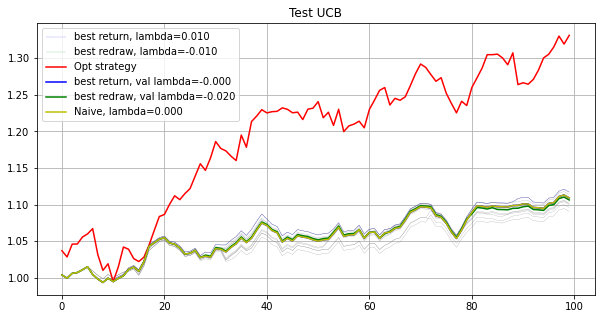

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.0804 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1117 -0.     -0.      0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2079 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9897695864852615
[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.
 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0662 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0338
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
1.0006539908811893
[-0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.3     0.
  0.      0.      0.     

[-0.  -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.   0.  -0.  -0.  -0.   0.   0.3 -0.   0.  -0.   0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.3 -0.   0.   0.  -0.   0.  -0.   0.   0.
 -0.   0.1  0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.   0.
 -0.   0. ]
0.9872929687649881
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0286 -0.     -0.     -0.     -0.
 -0.     -0.      0.1027 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2687 

[-0.     -0.      0.0997 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.024  -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.045  -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.      0.1466  0.0847 -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9526719784859681
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -

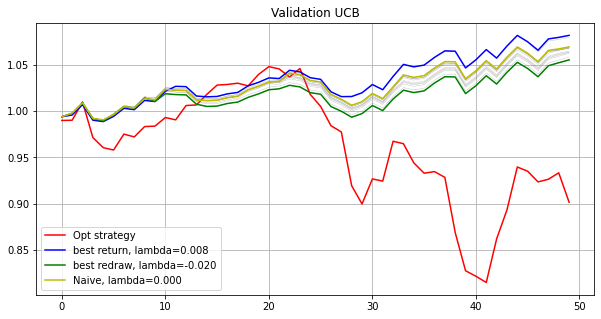

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[-0.     -0.      0.1752 -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.3     0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1799 -0.     -0.     -0.     -0.      0.0449 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0173814137640713
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.
 -

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0021 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2267 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1712
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0022125179505355
[ 0.      0.      0.2477  0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.3    -0.
 

[-0.  -0.   0.1  0.   0.  -0.  -0.  -0.   0.  -0.   0.   0.   0.   0.
 -0.   0.   0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.3  0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.
 -0.  -0.   0.   0.3 -0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.
 -0.   0.   0.   0.  -0.  -0.   0.3  0.  -0.   0.   0.  -0.  -0.   0.
  0.   0. ]
0.9725558156872365
[0.     0.     0.     0.     0.2757 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0345 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.

[-0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.1 -0.   0.
  0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.
  0.  -0.   0.   0.   0.3  0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.
 -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.
 -0.  -0.   0.   0.3 -0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.  -0.  -0.   0.   0.   0.3  0.   0.  -0.  -0.   0.
 -0.   0. ]
0.9773512514806522
[ 0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.  -0.   0.  -0.
 -0.   0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.
 -0.   0.   0.   0.   0.   0.3  0.   0.  -0.   0.   0.   0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0308 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0692 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0348512387740951
[-0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.
  0.  -0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2526 0.     0.     0.     0.     0.
 0.0972 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0503 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9924871510055198
[ 0.     0.     0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.     0.    -0.    -0.     0.    -0.     0.
 -0.     0.     0.3   -0.    -0.    -0.    -0.     0.    -0.    -0.
 -0.     0.    -0.     0.    -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0321 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0679 -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9970765686987265
[-0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -

[ 0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.236   0.1082 -0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0558
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.3     0.      0.      0.      0.      0.      0.
  0.    ]
1.02306754624115
[ 0.      0.      0.1564  0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.3     0.1669  0.     -0.      0.      0.     -0.
  0

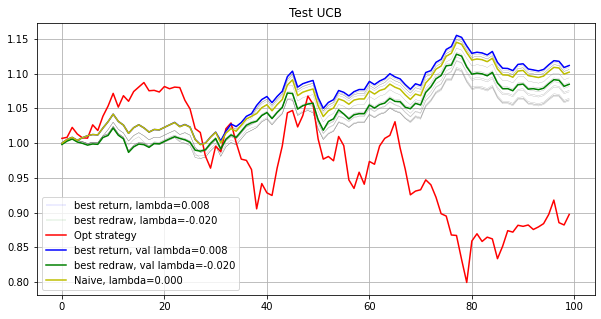

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[ 0.3 -0.   0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.1 -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.   0.  -0.   0.   0.3  0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.
  0.  -0.   0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.3  0.   0.
  0.  -0. ]
0.981199850246623
[0.2486 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.0949 0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.0091 -0.
 -0.     -0.      0.3     0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0891
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.0559 -0.     -0.     -0.     -0.     -0.     -0.      0.0129 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.233  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.017227737893721
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1283 -0.     -0.     -0.     -0.     -0.     -0.
 -

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.3  0.   0.   0.   0.1 -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.
  0.   0. ]
1.0020747317467638
[ 0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.3     0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.3     0.
  0.1355  0.2645  0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.     

[ 0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.0766  0.     -0.      0.0276  0.      0.0884 -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.2074  0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.    ]
1.0035554873377202
[-0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.   0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.3  0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.
 -

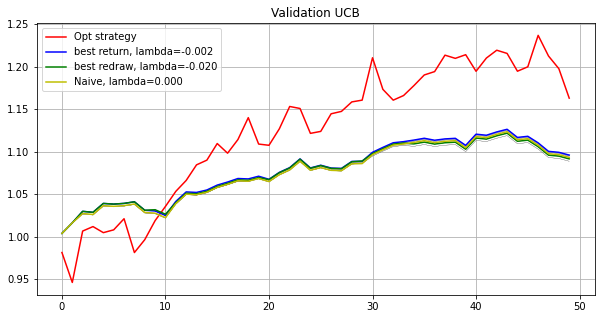

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.2089 0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1911 0.     0.     0.     0.    ]
0.9960129416751649
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.233  0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3 -0.  -0.
  0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.  -0.  -0.  -0.   0.
  0.   0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.   0.   0.  -0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.3  0.   0.   0.1  0.
 -0.  -0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.3  0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.
  0.  -0. ]
0.9975534308808718
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.1376 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2619 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.251  0.     0.     0.     0.     0.2838 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1652 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9997985451860502
[ 0.2876  0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.0826  0.     -0.     -0.  

[-0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.3    -0.     -0.      0.0353 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0647  0.3    -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.    ]
0.9757050889595245
[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0. 

[ 0.3 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.
  0.  -0.  -0.  -0.   0.  -0.   0.3  0.  -0.   0.  -0.   0.   0.   0.
  0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.3  0.  -0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.
  0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.1  0.   0.  -0.   0.
  0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.   0.  -0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
1.0769589449402872
[ 0.      0.      0.      0.      0.      0.2727  0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.      0.1126
 -0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.0103  0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.1675 -0.      0.      0.      0.      0.      0.      0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0095
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.3
  0.0905  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9951179897460076
[ 0.0512 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.


[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.1143 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.1078
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.1751 0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0012 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9939723612808601
[ 0.3     0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.2439  0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.1561 -0.
 -0.      0.      0.     -

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.3
 -0.      0.     -0.      0.      0.3    -0.      0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.1959 -0.     -0.      0.      0.     -0.      0.2041
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9504408306725974
[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.0769 -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.


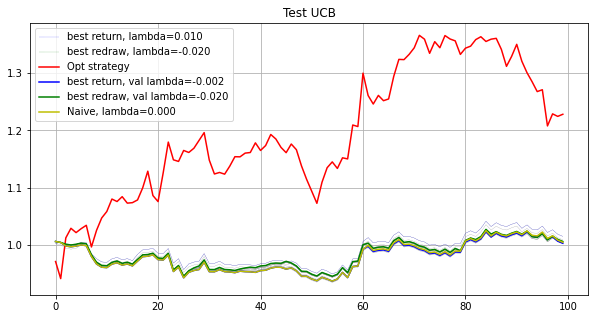

-----------------------------Final result-----------------------------
Opt strategy
Total return: 2.40277901
Mean return: 1.00109638
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


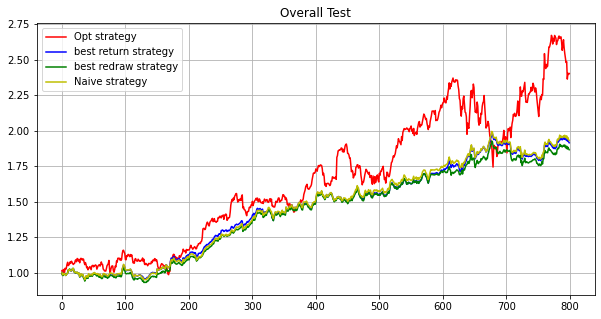

In [109]:
opt_lst=run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002), delta=3)

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[-0.    -0.     0.    -0.     0.128 -0.    -0.     0.     0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.     0.    -0.
  0.     0.3    0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.    -0.    -0.    -0.    -0.     0.    -0.    -0.     0.
 -0.     0.    -0.    -0.    -0.    -0.     0.    -0.    -0.     0.3
 -0.    -0.    -0.    -0.    -0.     0.     0.    -0.    -0.     0.
 -0.     0.272 -0.    -0.     0.    -0.     0.    -0.    -0.    -0.
 -0.    -0.    -0.     0.     0.    -0.     0.     0.    -0.    -0.
 -0.    -0.     0.    -0.    -0.     0.    -0.    -0.     0.     0.
  0.     0.     0.    -0.    -0.    -0.    -0.    -0.     0.     0.   ]
1.0430107274636025
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.1883  0.      0.     -0.     -0.
 -0.     -0.     -0.      0.2002  0.3    -0.     -0.      0.1407 -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.1707 -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.    ]
0.9988655825862673
[ 0.   0.  -0.   0.3  0.3  0.   0.  -0.  -0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.  -0.   0.
  0.   0.   0.  -0.   0.   0.   0.1  0.   0.   0.   0.  -0.   0.3 -0.
  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.1392 -0.     -0.      0.0127 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.2481 -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
1.0215464594876695
[-0.     -0.      0.     -0.      0.2437  0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.1563 -0.      0.
 -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.3     0.     -0.      0.1184 -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.0263 -0.     -0.     -0.     -0.      0.
 -0.      0.3    -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.      0.2553 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
0.9915832219383462
[ 0.      0.      0.      0.      0.      0.      0.      0.0868  0.
  0.      0.      0.      0.      0.      0.1678  0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0. 

UCB strategy
lambda: -0.020   Total log return: 0.04566691    Max redraw: 0.06332431
lambda: -0.018   Total log return: 0.04399445    Max redraw: 0.06332431
lambda: -0.016   Total log return: 0.04444168    Max redraw: 0.06332431
lambda: -0.014   Total log return: 0.04402569    Max redraw: 0.06332431
lambda: -0.012   Total log return: 0.04249588    Max redraw: 0.06332431
lambda: -0.010   Total log return: 0.04249588    Max redraw: 0.06332431
lambda: -0.008   Total log return: 0.04719578    Max redraw: 0.06332431
lambda: -0.006   Total log return: 0.04529941    Max redraw: 0.06332431
lambda: -0.004   Total log return: 0.04649856    Max redraw: 0.06332431
lambda: -0.002   Total log return: 0.04649856    Max redraw: 0.06332431
lambda: -0.000   Total log return: 0.04649856    Max redraw: 0.06332431
lambda: 0.002   Total log return: 0.04202338    Max redraw: 0.06332431
lambda: 0.004   Total log return: 0.04506711    Max redraw: 0.06332431
lambda: 0.006   Total log return: 0.04362623    Max r

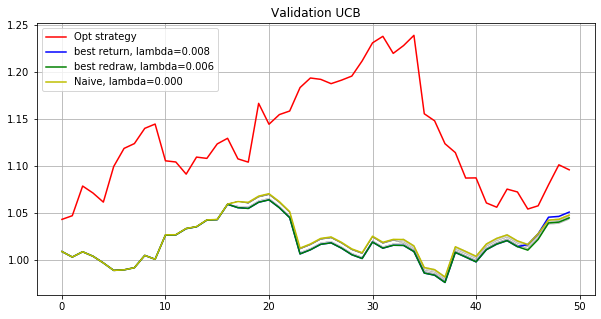

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.      0.      0.0963
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.      0.299   0.0117  0.     -0.      0.      0.      0.
  0.1045  0.1885  0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.3     0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
 -0.    ]
0.9779650769027448
[-0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.1994
  0.      0.      0.     -0.      0.      0.      0.     -0.      

[ 0.     -0.     -0.      0.2513  0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.0369 -0.     -0.     -0.      0.      0.1365
 -0.      0.      0.     -0.      0.0944  0.      0.     -0.      0.
 -0.      0.      0.1809 -0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.3    -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.    ]
1.0176523720459782
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.      0.0105 -0.     -0.     -0.     -0.     -0.     -0.
 

[ 0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.3  0.   0.3  0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.  -0.   0.1  0.
 -0.   0. ]
1.0080306546451103
[ 0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.      0.0352 -0.      0.      0.
 -0.      0.      0.1764  0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.09    0.3     0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.      0.0984 

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.1815  0.     -0.      0.      0.0327 -0.      0.0749  0.      0.
  0.      0.      0.1046  0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.3     0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.0063  0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
0.988403778886202
[ 0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.      0.2187 -0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.  

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.1552
  0.      0.      0.      0.3     0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.0024  0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.3     0.     -0.      0.1102 -0.      0.     -0.
 -0.      0.     -0.      0.      0.0381  0.      0.      0.      0.0941
 -0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.    ]
1.0041193708632736
[ 0.      0.     -0.      0.      0.1378  0.      0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.1486
  0.      0.      0.3     0.     -0.     -0.      0.      0.  

[-0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.3     0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.0187 -0.     -0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.0813  0.      0.
 -0.      0.      0.     -0.     -0.      0.3     0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
0.9979863110633753
[-0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.0074 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0. 

[-0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1015
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9989730624162341
[-0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1107
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     

[ 0.      0.     -0.      0.      0.2927 -0.      0.05    0.0834 -0.
  0.0458  0.      0.     -0.     -0.      0.     -0.      0.      0.0813
 -0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.      0.0744
  0.     -0.     -0.      0.      0.      0.      0.1799  0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.0543 -0.     -0.     -0.      0.
 -0.      0.1383  0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.    ]
0.9876034530575608
[ 0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0822
 -0.     -0.      0.0143  0.185  -0.     -0.     -0.      0.  

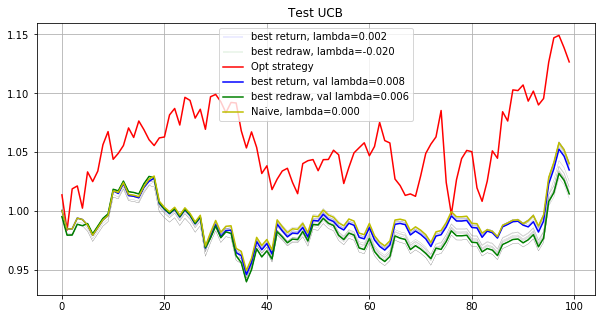

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.0067 -0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.0986  0.     -0.
 -0.      0.      0.      0.      0.      0.      0.0274 -0.     -0.
  0.     -0.     -0.      0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.0304  0.      0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.      0.3     0.
 -0.     -0.      0.      0.0772  0.      0.      0.     -0.      0.
  0.      0.1924 -0.      0.     -0.      0.     -0.      0.     -0.
  0.1036 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.1517  0.     -0.      0.     -0.     -0.      0.     -0.
  0.0118]
0.9873330881811946
[-0.     -0.      0.3     0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.    

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1442
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.0154 -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.0458 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.0463 -0.      0.     -0.     -0.     -0.
 -0.      0.2394 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.209  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0050645824402977
[ 0.0791  0.      0.1194  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0646  0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3


[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.      0.2519 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0557 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2989 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0941 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0077828904316604
[-0.     -0.     -0.      0.3     0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.

[ 0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.3     0.      0.     -0.
  0.      0.      0.      0.1851  0.     -0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.104   0.      0.      0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.111
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.    ]
0.9924574759430591
[ 0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.
  0.     -0.      0.      0.0709  0.      0.      0.      0.     -0.
  

[ 0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.0095  0.      0.      0.     -0.      0.     -0.
  0.      0.      0.3    -0.      0.      0.      0.      0.      0.
  0.      0.      0.0905  0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.      0.3     0.      0.3     0.     -0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
1.0094191670464787
Opt strategy   Total log return: 0.05687316    Max redraw: 0.06070635
Total return: 1.05852154
Mean return: 1.00113811
UCB strategy
lambda: -0.020   Total log return: 0.02912450    Max redraw: 0.03173711
lambda: 

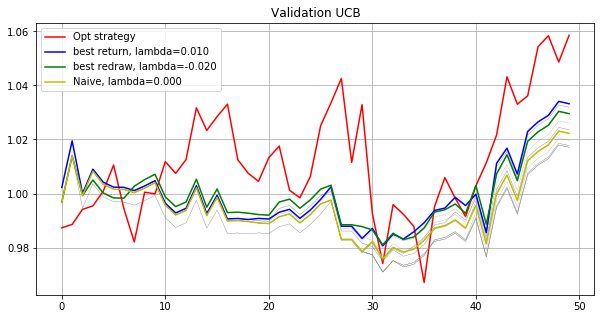

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[-0.     -0.     -0.      0.0428 -0.      0.      0.     -0.      0.1888
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.247
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.0231  0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.3     0.
 -0.     -0.     -0.      0.1983 -0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9907919513652861
[ 0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.2049 -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.      0.     -0

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.0176 -0.      0.3    -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.      0.      0.1674 -0.     -0.      0.2149  0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.      0.3     0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
  0.    ]
1.0129551426028944
[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.3     0.     -0.      0.
 -0.     -0.      0.      0.2191  0.      0.     -0.     -0.      0.
  0. 

[-0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.1827  0.3     0.2958 -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.2215 -0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.    ]
1.0088996809356408
[ 0.     -0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.2987  0.3     0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0. 

[-0.     -0.     -0.      0.      0.     -0.     -0.      0.      0.1051
 -0.     -0.      0.      0.      0.     -0.      0.0854 -0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.3     0.0284 -0.      0.      0.0012
  0.     -0.      0.      0.3     0.0031  0.1768 -0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.000826715398012
[ 0.1024  0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.2119 -0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.      0.3    -0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1441  0.     -0.      0.0372 -0.      0.     -0.     -0.
  0.2504  0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.2683 -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0122230259297966
[-0.     -0.      0.2278  0.2187  0.      0.     -0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.0152  0.2383  0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0. 

[ 0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.      0.     -0.      0.1401 -0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.2428  0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.0171
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.3     0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.3     0.      0.     -0.     -0.     -0.
  0.    ]
0.9831040510088169
[ 0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.
  0.   0.3 -0.  -0.  -0.  -0.   0.   0.3  0.   0.  -0.  -0.  -0.  -0.
 -0.   0.  -0.   0.3  0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0

[ 0.      0.      0.     -0.     -0.      0.      0.     -0.      0.1344
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.      0.0504  0.      0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.0568  0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.      0.3
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.3    -0.
  0.     -0.     -0.     -0.     -0.      0.      0.1585 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9781922385309915
[ 0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.0697 -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.     -0.


[-0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.1547  0.      0.      0.
  0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.2873  0.     -0.      0.
 -0.     -0.      0.     -0.      0.1795  0.     -0.     -0.     -0.
 -0.      0.      0.2831 -0.      0.      0.      0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.0955 -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
1.0081704689527933
[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.085
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.      0.     -0.     -0.     -0.
 -

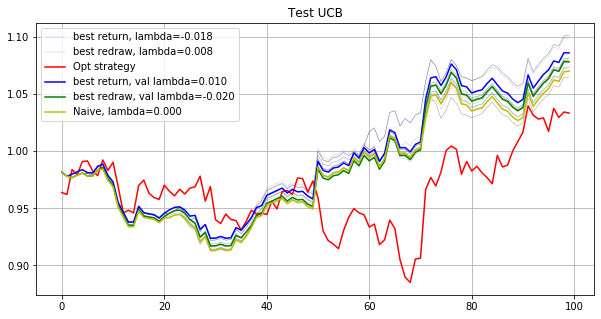

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.1735  0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.226  -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.0548
  0.      0.      0.1089 -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.1318 -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.0049
  0.    ]
0.9964456080000498
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.    

[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.0658  0.     -0.      0.      0.0269  0.      0.     -0.
  0.213  -0.      0.      0.      0.      0.0279  0.      0.     -0.
  0.      0.      0.2012  0.     -0.      0.      0.0717 -0.      0.
  0.0343  0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.0592  0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
0.9989962219161497
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.187   0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0. 

[ 0.      0.0215  0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.1206  0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.2433  0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.      0.      0.0146  0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.3     0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
0.9984807661252557
[ 0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.  -0.
 -0.   0.1 -0.  -0.   0.   0.  -0.  -0.   0.3 -0.  -0.   0.   0.   0.
 -

[-0.      0.0433 -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.3     0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0567
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.3    -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.008649479166286
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.0519  0.      0.      0.      0.      0.      0.      0.     -0.
 -

[ 0.0462  0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.0281 -0.     -0.     -0.     -0.     -0.      0.
  0.3    -0.      0.115   0.1011  0.     -0.      0.      0.     -0.
 -0.      0.      0.2445 -0.     -0.      0.     -0.     -0.     -0.
  0.      0.066  -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.0991 -0.      0.      0.
 -0.    ]
1.0120456231980401
[ 0.     -0.      0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.2351  0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0. 

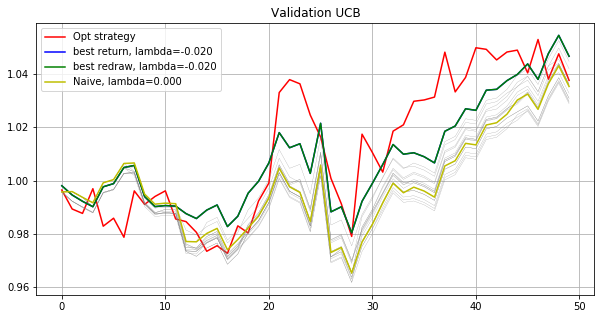

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.0902  0.184   0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.1022
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0236  0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
1.0045286456755878
[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.0603  0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.


[ 0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.0828 -0.      0.      0.1715 -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0053 -0.     -0.      0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1403 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0195315620975243
[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.0555 -0.
  0.     -0.      0.238   0.      0.     -0.      0.      0.     -0.
  0.

[ 0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.2157 -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.2636 -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.185  -0.     -0.      0.     -0.      0.     -0.     -0.      0.3
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.0071 -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0286  0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0206801527887932
[ 0.      0.1082 -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.

[-0.      0.0505 -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.3     0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.1695 -0.      0.      0.     -0.      0.      0.2632  0.
  0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.      0.2168  0.     -0.      0.      0.      0.     -0.
 -0.    ]
0.9987732433405517
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0. 

[ 0.      0.     -0.      0.      0.0391  0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.2462  0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.0914  0.     -0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.1111 -0.      0.      0.1054 -0.
  0.      0.1468 -0.     -0.      0.     -0.     -0.      0.      0.0402
 -0.      0.     -0.     -0.      0.0701 -0.      0.      0.     -0.
  0.     -0.     -0.      0.      0.104   0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.0457 -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.    ]
1.0003214195944488
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.      0.      0.3    -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 

[-0.      0.2241 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.      0.0986  0.     -0.
  0.      0.1883 -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.1889  0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.    ]
0.9918291773753793
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.111   0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.

[-0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.1118  0.     -0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.2808
  0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.1328 -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.      0.1746 -0.      0.     -0.      0.      0.      0.      0.
  0.    ]
1.0020613123161617
[ 0.      0.2029  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.1781  0.      0.0115  0.      0.      0.
 

[ 0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.0234 -0.      0.      0.1722  0.      0.     -0.
 -0.     -0.      0.      0.      0.      0.0515  0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0321  0.     -0.      0.     -0.      0.     -0.      0.3
  0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.     -0.
 -0.      0.1208 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.    ]
1.020240863691747
[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.1011  0.      0.     -0.      0.      0.     -0.
  0.

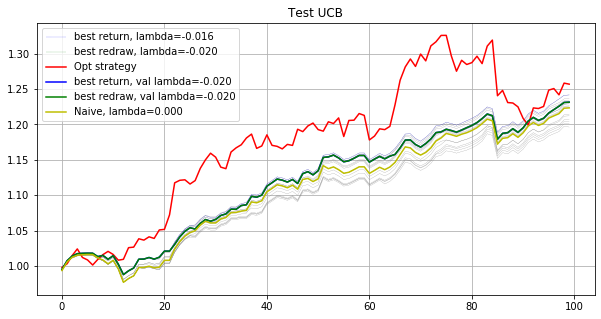

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[ 0.   0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.   0.3
  0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.
  0.   0.   0.  -0.  -0.  -0.   0.3  0.   0.  -0.   0.   0.   0.  -0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.  -0.
  0.  -0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.
  0.  -0.   0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
  0.  -0.  -0.   0.   0.1  0.3 -0.   0.   0.  -0.  -0.   0.  -0.   0.
 -0.   0. ]
0.9834223557922829
[ 0.0176 -0.      0.      0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.      0.1095 -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.3     0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.  

[ 0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
  0.      0.1261  0.0802  0.     -0.      0.      0.      0.      0.
 -0.      0.      0.1183  0.     -0.     -0.      0.      0.      0.
  0.      0.0754  0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.3     0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.3     0.      0.
  0.    ]
1.0236492987638808
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1661  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0. 

[ 0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0895 -0.      0.
 -0.     -0.     -0.      0.0714  0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.1062 -0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.0835  0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.2552  0.0943 -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.3    -0.     -0.
  0.    ]
1.016807175353971
[ 0.      0.      0.      0.      0.0932  0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0123 -0.
 -0.      0.      0.0076 -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.      0.0521  0.0281  0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3     0.3    -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
0.9866063816644408
[-0.     -0.     -0.     -0.     -0.      0.0404 -0.     -0.     -0.
  0.0593 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.137  -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0. 

[ 0.      0.      0.     -0.     -0.      0.1137 -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0393 -0.     -0.
 -0.      0.3    -0.      0.0554 -0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.098   0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.1328  0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0756 -0.
 -0.      0.      0.     -0.     -0.      0.      0.1852 -0.     -0.
  0.    ]
1.0040277785218976
[-0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.1343  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0165  0.     -0.     -0.      0.      0.
  0. 

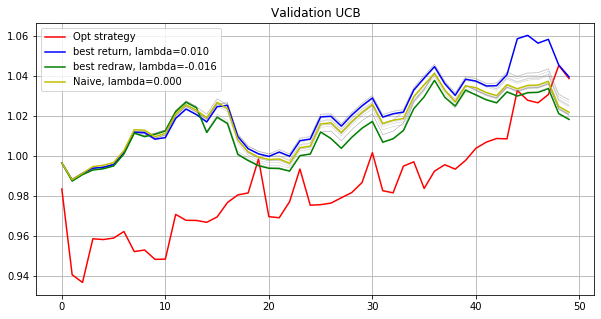

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0083 0.     0.1326 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.1923
 0.     0.     0.     0.0271 0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1955 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1428 0.     0.     0.     0.
 0.     0.     0.     0.0005 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9838737488685405
[ 0.0009 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2687 -0.      0.
 -0.     -0.      0.0052  0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0075 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.      0.1734
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.3     0.219
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9954133141463724
[-0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.     -0.      0.3    -0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.0694 -0.     -0.     -0

[ 0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.1136  0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.     -0.      0.102  -0.      0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.1188 -0.      0.
  0.     -0.      0.     -0.     -0.      0.      0.0609 -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.3    -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
  0.0951 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.0636
 -0.      0.146   0.     -0.     -0.     -0.     -0.      0.      0.
  0.    ]
0.993464238503589
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -

[ 0.     -0.     -0.     -0.      0.0352  0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.0714  0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.1509  0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.1425 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.    ]
1.0029802585162688
[ 0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.0764  0.     -0.     -0.     -0.      0.      0.2117 -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0. 

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.      0.3    -0.     -0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.0595  0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0405  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
 -0.    ]
1.0044565924344406
[-0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
  0. 

[ 0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.0183 -0.     -0.      0.2673 -0.      0.     -0.     -0.     -0.
  0.0654 -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.0211 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.0017
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.2837 -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.3    -0.     -0.      0.     -0.     -0.      0.0425 -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.    ]
1.0036872073069036
[ 0.0021 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.242  -0.     -0.     -0.     -0.     -0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1012 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.    ]
1.0060059410351656
[0.     0.0831 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0. 

[ 0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.123  -0.     -0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0064 -0.     -0.      0.     -0.     -0.      0.0616 -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.2191 -0.      0.055
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0972 -0.      0.1377 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
0.9982272695499077
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -

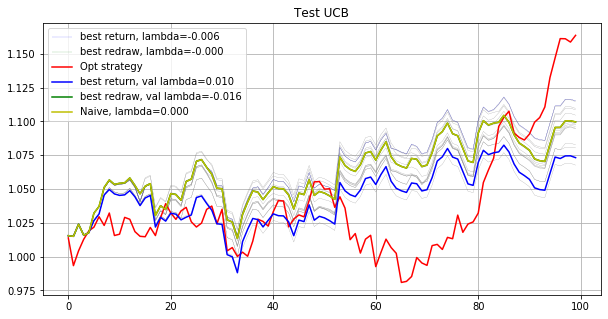

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.1049 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0618
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.3    -0.
  0.2334 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0120961632408179
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0174 -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.0277 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0549
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9877977332917258
[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
 

[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.     -0.      0.2289 -0.      0.      0.0377 -0.      0.3
  0.     -0.     -0.      0.      0.      0.     -0.      0.3    -0.
 -0.      0.002  -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.117   0.
  0.     -0.      0.      0.      0.     -0.      0.0144  0.      0.
 -0.    ]
1.0055502829611627
[ 0.      0.      0.     -0.     -0.      0.     -0.     -0.      0.1037
 -0.     -0.     -0.      0.      0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.


[ 0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.1774  0.      0.      0.2575  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.     -0.      0.
 -0.      0.      0.093   0.0929 -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.      0.0792  0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.    ]
1.0070716347187934
[-0.     -0.      0.0588 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.0011 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.      0.297  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.0925 -0.     -0.     -0.
 -0.     -0.     -0.      0.0121 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9862459627152449
Opt strategy   Total log return: 0.09100246    Max redraw: 0.04332788
Total return: 1.09527170
Mean return: 1.00182171
UCB strategy
lambda: -0.020   Total log return: 0.03696350    Max redraw: 0.03625933
lambda: 

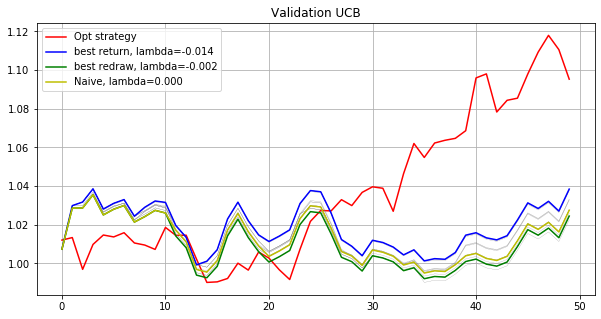

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.1639  0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.2032  0.      0.
  0.      0.      0.3    -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.0515 -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.0762  0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.0228  0.     -0.      0.1825  0.      0.     -0.     -0.      0.
  0.    ]
0.9981483759640156
[ 0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 

[-0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.3     0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.2616
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.1384  0.      0.      0.      0.
  0.    ]
0.9951786018316687
[ 0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.1091
  0.     -0.      0.0883  0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.2681  0.      0.001   0.      0.      0.      0.      0.      0.
  0.      0.2987  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.0404 -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0918  0.      0.      0.
  0.    ]
1.0923128622517673
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1223 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0. 

[-0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.0655  0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.2967  0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.0843  0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.2536
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
1.015004854380276
[ 0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -

[ 0.0069 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.0254  0.      0.      0.0676 -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.3     0.     -0.     -0.     -0.      0.
  0.3    -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
0.9946732281054098
[-0.     -0.      0.022  -0.      0.     -0.     -0.     -0.     -0.
  0.0324 -0.     -0.     -0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.3    -0.     -0.
 -0. 

[ 0.3    -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.1746  0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.2254  0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.3    -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.     -0.      0.
  0.    ]
0.989267272471069
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.  

[0.     0.     0.0469 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.1184 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.142  0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0024 0.     0.0017 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.0884]
0.9962394955538245
[-0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.1373  0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2224  0.2554 -0.     -0.     -0.      0.     -0.
  0.      0.      0.      0. 

[-0.      0.0041 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.034  -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0257 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.      0.0363 -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0168401934413693
[ 0.      0.      0.153  -0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.0802  0.     -0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.

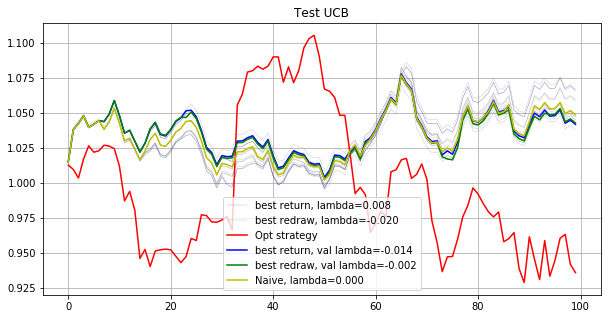

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.3    -0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2723 -0.
 -0.     -0.     -0.     -0.     -0.      0.1134 -0.     -0.     -0.
 -0.      0.0144 -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.3    -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0201264537411705
[ 0.      0.1091  0.      0.      0.     -0.      0.2078  0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.3     0.    

[ 0.      0.     -0.      0.3    -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.3     0.     -0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.      0.2728  0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
  0.0877  0.      0.      0.      0.      0.      0.0395  0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.    ]
0.9904206376039395
[ 0.      0.      0.      0.0874  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0. 

[-0.      0.1583 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.079
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2608 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0008 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2019 -0.     -0.
 -0.    ]
1.0103530277102915
[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.      0.3    -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.2318 -0.      0.
  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.0025 -0.
 -0.     -0.     -0.     -0.     -0.      0.0229 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1598 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2162 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0160571792082933
[ 0.      0.204   0.      0.      0.     -0.      0.0318  0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.1251  0.     -0.
 -0. 

lambda: -0.018   Total log return: 0.04514661    Max redraw: 0.03606477
lambda: -0.016   Total log return: 0.04458490    Max redraw: 0.03606477
lambda: -0.014   Total log return: 0.04556349    Max redraw: 0.03810206
lambda: -0.012   Total log return: 0.05092346    Max redraw: 0.03810206
lambda: -0.010   Total log return: 0.04015190    Max redraw: 0.03810206
lambda: -0.008   Total log return: 0.04015190    Max redraw: 0.03810206
lambda: -0.006   Total log return: 0.03671906    Max redraw: 0.03810206
lambda: -0.004   Total log return: 0.04086968    Max redraw: 0.03810206
lambda: -0.002   Total log return: 0.05368604    Max redraw: 0.03810206
lambda: -0.000   Total log return: 0.05377051    Max redraw: 0.03810206
lambda: 0.002   Total log return: 0.04953124    Max redraw: 0.03810206
lambda: 0.004   Total log return: 0.04696629    Max redraw: 0.03810206
lambda: 0.006   Total log return: 0.05112865    Max redraw: 0.03810206
lambda: 0.008   Total log return: 0.05199818    Max redraw: 0.03810

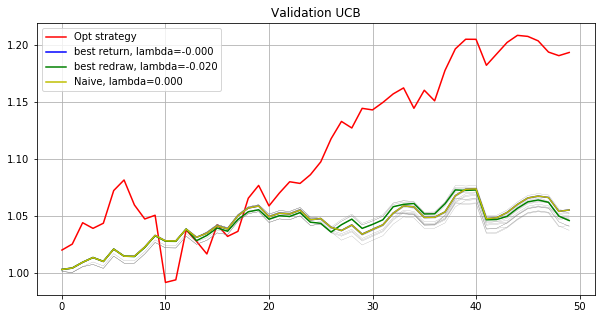

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.0822  0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.3    -0.      0.      0.0178  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
1.007943289802409
[-0.      0.1023  0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.3    -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.2977 -0.      0.
  0.  

[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.3     0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.0721 -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.0083 -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.0758  0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2187
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.0251
 -0.    ]
1.0133025719573605
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.039  0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0712 0.     0.     0.     0.     0.     0.     0.     0.
 0.

[-0.      0.0081  0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.3     0.3    -0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.3     0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.0919  0.      0.      0.      0.      0.      0.
 -0.    ]
0.9938444021481968
[ 0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.     -0.      0.0964  0.1145
 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2196 0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.1783 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0007 0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.9959030106938396
[-0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.0228 -0.     -0.
 -0.      0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.  

[ 0.      0.1565 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.1767 -0.     -0.
 -0.     -0.      0.0466 -0.     -0.      0.      0.0467 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.2734 -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3     0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0062585391954426
[-0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.3    -0.     -0.     -0.      0.     -0.      0.
  0. 

[ 0.      0.2237  0.      0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.3     0.      0.
  0.1422  0.      0.      0.      0.      0.      0.3     0.     -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0341  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
1.0029330470647866
[ 0.      0.     -0.      0.      0.     -0.      0.1929 -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.     -0.
 -0. 

[ 0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0474  0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.3     0.2392 -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.     -0.      0.0428
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.1292 -0.      0.      0.     -0.      0.0253
 -0.      0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.2161
  0.    ]
0.9941877226491028
[ 0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0078 -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.  

[ 0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.      0.      0.     -0.     -0.      0.199  -0.
 -0.      0.     -0.      0.      0.      0.061   0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.2027
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.2373 -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.3     0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
1.0016100548420472
[ 0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.      0.0753  0.      0.      0.     -0.      0.     -0.
 

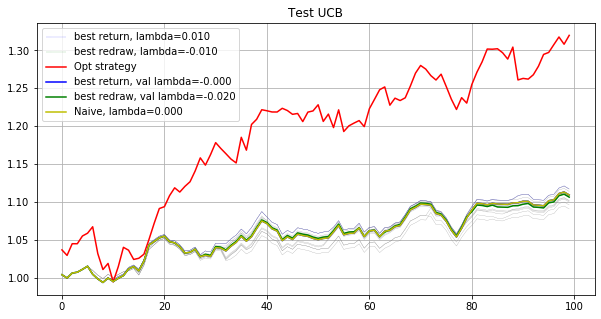

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.0667 -0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.3     0.      0.
 -0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.1335 -0.     -0.     -0.      0.      0.3     0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.1998 -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.    ]
0.9901166957259653
[-0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.   

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.2223 -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.0491 -0.     -0.      0.0762  0.     -0.
 -0.      0.3    -0.     -0.      0.0928  0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.0855  0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.     -0.      0.174   0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.    ]
0.994059465109694
[ 0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.2808  0.     -0.      0.      0.
  0.     -0.      0.3     0.     -0.      0.     -0.      0.0655  0.
 -0.  

[ 0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.1422  0.0354 -0.     -0.
 -0.      0.      0.133  -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.0052
  0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.1092 -0.      0.      0.194   0.     -0.
  0.     -0.      0.     -0.      0.0811 -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.3    -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.    ]
1.0083866444657448
[-0.     -0.      0.1462 -0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.      0.1846  0.1024  0.      0.
  0.     -0.      0.2668  0.     -0.      0.     -0.      0.      0.
 

[-0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.1725 -0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.3    -0.     -0.
 -0.      0.      0.     -0.     -0.      0.1038 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2204
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.2033 -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9869101295153232
[ 0.   0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.
 -0.   0.1 -0.  -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.
  0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.0019 -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.2873 -0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
  0.0067 -0.      0.     -0.      0.0215  0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.1278 -0.      0.      0.      0.2548  0.      0.      0.      0.
  0.      0.3     0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.    ]
1.003168194209776
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.     -0.      0.205   0.      0.     -0.
  0.      0.      0.3     0.      0.      0.      0.      0.0974  0.
  0.  

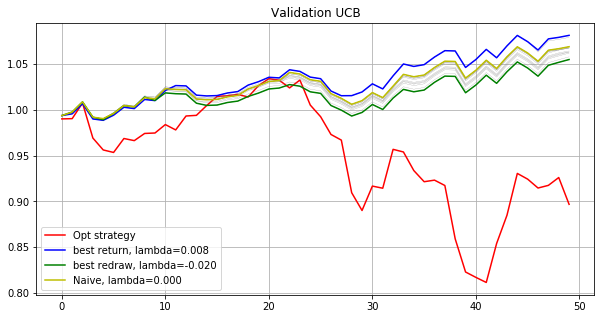

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.1  0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.   0.   0.
  0.   0. ]
0.9815606973878999
[-0.     -0.      0.0546 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.008  -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.      0.0947 -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.0312 -0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.3    -0.
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.1835  0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.3     0.      0.
  0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.0311  0.      0.     -0.      0.      0.      0.      0.1542
 -0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.    ]
1.002761052882138
[ 0.      0.      0.171   0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.3    -0.
  

[-0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
0.9725558156872364
[ 0.      0.      0.      0.      0.1935 -0.     -0.     -0.      0.
  0.      0.      0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.     -0.      0.      0.0776  0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     

[ 0.1686  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.0204 -0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.      0.3
 -0.      0.211  -0.     -0.     -0.      0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.    ]
1.0298892645438653
[ 0.      0.      0.      0.      0.0416  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.

[-0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.0297 -0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.      0.3     0.     -0.      0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.      0.0638  0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.0065 -0.      0.     -0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.3     0.      0.3     0.      0.     -0.     -0.     -0.      0.
  0.    ]
1.0349786220195594
[ 0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
  0. 

[ 0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.1922 -0.     -0.     -0.
 -0.      0.      0.0994 -0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.1083  0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
  0.3    -0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.    ]
0.9937880944865041
[-0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0438 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.0562 -0.     -0.
 -0.      0.3    -0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.3     0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9969356436762752
[ 0.      0.      0.      0.      0.2406  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0. 

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.1932  0.0991 -0.     -0.
 -0.      0.      0.0268 -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.0809
 -0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.3    -0.      0.3    -0.     -0.      0.     -0.      0.      0.
 -0.    ]
1.02499120331685
[ 0.      0.      0.1127  0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.3     0.1574  0.     -0.      0.      0.0228 -0.
  0

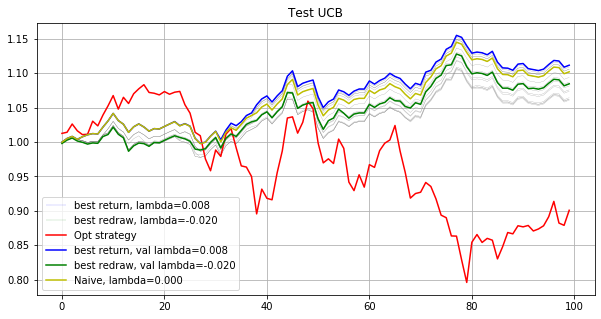

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[ 0.2466  0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.1172 -0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.0362 -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.3    -0.      0.     -0.
 -0.    ]
0.9831542102773505
[0.171  0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0

[ 0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0333 -0.
 -0.      0.      0.3    -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.0893
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.3     0.     -0.     -0.     -0.
  0.0735  0.     -0.     -0.     -0.     -0.     -0.      0.0418  0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.1621 -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
1.015791973443445
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1355 -0.     -0.     -0.     -0.     -0.     -0.
 -

[ 0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.
  0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.
  0.   0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.   0.   0.3 -0.
  0.   0.3  0.  -0.   0.   0.1  0.  -0.   0.   0.  -0.   0.   0.   0.
 -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0.  -0.
 -0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.3  0.  -0.  -0.   0.
 -0.  -0. ]
1.0020747317467638
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.3     0.
  0.1486  0.2189  0.      0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.2656
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.1344  0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.    ]
1.014747027926857
[ 0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.3     0.
 -0.     -0.      0.1364 -0.      0.     -0.     -0.     -0.      0.
 -

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.1748  0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.1396  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.0856  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.    ]
0.970290562395759
Opt strategy   Total log return: 0.14659565    Max redraw: 0.10398839
Total return: 1.15788568
Mean return: 1.00293622
UCB strategy
lambda: -0.020   Total log return: 0.08744965    Max redraw: 0.02303353
lambda: 

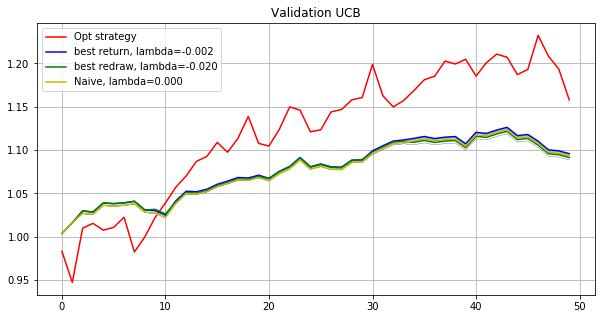

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[-0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.3     0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.2057  0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.1943 -0.     -0.      0.
  0.    ]
0.9960473249016767
[ 0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.165  -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0. 

[-0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.   0.1 -0.
 -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
  0.3 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
0.9975534308808718
[ 0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.1432 -0.     -0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.2285  0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.2643 -0.     -0.      0.0641 -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.     

[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.2055  0.     -0.      0.      0.      0.2643 -0.
  0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.2302  0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.      0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.    ]
1.0002732010209427
[ 0.2027  0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0. 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.2998 0.     0.     0.0639
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0679 0.2666 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
0.977355295515678
[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.3    -0.     -0.      0.      0.      0.3     0.
  0.     -0.      0.     -0

[ 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.247  0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.    -0.     0.     0.     0.     0.     0.     0.     0.     0.
 -0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.    -0.
  0.     0.     0.     0.     0.     0.153  0.     0.     0.     0.
  0.     0.    -0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   ]
1.0770620001765425
[ 0.      0.      0.      0.      0.      0.1909 -0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.0972
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.0457  0.     

[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.0455
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.      0.     -0.     -0.     -0.     -0.      0.3
  0.0545 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.    ]
0.9946634609055542
[ 0.0507 -0.     -0.     -0.     -0.      0.0195 -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.


[ 0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.1047 -0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.0979  0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.1605  0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.0369  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.    ]
0.9930365740039064
[ 0.3    -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.2081 -0.
  0. 

[ 0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.3
 -0.     -0.      0.     -0.      0.3     0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.1938 -0.     -0.     -0.     -0.     -0.      0.2062
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.    ]
0.950415646370251
[ 0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0892 -0.
 -0.     -0.      0.0059 -0.     -0.     -0.     -0.     -0.     -0.
 

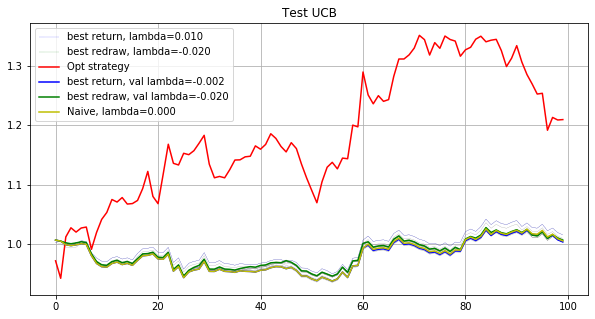

-----------------------------Final result-----------------------------
Opt strategy
Total return: 2.29160374
Mean return: 1.00103710
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


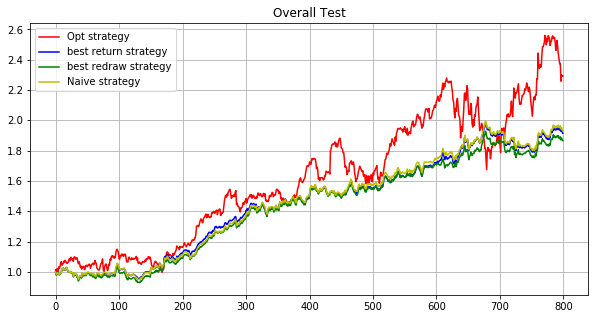

In [7]:
run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002), delta=5)

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.      0.      0.0996  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.3     0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.2368  0.0636
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.    ]
1.0425746543202383
[-0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.      0.

[ 0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.      0.1727  0.      0.      0.      0.
 -0.      0.      0.      0.1821  0.2799 -0.      0.      0.164   0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.2013  0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.    ]
0.9988225969061983
[-0.     -0.      0.      0.3     0.207   0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0. 

[-0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.3     0.      0.     -0.      0.3    -0.
  0.      0.      0.      0.1224  0.0286  0.      0.0701 -0.      0.
 -0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.1789  0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
1.0224853675041123
[ 0.     -0.     -0.     -0.      0.1924 -0.     -0.     -0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.     -0.      0.      0.      0.      0.2076  0.      0.
 -0. 

[-0.      0.      0.     -0.      0.      0.     -0.      0.      0.021
 -0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.0383 -0.     -0.
 -0.      0.1433  0.      0.     -0.     -0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.2049
 -0.      0.      0.3     0.      0.     -0.     -0.      0.     -0.
  0.0809  0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.2115  0.
  0.    ]
0.9441299726785631
[-0.     -0.     -0.     -0.      0.3    -0.     -0.      0.0412 -0.
  0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.2793 -0.     -0.     -0.     -0.     -0

[ 0.      0.     -0.      0.      0.0048 -0.      0.     -0.     -0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.0129 -0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.0823 -0.     -0.     -0.      0.      0.     -0.
 -0.      0.3    -0.      0.      0.3    -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0219796803627885
[-0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.      0.2114  0.      0.      0.0212 -0.     -0.
 -0.

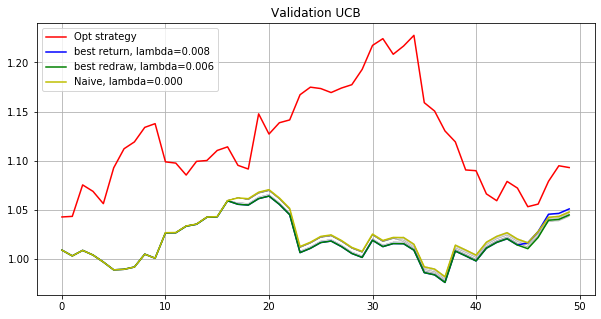

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.      0.     -0.      0.     -0.      0.02    0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1629
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
  0.0286 -0.     -0.     -0.      0.0351 -0.      0.1729 -0.     -0.
 -0.      0.      0.294  -0.      0.     -0.      0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.2866  0.
 -0.     -0.     -0.      0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0040294822297717
[ 0.      0.      0.      0.      0.      0.      0.      0.1418 -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.103  -0.      0.     -0.     -0.     -0.      0.0034  0.
 -0.      0.      0.     -0.      0.2102 -0.      0.0739  0.     -0.
 -0.     -0.      0.3     0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0095 -0.
 -0.     -0.      0.     -0.     -0.      0.3     0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.    ]
0.9886042110619508
[-0.     -0.      0.     -0.      0.0748 -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.1167  0.     -0.     -0.     -0.      0.
 -0. 

[-0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.0249 -0.
  0.      0.      0.2263  0.0895  0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.0593  0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.      0.3    -0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.    ]
0.9772305691438465
[-0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0. 

[ 0.      0.      0.      0.0143  0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.267   0.     -0.      0.      0.3    -0.     -0.     -0.      0.
  0.      0.      0.      0.0291  0.      0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.2985 -0.     -0.
  0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.0912  0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
  0.    ]
1.0246461978137333
[-0.     -0.     -0.     -0.      0.2161 -0.     -0.     -0.     -0.
  0.1034 -0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.0258  0.2002 -0.     -0.     -0.     -0.      0.
 -0. 

[-0.     -0.      0.     -0.      0.0966  0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.     -0.      0.     -0.      0.1274
  0.      0.      0.2041  0.0221  0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.      0.0314 -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.0858  0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.1327  0.      0.      0.3    -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.    ]
1.0057469824177974
[-0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.0959
  0.      0.      0.     -0.      0.      0.      0.     -0.      

[-0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.1238 -0.
  0.      0.      0.1045 -0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.1961 -0.      0.0523  0.     -0.
  0.     -0.      0.      0.      0.2795  0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.0755  0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.0363 -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.1319  0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
1.0148293461309859
[ 0.      0.     -0.      0.      0.015  -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1813  0.     -0.     -0.     -0.      0.     -0.
  0. 

[-0.     -0.      0.     -0.      0.      0.     -0.      0.0126  0.
 -0.      0.     -0.      0.      0.      0.116   0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.3
  0.      0.      0.     -0.     -0.      0.      0.2178  0.      0.
 -0.      0.      0.     -0.      0.      0.3     0.      0.0536 -0.
 -0.      0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
1.0144514237204567
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0131 -0.     -0.      0.1452 -0.     -0.     -0.     -0.     -0.
 -0.

[-0.      0.      0.     -0.      0.0749  0.     -0.      0.117   0.
  0.078   0.     -0.      0.      0.     -0.      0.     -0.      0.0135
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.1163  0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.1927 -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.1767 -0.      0.     -0.
 -0.      0.     -0.      0.      0.2121  0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.0189 -0.      0.
  0.    ]
1.0210057611860812
[0.     0.     0.     0.     0.     0.     0.     0.     0.0469 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1705 0.     0.     0.     0.     0.     0.1548 0.     0.     0.
 0.    

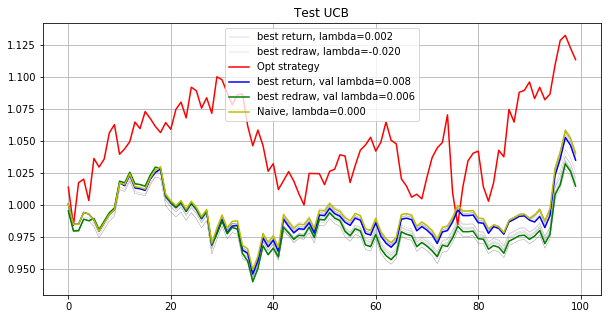

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.0151  0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.      0.0716 -0.     -0.
 -0.      0.      0.0163 -0.     -0.     -0.      0.0418  0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.0486 -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.271  -0.
  0.     -0.     -0.      0.0777 -0.     -0.     -0.      0.     -0.
 -0.      0.1443 -0.     -0.     -0.      0.045  -0.     -0.     -0.
  0.0915 -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.1156 -0.      0.     -0.      0.      0.     -0.      0.
  0.0614]
0.9888041879193267
[-0.     -0.      0.1875  0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.      0.027   0.      0.    

[-0.     -0.      0.0287  0.      0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.0093 -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.2164  0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.3
  0.      0.3     0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.087   0.0586  0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
0.9967811320540324
[-0.     -0.      0.0122  0.      0.      0.     -0.     -0.      0.0995
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.


[ 0.      0.      0.1306  0.      0.      0.0055 -0.      0.      0.
  0.      0.      0.      0.      0.      0.1043  0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.0873  0.      0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.2038  0.1923 -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.2679  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0084  0.      0.
  0.    ]
0.9983513101266481
[-0.     -0.     -0.      0.      0.     -0.     -0.      0.      0.3
 -0.      0.      0.      0.      0.      0.1751  0.      0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.

[ 0.     -0.      0.      0.1836  0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.0822 -0.      0.3    -0.     -0.      0.
 -0.     -0.      0.1342 -0.      0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.3    -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.      0.     -0.
 -0.    ]
0.9801228361460045
[ 0.043  -0.      0.2489  0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.1221
  0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 

[-0.     -0.      0.1563 -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.0062
  0.1339  0.      0.1455 -0.      0.     -0.      0.      0.0272 -0.
  0.1195  0.      0.      0.      0.0147 -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.0298  0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0298  0.0284  0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.032   0.0205 -0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.2561  0.     -0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.    ]
1.0160246211186001
[ 0.     -0.      0.     -0.      0.     -0.     -0.      0.0143 -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.0624 -0.      0.     -0.     -0.      0.
 

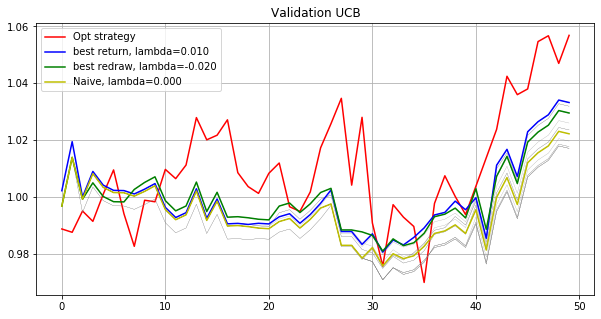

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.      0.0981 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.      0.1223
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0617 -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0278 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.0901 -0.      0.
 -0.    ]
0.9804199786333965
[ 0.0938 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.1003  0.0029 -0.      0.1362 -0.      0.     -0.


[-0.     -0.     -0.     -0.     -0.      0.0518 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.199  -0.      0.0761 -0.     -0.     -0.     -0.      0.0913 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0518 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1657 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1442 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0005  0.2196 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0046934555644473
[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.0281  0.     -0.     -0.     -0.     -0.
  0. 

[ 0.0609 -0.      0.2381  0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.0226 -0.      0.3    -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.      0.      0.      0.2598 -0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.0373 -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.0658 -0.      0.      0.      0.      0.
  0.      0.0156 -0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.    ]
0.9941001621276284
[-0.     -0.      0.0488  0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3     0.      0.0024 -0.
 -0. 

[ 0.     -0.      0.     -0.     -0.      0.0106 -0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.0553  0.3     0.2439  0.
 -0.      0.     -0.      0.0981 -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.2889  0.      0.     -0.      0.     -0.     -0.      0.0032 -0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
1.0152257396903128
[ 0.1108 -0.      0.      0.0081 -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.029
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -

[-0.     -0.     -0.      0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.0928  0.1357 -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.1621 -0.
  0.0398 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.2426 -0.     -0.     -0.      0.0889 -0.     -0.      0.0445
  0.     -0.      0.      0.     -0.     -0.     -0.      0.1374  0.0145
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.0417 -0.      0.      0.     -0.      0.
  0.    ]
0.9980304270540726
[-0.     -0.     -0.     -0.     -0.      0.0048  0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.035  -0.      0.      0.     -0.      0.1461 -

[-0.     -0.     -0.      0.0431  0.     -0.     -0.     -0.      0.3
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.0045 -0.      0.2174  0.      0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
 -0.      0.1208 -0.      0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.1685  0.      0.1106  0.     -0.      0.     -0.      0.
  0.0351  0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
1.001731087097932
[ 0.     -0.      0.179   0.      0.     -0.     -0.      0.      0.3
 -0.      0.      0.      0.      0.     -0.      0.      0.3     0.
 -0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.

[-0.     -0.      0.0277 -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.1211 -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.      0.0439
  0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.2073
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
0.9935542289214596
[ 0.0189  0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1178 -0.     -0.      0.0127
  0.1409 -0.      0.0533 -0.     -0.      0.     -0.     -0.  

[ 0.      0.     -0.      0.      0.      0.     -0.     -0.      0.3
  0.     -0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.2168  0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.      0.1832
  0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
1.0012364095433766
[ 0.      0.      0.      0.0349 -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.


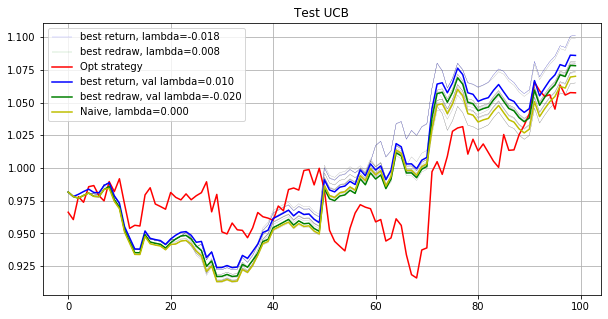

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.1116  0.      0.     -0.      0.      0.     -0.
  0.      0.      0.0335 -0.     -0.      0.      0.     -0.      0.0191
  0.      0.     -0.      0.      0.      0.     -0.      0.0234 -0.
 -0.      0.145  -0.     -0.      0.      0.     -0.     -0.      0.0229
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.0583
 -0.      0.0063  0.0956  0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.1228 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.0056  0.0558
 -0.    ]
0.9966053610698834
[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.    

[-0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.023   0.1824  0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.0183  0.
 -0.     -0.      0.     -0.      0.1843 -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.0203 -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.188  -0.     -0.     -0.     -0.      0.     -0.
  0.      0.0836 -0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.3     0.
  0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.    ]
0.991162713665507
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0604 -0.     -0.     -0.      0.0464 -0.      0.019  -0.
  0.145  -0.     -0.     -0.     -0.      0.0554 -0.     -0.     -0.
 -0.  

[-0.      0.0269 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.1023 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1836 -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.0188 -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.0674 -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.001
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9979974121074954
[ 0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.3     0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  

[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.0527 -0.     -0.      0.0197 -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.0689
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.1046 -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.1361
  0.      0.249   0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.0689 -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.    ]
1.0006432150886118
[-0.     -0.     -0.     -0.      0.1098 -0.      0.     -0.      0.
  0.      0.      0.3     0.      0.      0.      0.     -0.      0.
  0.0037  0.     -0.     -0.     -0.      0.     -0.     -0.      

[ 0.      0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.1649 -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.0845 -0.     -0.     -0.     -0.     -0.
  0.2148  0.      0.     -0.      0.     -0.      0.     -0.      0.0904
  0.     -0.      0.     -0.      0.     -0.      0.      0.      0.1455
  0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.3    -0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
0.9865324256661374
[ 0.014  -0.     -0.     -0.      0.1313 -0.     -0.      0.     -0.
  0.1028 -0.      0.     -0.     -0.      0.0133 -0.     -0.     -0.
  0.1416  0.     -0.     -0.     -0.      0.0241 -0.     -0.     -

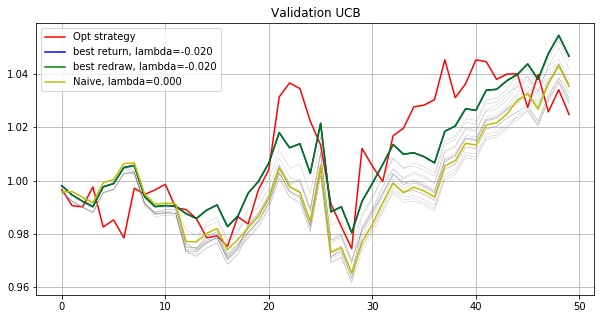

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.081   0.1369 -0.     -0.      0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.0968
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.3
 -0.      0.2568  0.      0.      0.      0.      0.     -0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.0373  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.0874 -0.      0.0039
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.    ]
1.0043820586886725
[-0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.052  -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     

[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.      0.0025  0.      0.     -0.      0.      0.0367  0.0421  0.
 -0.      0.      0.0876 -0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.      0.1254  0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.0061
  0.     -0.      0.1146  0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.158  -0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.0836  0.      0.      0.0381
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.0823  0.      0.      0.1207  0.1023
  0.    ]
1.0000142269459331
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0102  0.      0.08   -0.      0.      0.12

[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.2259 -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.029   0.1175  0.      0.0946  0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.054  -0.      0.     -0.      0.     -0.      0.      0.027  -0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.      0.2687  0.     -0.     -0.      0.1834 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9999417418904143
[-0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.0223  0.1469  0.      0.
  0.      0.      0.0505  0.     -0.      0.     -0.      0.1808  0.
  0. 

[ 0.      0.0453 -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3     0.     -0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0211  0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.1728 -0.     -0.     -0.     -0.     -0.      0.2323 -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.     -0.
 -0.     -0.      0.2285  0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
0.9985989783086253
[-0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.0126 -0.      0.      0.      0.      0.     -0.
  0.3    -0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0. 

[-0.     -0.     -0.     -0.      0.0303  0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.0174 -0.     -0.      0.
 -0.      0.      0.1556 -0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.0879 -0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.0118  0.      0.098   0.     -0.      0.0892 -0.
 -0.      0.113  -0.     -0.     -0.      0.     -0.     -0.      0.0585
 -0.      0.     -0.      0.      0.0746 -0.      0.      0.0047  0.0045
 -0.      0.      0.      0.      0.1083 -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.0908 -0.      0.     -0.
 -0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.0553  0.
  0.    ]
1.000805443754091
[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.2178  0.      0.     -0.     -0.
  0.      0.      0.0534 -0.     -0.      0.     -0.     -0.      0

[-0.      0.1327  0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.0102 -0.      0.0352 -0.      0.1194  0.      0.
 -0.      0.163  -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.0115 -0.      0.     -0.     -0.      0.     -0.      0.3
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.0023 -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.2005  0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.0251 -0.      0.     -0.      0.      0.     -0.      0.
 -0.    ]
0.9919942551580947
[-0.      0.0031 -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.     -0.      0.0909  0.3    -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.

[ 0.      0.116  -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.0289 -0.      0.      0.1275  0.      0.0355  0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.3
  0.0102 -0.     -0.      0.      0.      0.     -0.      0.0107 -0.
 -0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.0712  0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.    ]
1.0054608832342775
[ 0.      0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.      0.0418 -0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.      0.3     0.
  0.

[-0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.0096 -0.
  0.     -0.      0.0957  0.     -0.      0.     -0.      0.     -0.
  0.2144 -0.     -0.      0.1316 -0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.3    -0.     -0.     -0.      0.      0.      0.      0.      0.1433
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1054 -0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
0.9976250937857865
[ 0.0748 -0.      0.     -0.      0.0284 -0.      0.     -0.      0.
  0.      0.1    -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 

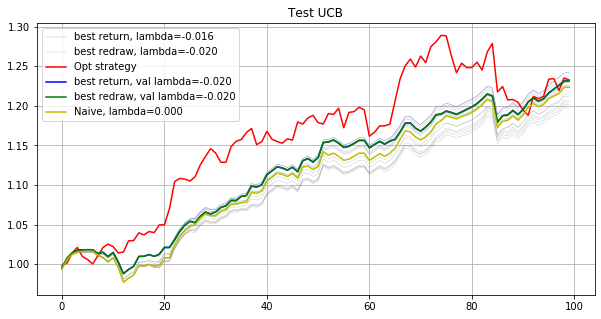

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.2165  0.      0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.0008  0.      0.3    -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.0604  0.     -0.
  0.007  -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.      0.1451  0.2704
  0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
  0.    ]
0.9859736245277693
[ 0.0205  0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.0857  0.      0.      0.     -0.

[ 0.      0.      0.     -0.     -0.      0.0014  0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.0834  0.061   0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.1017 -0.     -0.     -0.     -0.      0.     -0.
  0.      0.0695 -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.0188 -0.      0.0038 -0.      0.      0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.3     0.      0.     -0.     -0.      0.      0.0404 -0.
  0.     -0.     -0.      0.     -0.     -0.      0.0199 -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.    ]
1.0235241086468025
[-0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.1169 -0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
  0. 

[-0.      0.     -0.     -0.      0.0044 -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.0774 -0.     -0.
  0.     -0.     -0.      0.0795 -0.      0.0332 -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.0978  0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.1075 -0.      0.0082
  0.     -0.      0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.2123  0.1287 -0.
  0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.2511  0.     -0.
 -0.    ]
1.0171761924990483
[-0.     -0.     -0.     -0.      0.0608 -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 

[-0.     -0.      0.0062  0.0006 -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.028  -0.
 -0.     -0.      0.0211 -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.05    0.0044  0.3     0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0326 -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.2571  0.3    -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
0.9848359888817764
[-0.     -0.     -0.     -0.     -0.      0.0397 -0.     -0.     -0.
  0.0662 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.1052 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0. 

[ 0.0327  0.1679 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0198 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0478 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0429  0.2555 -0.
 -0.     -0.     -0.     -0.      0.0022 -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0758 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0426
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1
 -0.     -0.     -0.      0.0517 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1604 -0.
 -0.      0.0012 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.999100734697444
[-0.     -0.     -0.      0.      0.      0.0726 -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0423  0.      0.
 -0.      0.2695 -0.      0.0597  0.      0.     -0.     -0.     -0.
 

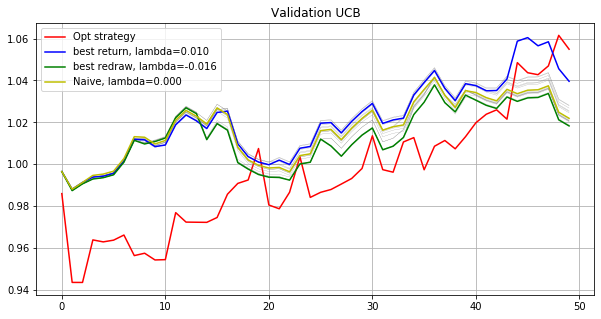

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.0084  0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.005  -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.1636  0.      0.
 -0.      0.      0.0395  0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.0409  0.      0.
  0.      0.      0.     -0.      0.1082  0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.      0.0127 -0.     -0.
  0.0218  0.     -0.     -0.     -0.      0.      0.3    -0.     -0.
  0.    ]
1.0004812881501968
[-0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.0315  0.      0.0978 -0.     -0.     -0.     -0.      0.     -0.
 -0.

[ 0.      0.      0.     -0.     -0.      0.     -0.     -0.      0.
  0.      0.0063 -0.     -0.      0.2221 -0.     -0.      0.      0.
  0.     -0.     -0.      0.0123  0.      0.0574  0.      0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.0851 -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.3     0.3
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.0168]
1.0065978591388625
[ 0.0465 -0.      0.     -0.      0.      0.0578 -0.     -0.     -0.
  0.     -0.      0.0471 -0.     -0.     -0.     -0.      0.0023  0.
 -0.     -0.     -0.      0.      0.0404 -0.     -0.     -0.      0.
  0.

[-0.     -0.     -0.      0.      0.0167 -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.      0.1459 -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.0589 -0.      0.1451
  0.     -0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.0661  0.      0.      0.      0.      0.
  0.      0.      0.      0.2365  0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.031
  0.    ]
1.0065797587506113
[-0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.0956  0.      0.      0.      0.      0.      0.1171 -0.     -0.
 -0.      0.      0.      0.0869  0.     -0.     -0.     -0.     -0

[-0.     -0.      0.0076  0.      0.     -0.      0.      0.      0.
  0.0693 -0.     -0.      0.     -0.     -0.      0.1328  0.      0.025
 -0.      0.      0.      0.0204  0.      0.0038 -0.     -0.     -0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.0109  0.      0.2301  0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.0761
 -0.     -0.     -0.     -0.      0.      0.      0.      0.0801  0.
  0.      0.      0.0789  0.0873  0.      0.      0.     -0.      0.
  0.      0.      0.1432  0.      0.      0.      0.0346  0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.    ]
0.9991711770280959
[ 0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.      0

[-0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.2236  0.     -0.      0.      0.059  -0.     -0.     -0.
  0.     -0.      0.0046 -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.0392  0.1569 -0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.1443  0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.0723  0.      0.3
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.    ]
1.0092885809227166
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0122 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.

[ 0.0279  0.1089 -0.      0.     -0.     -0.     -0.      0.      0.
  0.073  -0.      0.     -0.      0.0624 -0.     -0.      0.      0.
 -0.      0.      0.1528  0.0052 -0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.0736 -0.      0.
 -0.     -0.      0.0662 -0.     -0.      0.      0.     -0.      0.122
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.0793  0.     -0.     -0.     -0.      0.
 -0.      0.      0.0717 -0.      0.1568  0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.    ]
0.9987435116934003
[-0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.0591 -0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.1778  0.      0.     -0.      0.      0.     -0.     -0.     -0.
  

[-0.     -0.      0.     -0.      0.      0.0102 -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.1601 -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.3    -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.0701  0.     -0.     -0.     -0.      0.0294
  0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.3     0.1121 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.0181  0.      0.     -0.      0.      0.      0.     -0.
  0.    ]
1.007136036056661
[ 0.0829 -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.1502 -0.
  0.0058  0.      0.     -0.      0.0056 -0.     -0.     -0.     -0.
  

[-0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.0685 -0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.2032  0.     -0.     -0.      0.002  -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.     -0.      0.2157 -0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.0358 -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.2869  0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.      0.      0.     -0.      0.1675 -0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.      0.0204
  0.    ]
1.0185746955786543
[-0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.1284 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 

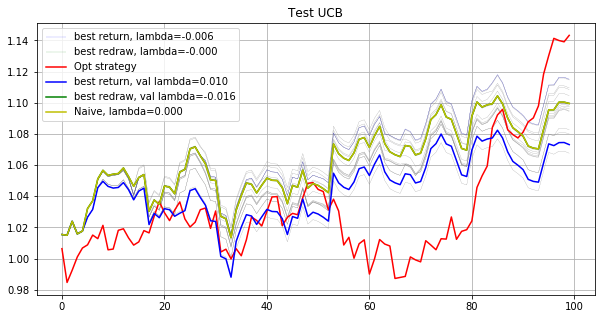

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.072  -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0036 -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.0352  0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0901
  0.0123 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.3    -0.     -0.     -0.     -0.      0.3    -0.
  0.1868  0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.    ]
1.0120213997200906
[0.     0.     0.     0.0104 0.     0.     0.     0.     0.     0.
 0.     0.     0.0141 0.     0.     0.     0.     0.     0.   

[-0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.     -0.      0.031   0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.2169 -0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.0475  0.
 -0.      0.      0.3     0.118  -0.     -0.      0.0263  0.     -0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.1385  0.1218 -0.     -0.
  0.    ]
0.9980195791364967
[-0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0. 

[ 0.      0.      0.047   0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0559 -0.      0.1199 -0.      0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.      0.1974 -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.2798 -0.     -0.
 -0.    ]
1.0141809967654127
[ 0.      0.      0.      0.0142  0.004   0.      0.     -0.      0.
 -0.      0.0333 -0.      0.0454  0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.0294  0.0108 -0.      0.
 -0. 

[-0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.0155
 -0.     -0.     -0.     -0.      0.0212  0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.0078  0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.0645 -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.2029 -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.      0.     -0.     -0.      0.0878
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.0542  0.      0.2462 -0.      0.     -0.     -0.     -0.
 -0.    ]
0.9939314024260613
[-0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.1358  0.      0.      0.1714  0.     -

[ 0.137  -0.      0.0087  0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.      0.      0.      0.1189 -0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.3     0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.0357  0.0996  0.      0.      0.      0.      0.3     0.      0.
  0.    ]
1.0039580126717806
[-0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.0005 -0.     -0.
 -0. 

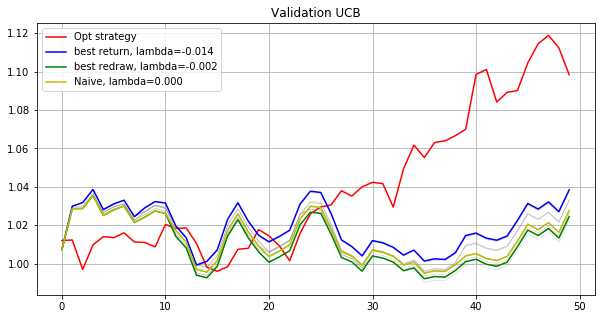

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.      0.      0.0209  0.0268  0.0214  0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0162  0.      0.     -0.      0.     -0.
  0.      0.1335  0.      0.      0.      0.      0.1641 -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.0158  0.
  0.      0.      0.0106  0.      0.0365 -0.      0.     -0.     -0.
  0.1013 -0.     -0.      0.     -0.      0.0248  0.0441 -0.     -0.
 -0.      0.0837 -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
0.9777767982607077
[ 0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.1065 -0.      0.
 -0. 

[-0.      0.      0.0524  0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.0269  0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.3     0.     -0.
  0.      0.      0.0082  0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.     -0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.0125  0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.3     0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.    ]
1.004410728439711
[-0.     -0.     -0.      0.0001  0.0024 -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.0367 -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.  

[ 0.      0.      0.1375  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.032   0.      0.      0.      0.      0.1675  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.0484  0.      0.3     0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.0146  0.      0.      0.      0.      0.
  0.    ]
1.011300728360527
[-0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1845
 -0.     -0.     -0.      0.1124 -0.     -0.     -0.     -0.     -0.
 -

[ 0.     -0.      0.      0.0066  0.0092  0.     -0.     -0.      0.
 -0.      0.     -0.      0.0157  0.      0.     -0.      0.     -0.
  0.      0.0137  0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.3     0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.      0.0116  0.      0.     -0.     -0.     -0.      0.
  0.1142  0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.0622  0.0521 -0.
  0.0671  0.     -0.     -0.     -0.      0.0736  0.      0.      0.1756
  0.      0.0985 -0.     -0.      0.      0.     -0.     -0.      0.
  0.    ]
1.0068955657627368
[-0.     -0.      0.      0.0039  0.0034 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0729  0.     -0.      0.     -0.      0.0119 -0.     -0.     -0.
 

[ 0.     -0.      0.0223 -0.     -0.      0.     -0.     -0.     -0.
  0.0326  0.     -0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.2809  0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.3    -0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.      0.     -0.      0.      0.3     0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.0027 -0.
 -0.      0.     -0.     -0.     -0.      0.      0.0616  0.      0.
  0.    ]
0.9723114455773582
[-0.      0.1651  0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.      0.0527  0.2364  0.     -0.     -0.     -0.      0.      0.
  0. 

[-0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0332 -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.2341  0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.0539  0.     -0.      0.2895  0.     -0.      0.      0.      0.
  0.      0.0681  0.      0.0077  0.      0.      0.      0.      0.
 -0.      0.      0.206   0.     -0.     -0.     -0.      0.0801 -0.
  0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.0274 -0.     -0.
  0.    ]
0.9747517990194653
[ 0.      0.      0.     -0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.0182  0.      0.      0.     -0.      0.     -0.
  0.0091  0.0317  0.      0.      0.      0.      0.     -0.      0.
 -0. 

[-0.     -0.      0.0397 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0933 -0.     -0.     -0.     -0.
  0.0042 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1922  0.1123 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0001
  0.015  -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0636 -0.      0.0609 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
  0.1194]
0.9958713233805189
[-0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.1162 -0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
 

[-0.     -0.      0.011   0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.3     0.      0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.2018 -0.     -0.      0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.0036  0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.056   0.      0.     -0.     -0.      0.3     0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.1275 -0.     -0.
  0.    ]
1.0121026360296637
[-0.      0.0159 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0555 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0. 

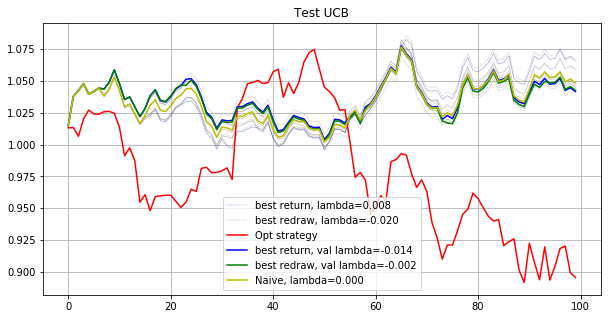

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.3     0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.2052  0.
  0.      0.     -0.     -0.      0.      0.1208 -0.      0.      0.
  0.      0.074   0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.3     0.     -0.      0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
1.0212893868334587
[ 0.      0.0706  0.      0.      0.     -0.      0.1314  0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.2496  0.    

[-0.     -0.     -0.     -0.     -0.     -0.      0.0154 -0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.3    -0.     -0.
 -0.      0.      0.0726 -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.      0.0636 -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.2375 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0109 -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.0016977640914602
[-0.      0.0734  0.     -0.     -0.      0.     -0.      0.2469 -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0387 -0.     -0.     -0.     -0.     -0.      0.0814 -0.      0.
 -0. 

[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.1114  0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.3     0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.      0.1657 -0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.0026  0.
  0.3     0.      0.      0.0692 -0.      0.      0.      0.      0.
  0.     -0.      0.0511  0.     -0.      0.     -0.     -0.     -0.
  0.    ]
1.0069561529180182
[-0.      0.0948  0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.     -0.      0.0858
 

[-0.     -0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.2483  0.1581  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1123  0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.1633  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.018   0.
  0.    ]
0.9928408953585257
[-0.      0.0054 -0.     -0.     -0.     -0.     -0.      0.0479  0.0062
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1209 -0.     -0.     -0.     -0.     -0.      0.08

[-0.      0.1147  0.     -0.     -0.      0.      0.1468 -0.      0.
  0.      0.      0.      0.     -0.      0.      0.2918 -0.      0.
  0.      0.      0.     -0.     -0.     -0.      0.1588 -0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.0007  0.0227  0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.0623 -0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.0701 -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
  0.1321  0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.    ]
0.9911240301619479
[-0.      0.0203  0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.1543 -0.      0.
 -0. 

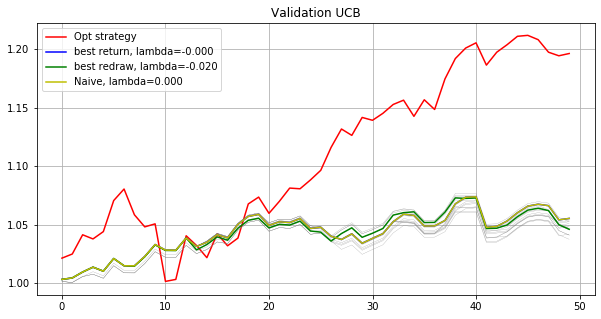

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.      0.0723  0.      0.      0.     -0.      0.0225  0.      0.0113
 -0.      0.     -0.     -0.      0.     -0.      0.2166  0.      0.
  0.     -0.      0.      0.      0.      0.      0.2143  0.0081 -0.
 -0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.0153 -0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.0087  0.     -0.      0.      0.      0.
  0.3     0.     -0.      0.     -0.     -0.      0.0584  0.      0.
  0.0596  0.      0.0129  0.      0.      0.      0.      0.      0.
  0.    ]
0.977866283542036
[-0.      0.008  -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0596 -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  

[ 0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.      0.0108 -0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.3     0.3    -0.
 -0.      0.     -0.     -0.     -0.      0.0552 -0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.0326 -0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.0711 -0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.1545
  0.0135  0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.0623
 -0.    ]
1.0143127340694371
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.041  -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.0648 -0.     -0.     -0.     -0.     -

[-0.      0.0204  0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.2362  0.2382  0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.0292  0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.      0.3    -0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.1524 -0.      0.      0.     -0.     -0.      0.0236
  0.    ]
0.9935636068808603
[ 0.      0.0087  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.0963  0.10

[ 0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1482  0.      0.      0.      0.3     0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1542 -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.      0.     -0.      0.0638
 -0.      0.0063 -0.     -0.     -0.      0.      0.3     0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.0275 -0.     -0.
 -0.    ]
0.9944756330640131
[-0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.0393 -0.      0.
 

[ 0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.2307  0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.1854  0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.
  0.0781 -0.     -0.     -0.      0.     -0.      0.2271  0.2787 -0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
 -0.    ]
1.0043356619395922
[-0.      0.1186  0.      0.1779  0.      0.      0.0716  0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.2    -0.      0.
  0. 

[ 0.      0.1177 -0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.2251  0.      0.      0.
 -0.      0.      0.      0.0046  0.      0.      0.      0.0403  0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.     -0.      0.      0.0123 -0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.    ]
1.0131070057121652
[-0.     -0.      0.     -0.      0.      0.      0.1755  0.      0.
  0.      0.0556  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.3    -0.      0.
  0. 

[-0.      0.1164  0.     -0.      0.      0.      0.0861  0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.2011  0.      0.      0.
  0.     -0.     -0.     -0.      0.3     0.1241 -0.      0.      0.
  0.      0.1723  0.      0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
1.0145605849412265
[-0.     -0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.     -0.     -0.     -0.      0.0804 -0.      0.
  0. 

[-0.      0.1075 -0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.      0.2905 -0.     -0.     -0.      0.     -0.      0.1051
 -0.     -0.     -0.      0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.1451 -0.     -0.     -0.      0.      0.      0.0774 -0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.2743  0.      0.
  0.    ]
1.0083965124859124
[ 0.      0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.      0.0094 -0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.0106 -0.     -0.
 

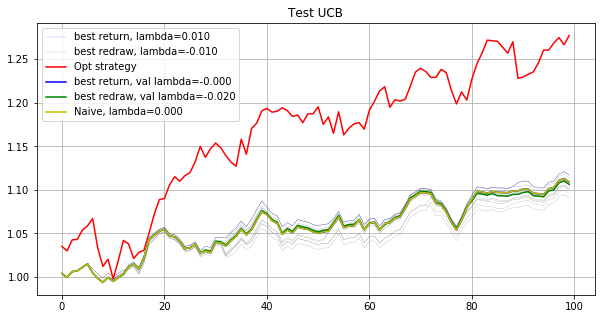

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[ 0.     -0.      0.0513 -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.011   0.     -0.      0.     -0.      0.0102  0.
 -0.     -0.      0.      0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.0275 -0.      0.     -0.     -0.      0.3    -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1294 -0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.1707 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.    ]
0.9905742486359856
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.0074  0.   

[-0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1434  0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.      0.074   0.     -0.      0.0833 -0.      0.
  0.      0.3     0.      0.      0.1072 -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.1088  0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.0187  0.      0.      0.1646 -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.    ]
0.9903833460711685
[-0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.1905  0.      0.      0.      0.
  0.      0.      0.2319  0.      0.      0.      0.      0.1015  0.
 -0. 

[ 0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.1055  0.0541  0.     -0.
  0.     -0.      0.1099 -0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.0263  0.     -0.     -0.      0.0633
 -0.      0.     -0.     -0.      0.      0.     -0.      0.      0.0018
 -0.      0.     -0.      0.112  -0.      0.      0.1566  0.      0.
 -0.      0.      0.      0.      0.0705 -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.3    -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.    ]
1.0078972000096211
[ 0.      0.      0.1051  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.164   0.1167  0.      0.
  0.      0.      0.2106  0.0194  0.      0.      0.      0.      

[-0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.1213 -0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.0278  0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.0204 -0.      0.3    -0.      0.
 -0.      0.      0.     -0.     -0.      0.0953 -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1723
  0.     -0.      0.03    0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1886 -0.      0.      0.      0.     -0.      0.0443
 -0.    ]
0.9861146986704782
[-0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.
  0.   0.1  0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.

[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.     -0.     -0.      0.      0.0297  0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.2032  0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.0386  0.     -0.      0.      0.0584 -0.     -0.      0.      0.
 -0.      0.0505  0.      0.      0.     -0.      0.      0.      0.
  0.1139  0.     -0.     -0.      0.184  -0.     -0.      0.      0.
  0.      0.3     0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.0216  0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.      0.
  0.    ]
1.0038908215863562
[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.0137  0.      0.1473  0.      0.      0.
  0.     -0.      0.3     0.     -0.      0.      0.      0.1025  0.
  0. 

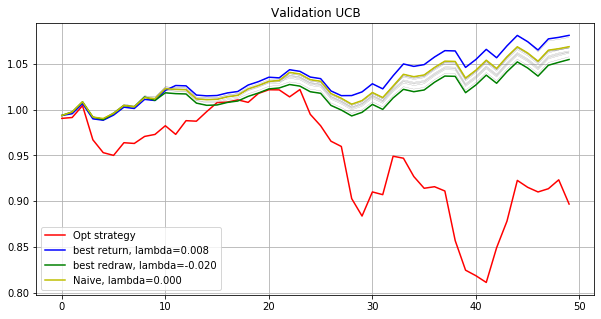

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[-0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.3     0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.2043 -0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.3    -0.      0.
 -0.      0.      0.     -0.     -0.      0.1624 -0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0333  0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.    ]
1.0121714366749612
[-0.     -0.      0.0848 -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.0456  0.     -0.      0.     -0.     -0.      0.
 -0. 

[-0.     -0.      0.1027  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.0534  0.      0.      0.     -0.      0.3    -0.     -0.
  0.      0.      0.      0.      0.261   0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.2809  0.     -0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.002   0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.    ]
0.9977985762310402
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0423  0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.3     0.
  0. 

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.0798 -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.      0.3    -0.      0.      0.      0.      0.
  0.      0.      0.3     0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.0202
  0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.3     0.     -0.      0.      0.      0.      0.
 -0.    ]
1.008691461870845
[-0.     -0.      0.0627  0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.0329  0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.212   0.
 -

[-0.     -0.      0.0459  0.      0.0424  0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.3     0.     -0.      0.     -0.      0.1571  0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.     -0.      0.1429 -0.     -0.
 -0.     -0.      0.0701 -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.0042 -0.      0.2375
  0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.    ]
1.0502853647446577
[-0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.1172  0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.0856  0.
 

[-0.     -0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.005   0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.2028 -0.      0.2454  0.     -0.      0.2094 -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
  0.0374  0.      0.3     0.      0.     -0.     -0.      0.     -0.
  0.    ]
0.9871400845076348
[ 0.     -0.      0.     -0.     -0.     -0.      0.      0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1083  0.     -0.      0.     -0.     -0.     -0.
  0. 

[-0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.157   0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.1644 -0.      0.0633  0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0993  0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.216   0.      0.3     0.     -0.     -0.     -0.      0.     -0.
  0.    ]
1.0098213932054014
[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
  0. 

[-0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.2683  0.      0.      0.      0.
  0.     -0.      0.3     0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.0579 -0.
  0.0023  0.      0.     -0.      0.     -0.     -0.     -0.      0.2953
  0.      0.     -0.      0.      0.     -0.      0.0762 -0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.     -0.      0.     -0.
  0.    ]
1.0141605973559544
[ 0.      0.      0.0429  0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.      0.3     0.     -0.      0.      0.      0.1503  0.
 

[-0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.0813  0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.0041 -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.      0.0728 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.2418 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.005269223994376
[-0.     -0.      0.0604  0.     -0.      0.      0.      0.      0.
  0.      0.      0.0139  0.      0.      0.      0.0088  0.      0.
  0.     -0.      0.2708  0.118  -0.      0.     -0.      0.      0.
  0.  

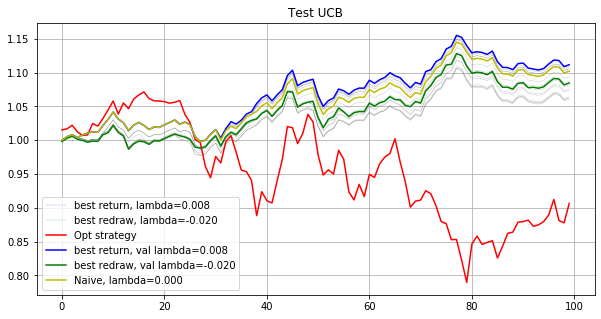

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[ 0.1514 -0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.0324 -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.123  -0.     -0.      0.0077
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.085  -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.2583  0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.0412 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.0011  0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.    ]
0.9854569900600891
[ 0.119  -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.      0

[-0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.0053  0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.2333  0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.3    -0.     -0.      0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.      0.217   0.
  0.     -0.      0.1666  0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.0778
  0.    ]
1.016891622877175
[-0.     -0.     -0.      0.     -0.      0.0361  0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.022  -0.      0.      0.      0.     -0.
  

[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.0199  0.      0.1388 -0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.088   0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0387 -0.     -0.     -0.     -0.
  0.2505  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.1643 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.      0.
  0.    ]
0.9941473568365602
[ 0.0875 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.0437 -0.
  0.      0.      0.1554  0.     -0.      0.      0.      0.     -0.
  0. 

[-0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.271  -0.      0.     -0.     -0.      0.0312 -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.087  -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.0115  0.      0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.      0.2993
 -0.    ]
1.009188681397223
[ 0.      0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -

[ 0.1745  0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.1921  0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.0255  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.0071  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0008  0.      0.      0.      0.      0.
 -0.    ]
0.9807604472869701
[-0.      0.     -0.      0.     -0.      0.0321  0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0. 

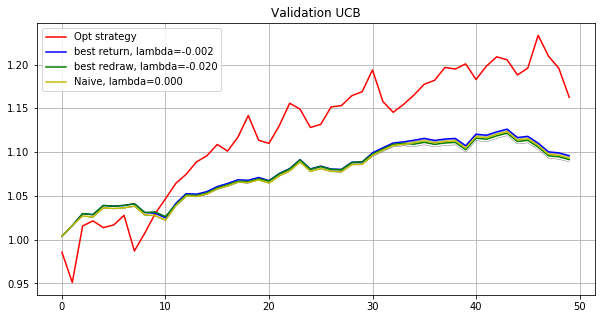

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.1166 -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.0653
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.012   0.      0.1244  0.     -0.     -0.      0.      0.      0.
  0.0264 -0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.0553  0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.3     0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.    ]
1.0211951887442672
[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.3    -0.
  0.      0.      0.0213  0.     -0.      0.     -0.     -0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0088 -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0519 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1084 -0.     -0.     -0.     -0.      0.2368
 -0.     -0.     -0.     -0.     -0.      0.0766 -0.     -0.     -0.
  0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.      0.2174
 -0.    ]
1.0383422195981764
[ 0.116  -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.     -

[ 0.0064  0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.0517  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.2731  0.      0.      0.      0.
  0.3     0.      0.      0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.0687  0.      0.      0.      0.      0.
  0.    ]
0.999000431629999
[ 0.2709 -0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.  

[-0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1258  0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.3     0.175  -0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.3     0.     -0.      0.     -0.      0.      0.0992
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.    ]
0.9920697841253194
[ 0.1628 -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 

[ 0.0722 -0.      0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.0489
  0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.     -0.
  0.1333  0.     -0.     -0.      0.     -0.      0.0026 -0.      0.2282
  0.0675 -0.     -0.      0.     -0.      0.      0.      0.1386  0.0086
  0.3     0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.    ]
1.0017220367895905
[ 0.2611  0.     -0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.1467  0.      0.      0.      0.      0.  

[-0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.0421
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.1455 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.0896  0.     -0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.2344 -0.      0.
  0.0752 -0.      0.      0.1298 -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.2835 -0.      0.      0.     -0.     -0.
  0.    ]
1.0020942334944247
[-0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.0357 -0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.0334  0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0655
  0.     -0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.0012  0.3    -0.      0.3     0.      0.     -0.
 -0.    ]
1.0037874982231476
[ 0.2613 -0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.      0.      0.      0.0144  0.      0.      0.06

[ 0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.0596  0.      0.     -0.      0.2274  0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.0481  0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.3     0.
  0.      0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.0579  0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.1786  0.
  0.     -0.      0.1209 -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.0074
  0.    ]
0.9880326669041931
[ 0.0773 -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.0298 -0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 

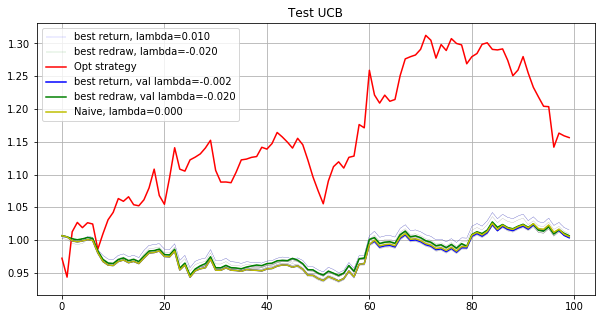

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.98904687
Mean return: 1.00085994
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


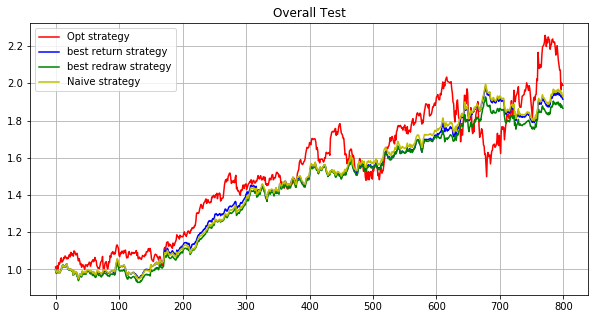

In [8]:
run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002), delta=10)

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.      0.     -0.      0.0465  0.0012  0.      0.      0.
  0.0259  0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.1588  0.     -0.     -0.      0.0027  0.
  0.     -0.     -0.      0.      0.0005 -0.     -0.      0.0374  0.
  0.      0.056  -0.      0.      0.0071  0.      0.0759 -0.      0.0587
  0.      0.0276  0.     -0.      0.2087 -0.      0.     -0.     -0.
  0.      0.      0.      0.     -0.      0.     -0.      0.1125  0.0763
 -0.      0.      0.      0.      0.      0.      0.055   0.0076 -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.0078  0.      0.      0.0245  0.      0.
  0.0091]
1.028406476133034
[ 0.001  -0.     -0.     -0.      0.     -0.      0.0273  0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.     

[ 0.     -0.      0.     -0.      0.0106 -0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.0378 -0.      0.     -0.
  0.     -0.      0.     -0.      0.0019 -0.      0.     -0.      0.
 -0.      0.      0.      0.0001  0.1059  0.      0.0231 -0.      0.
 -0.      0.      0.0584  0.1083  0.1299  0.     -0.      0.1262  0.
 -0.      0.      0.      0.0344  0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.0644 -0.     -0.      0.0657
  0.      0.      0.043  -0.      0.      0.0441  0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.      0.0172
  0.1292  0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.    ]
1.0013550778502276
[ 0.     -0.     -0.      0.1263  0.0965 -0.     -0.      0.     -0.
  0.0061 -0.     -0.      0.     -0.      0.     -0.      0.0408  0.
  0.      0.     -0.     -0.     -0.      0.      0.      0.     -

[-0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.0065 -0.      0.     -0.     -0.      0.0296  0.      0.      0.
  0.     -0.     -0.     -0.      0.0392  0.     -0.      0.0243  0.
 -0.      0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.0064 -0.      0.1315  0.     -0.      0.0078  0.2291  0.0486
 -0.      0.     -0.      0.0956  0.0664 -0.      0.1036  0.     -0.
 -0.      0.     -0.      0.      0.     -0.     -0.      0.0186  0.0031
  0.003   0.      0.1168  0.      0.      0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.0096  0.     -0.     -0.      0.0604
  0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.    ]
1.0193050593331763
[ 0.      0.     -0.     -0.      0.0845 -0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.1231  0.00

[-0.      0.      0.     -0.     -0.      0.0105  0.      0.0055  0.0222
 -0.     -0.      0.      0.     -0.      0.0163 -0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.0208  0.0096 -0.      0.
 -0.      0.0132  0.     -0.      0.0049  0.0066  0.     -0.     -0.
 -0.      0.0343 -0.      0.     -0.      0.      0.0652 -0.      0.
  0.      0.0623 -0.      0.0418 -0.     -0.      0.0411 -0.     -0.
  0.0028  0.      0.      0.      0.      0.      0.      0.      0.0981
  0.     -0.      0.139   0.     -0.      0.     -0.      0.0315 -0.
  0.0715  0.      0.     -0.     -0.      0.      0.      0.0368  0.
  0.      0.0393  0.0119 -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.0301  0.0104  0.      0.0334  0.1203  0.
  0.0205]
0.966418972687731
[-0.     -0.      0.     -0.      0.0988  0.0219  0.      0.0416  0.
  0.     -0.      0.     -0.     -0.      0.0349 -0.     -0.      0.0065
 -0.      0.      0.      0.1128 -0.      0.     -0.      0.   

[-0.     -0.     -0.      0.      0.0323  0.0072  0.0354  0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.0191  0.0663 -0.      0.     -0.      0.     -0.
  0.      0.0271 -0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.      0.0764  0.0222  0.0032 -0.      0.0587  0.      0.0203
  0.      0.1953  0.     -0.      0.1361 -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.0585
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.003   0.
  0.      0.     -0.     -0.      0.0511  0.     -0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.1775
 -0.     -0.      0.      0.      0.      0.      0.0103 -0.     -0.
 -0.    ]
1.0231876918603204
[-0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0204
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.018
 -0.      0.0266  0.0103  0.0944  0.     -0.      0.046

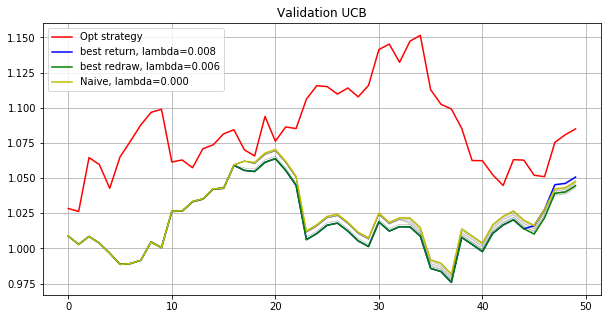

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.0014 -0.     -0.      0.      0.0594  0.0098  0.      0.      0.
  0.0663  0.0056 -0.     -0.      0.      0.      0.      0.      0.0698
 -0.     -0.      0.0445 -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.0328  0.0576  0.      0.      0.0047  0.0216  0.      0.
  0.0409  0.     -0.      0.      0.     -0.      0.015  -0.      0.
  0.     -0.      0.     -0.      0.      0.0066  0.0038  0.     -0.
  0.0112 -0.     -0.     -0.     -0.      0.      0.      0.0306  0.
  0.     -0.      0.0082  0.      0.      0.      0.006   0.0305  0.
  0.     -0.     -0.      0.0415 -0.      0.     -0.      0.0986  0.
 -0.      0.      0.      0.0279  0.      0.     -0.      0.0114  0.2546
 -0.     -0.     -0.      0.0306 -0.     -0.      0.009   0.      0.
  0.    ]
1.005273497969823
[-0.     -0.     -0.     -0.      0.0083  0.0241  0.0267  0.      0.
  0.     -0.      0.0084 -0.      0.0206  0.      0.      0.      0.0808
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.017

[ 0.     -0.     -0.      0.      0.     -0.     -0.      0.0123  0.0015
  0.      0.      0.     -0.      0.      0.0414  0.      0.0832  0.
  0.      0.      0.0123  0.1268 -0.     -0.     -0.      0.     -0.
  0.0053  0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.     -0.      0.0064  0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.153   0.     -0.      0.     -0.
 -0.     -0.      0.      0.      0.      0.1101 -0.      0.      0.
  0.      0.      0.      0.0457 -0.      0.1681 -0.      0.      0.
 -0.     -0.     -0.     -0.      0.0075 -0.      0.      0.1933  0.0091
  0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.      0.0178  0.0063 -0.
  0.    ]
0.9878889213078952
[ 0.     -0.     -0.      0.0666  0.     -0.     -0.     -0.     -0.
  0.     -0.      0.      0.      0.0144  0.      0.      0.      0.
  0.      0.     -0.      0.089   0.      0.0025  0.0532  0.008   

[-0.     -0.     -0.     -0.      0.0357  0.0191  0.0062  0.     -0.
  0.0302 -0.      0.     -0.      0.      0.      0.      0.      0.0287
  0.     -0.      0.      0.     -0.     -0.     -0.      0.0018  0.
 -0.      0.      0.0163 -0.      0.1111  0.      0.0678  0.2019 -0.
 -0.      0.0521  0.      0.     -0.     -0.      0.      0.      0.0072
  0.     -0.     -0.      0.      0.     -0.      0.1303 -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.1189  0.
  0.     -0.     -0.     -0.     -0.      0.1263  0.      0.      0.
 -0.      0.      0.      0.      0.0242 -0.     -0.      0.      0.
  0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.0223 -0.     -0.
 -0.    ]
0.992083568198484
[-0.      0.      0.     -0.      0.      0.0027 -0.      0.      0.0235
  0.0214  0.      0.      0.     -0.     -0.      0.0126 -0.      0.
 -0.      0.     -0.      0.0256  0.      0.      0.      0.   

[-0.     -0.     -0.      0.      0.096   0.0027 -0.     -0.     -0.
  0.     -0.     -0.      0.      0.      0.      0.      0.0583  0.0314
  0.      0.      0.0336 -0.      0.0399  0.     -0.      0.016  -0.
  0.0078  0.      0.      0.027   0.0525  0.      0.0089  0.     -0.
  0.      0.0058  0.0094  0.2052  0.1223  0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.0049
  0.0015  0.0488  0.      0.      0.013  -0.      0.      0.      0.0005
  0.     -0.      0.      0.     -0.      0.0067  0.0419 -0.      0.
 -0.     -0.     -0.      0.      0.0579  0.     -0.      0.0137  0.
 -0.      0.      0.      0.0435  0.     -0.      0.      0.      0.0497
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.0012]
1.0107855878958776
[ 0.     -0.      0.      0.0356 -0.      0.0054  0.0069  0.0017  0.
  0.      0.0011  0.      0.      0.      0.      0.      0.      0.0441
  0.      0.      0.0203  0.0933  0.0096 -0.      0.  

[ 0.     -0.     -0.     -0.      0.031   0.0227 -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.0064  0.      0.0406  0.0556
 -0.     -0.      0.0095  0.      0.0097  0.      0.0598  0.0494 -0.
  0.0042  0.0093 -0.      0.0033  0.      0.     -0.      0.0148 -0.
  0.022   0.      0.      0.066   0.0128 -0.      0.     -0.      0.0495
  0.      0.022   0.      0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.0177  0.0085  0.033
  0.     -0.      0.0367 -0.      0.      0.      0.0924  0.0189  0.
  0.     -0.     -0.     -0.      0.0726 -0.     -0.      0.0385  0.
 -0.      0.0288 -0.      0.      0.      0.     -0.      0.      0.1142
 -0.      0.      0.      0.      0.     -0.      0.0503  0.     -0.
  0.    ]
1.0031626373753615
[ 0.     -0.     -0.      0.004  -0.     -0.      0.0677 -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.038
 -0.     -0.      0.0455  0.     -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.0796  0.      0.      0.      0.
  0.0106  0.      0.     -0.     -0.      0.0641  0.     -0.      0.0569
 -0.      0.      0.     -0.      0.      0.      0.      0.0661  0.
  0.1108  0.0291 -0.      0.0169  0.0033  0.      0.0648  0.075   0.
  0.      0.0211  0.1073  0.0019  0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.     -0.     -0.      0.0474  0.      0.      0.
  0.      0.      0.1178  0.      0.      0.0345  0.0512  0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.0417  0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.    ]
0.9893425310121047
[-0.     -0.     -0.     -0.     -0.     -0.      0.0043  0.001  -0.
  0.0003 -0.     -0.     -0.      0.      0.0556 -0.      0.      0.
  0.      0.     -0.      0.0429  0.0269  0.     -0.     -0.     -0.
 

[-0.     -0.      0.     -0.      0.     -0.      0.0005  0.007   0.
  0.     -0.     -0.     -0.     -0.      0.0336  0.      0.     -0.
 -0.     -0.      0.      0.2031  0.0988 -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.      0.     -0.      0.0079  0.0863  0.     -0.      0.      0.
  0.      0.2409  0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
  0.     -0.      0.0264  0.0742  0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.1013  0.      0.     -0.     -0.     -0.
  0.1202  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.    ]
1.0246760568365985
[ 0.     -0.     -0.     -0.      0.06    0.0036 -0.      0.     -0.
  0.0598  0.     -0.      0.     -0.     -0.     -0.      0.0084  0.
 -0.      0.      0.      0.0876 -0.     -0.     -0.      0.      0.
  0.0

[-0.     -0.      0.     -0.      0.0295  0.0182 -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.      0.      0.0438
  0.      0.      0.      0.0897  0.0051 -0.      0.      0.0555  0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.0827 -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.0229  0.0553  0.0159  0.0632  0.0388 -0.
  0.0389  0.      0.     -0.      0.      0.     -0.      0.0858 -0.
  0.0644 -0.      0.0756 -0.     -0.     -0.      0.      0.009  -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.0367  0.0801
 -0.      0.0146 -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.031   0.0408  0.
  0.0024]
0.9986952946391544
[-0.     -0.      0.      0.0215  0.0024 -0.      0.0201  0.     -0.
  0.      0.0048 -0.     -0.     -0.     -0.      0.      0.068  -0.
 -0.     -0.      0.0275  0.062  -0.     -0.      0.      0.0678  

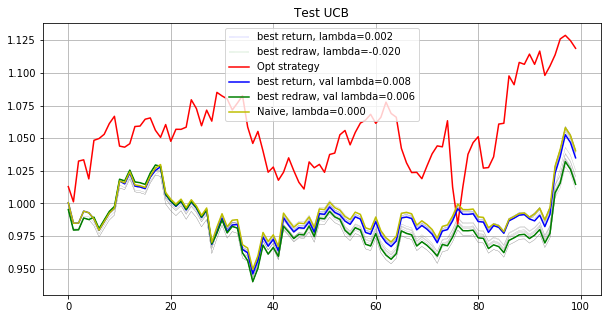

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.0055  0.0155 -0.     -0.      0.0041  0.      0.013   0.
 -0.      0.     -0.      0.      0.0019  0.0202  0.0361  0.      0.
  0.0107 -0.      0.0453  0.0097  0.0003  0.0277  0.0332 -0.      0.
  0.0104  0.      0.      0.      0.0351  0.      0.      0.      0.
  0.      0.      0.0402  0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.001   0.0004  0.     -0.      0.1047  0.034
  0.      0.      0.      0.0464 -0.      0.      0.023   0.      0.
  0.0289  0.0923  0.      0.      0.      0.0539 -0.      0.      0.0157
  0.0467  0.     -0.      0.      0.      0.0579  0.0368 -0.      0.0293
  0.0085  0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.0419  0.0148  0.      0.      0.     -0.      0.0006 -0.
  0.0542]
0.9893759574737928
[ 0.      0.0055  0.0546 -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.0454  0.0

[ 0.0192  0.007   0.0281 -0.     -0.     -0.      0.      0.0063 -0.
  0.     -0.     -0.      0.     -0.      0.0442  0.1042 -0.     -0.
  0.0189 -0.      0.0167  0.0255  0.0011  0.      0.0086 -0.      0.0715
 -0.      0.     -0.     -0.      0.      0.051   0.0416  0.      0.
 -0.      0.     -0.      0.     -0.      0.0147  0.      0.      0.
  0.     -0.      0.      0.0072  0.0238 -0.     -0.      0.      0.0483
 -0.      0.      0.     -0.     -0.      0.0239  0.0078 -0.      0.
  0.0556  0.0332  0.      0.      0.0776  0.0352  0.0376  0.     -0.
 -0.      0.     -0.     -0.      0.      0.0945  0.027  -0.      0.
  0.      0.0152 -0.      0.0187  0.      0.0158 -0.      0.      0.
 -0.      0.      0.018   0.0021 -0.      0.     -0.      0.      0.
  0.    ]
1.0116058326343922
[ 0.      0.0052  0.0067  0.     -0.     -0.      0.      0.0059  0.0943
 -0.     -0.     -0.      0.     -0.      0.0352  0.086   0.     -0.
  0.      0.      0.      0.0508  0.     -0.      0.     -0.  

[ 0.      0.0087 -0.      0.0577 -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.      0.0041  0.     -0.     -0.     -0.
  0.     -0.      0.0048 -0.      0.0032 -0.      0.0013 -0.     -0.
  0.025   0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.0618  0.0138  0.0876  0.04    0.      0.      0.0846
  0.0076 -0.      0.      0.0068 -0.     -0.     -0.      0.1181  0.
 -0.     -0.      0.     -0.      0.0775  0.033   0.     -0.      0.
  0.0586  0.      0.     -0.      0.      0.0569 -0.      0.      0.0274
 -0.      0.     -0.     -0.      0.0034  0.0643  0.0396  0.0174 -0.
  0.      0.005   0.0241  0.0433  0.0099  0.     -0.      0.     -0.
 -0.     -0.      0.0146 -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
1.013684215539622
[ 0.      0.0058  0.     -0.     -0.     -0.      0.      0.0031  0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0725 -0.      0.0113
  0.     -0.      0.0145  0.0523 -0.      0.032   0.      0.   

[ 0.      0.0063  0.0175  0.0102 -0.      0.0085 -0.      0.014   0.0087
  0.     -0.     -0.     -0.      0.      0.0152 -0.     -0.      0.
  0.0303 -0.      0.0292  0.0281 -0.      0.0893 -0.     -0.      0.
  0.     -0.      0.0105  0.0544  0.      0.      0.0387  0.     -0.
  0.     -0.     -0.      0.      0.004   0.0614 -0.      0.      0.0238
  0.      0.      0.0366  0.0055  0.0038 -0.      0.      0.1523  0.0387
  0.      0.     -0.     -0.      0.0423  0.      0.     -0.      0.0169
  0.0048 -0.      0.      0.      0.      0.      0.      0.      0.0609
 -0.      0.016  -0.     -0.      0.      0.0092  0.0244  0.     -0.
  0.     -0.      0.0522  0.0098 -0.      0.     -0.     -0.     -0.
 -0.      0.      0.0094  0.0443 -0.      0.0035  0.0195  0.     -0.
 -0.    ]
0.9912569192411933
[ 0.      0.006   0.0142  0.006   0.     -0.     -0.      0.0075  0.
  0.     -0.      0.     -0.     -0.      0.01    0.1572  0.     -0.
  0.      0.      0.      0.0464  0.0025  0.      0.  

lambda: -0.020   Total log return: 0.02912450    Max redraw: 0.03173711
lambda: -0.018   Total log return: 0.02568014    Max redraw: 0.03173711
lambda: -0.016   Total log return: 0.02332560    Max redraw: 0.03173711
lambda: -0.014   Total log return: 0.02332560    Max redraw: 0.03173711
lambda: -0.012   Total log return: 0.01948404    Max redraw: 0.03173711
lambda: -0.010   Total log return: 0.01758387    Max redraw: 0.03173711
lambda: -0.008   Total log return: 0.01758387    Max redraw: 0.03173711
lambda: -0.006   Total log return: 0.01697364    Max redraw: 0.03173711
lambda: -0.004   Total log return: 0.01697364    Max redraw: 0.03173711
lambda: -0.002   Total log return: 0.01697364    Max redraw: 0.03173711
lambda: -0.000   Total log return: 0.02199807    Max redraw: 0.03173711
lambda: 0.002   Total log return: 0.02899982    Max redraw: 0.03514809
lambda: 0.004   Total log return: 0.03261177    Max redraw: 0.03514809
lambda: 0.006   Total log return: 0.03143545    Max redraw: 0.0363

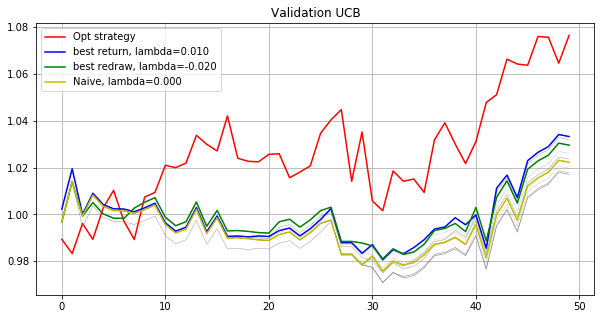

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[ 0.0034  0.0091  0.      0.0208  0.     -0.      0.0023  0.0152  0.0543
 -0.      0.     -0.      0.0043  0.0039  0.0051 -0.     -0.      0.0672
  0.      0.      0.      0.0178  0.0036  0.      0.      0.      0.
 -0.      0.      0.0042  0.      0.      0.0311 -0.      0.0064  0.0381
 -0.      0.      0.0189  0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.0213  0.0216 -0.      0.0559 -0.     -0.      0.0582
  0.      0.      0.      0.0225  0.0336 -0.     -0.      0.0227 -0.
 -0.      0.0901  0.      0.      0.      0.0486 -0.      0.      0.
 -0.      0.027  -0.      0.      0.     -0.      0.0273  0.1061  0.
  0.0087 -0.      0.023   0.097   0.0011  0.     -0.      0.     -0.
  0.      0.0218  0.0076 -0.      0.      0.      0.     -0.      0.
 -0.    ]
0.9977562735088908
[ 0.0008  0.008   0.     -0.     -0.      0.0142 -0.      0.      0.
  0.     -0.     -0.      0.0051  0.      0.0608  0.0235  0.      0.0104
  0.     -0.     -0.      0.0349  0.      0.0231  0.  

[-0.      0.0038 -0.     -0.     -0.      0.003  -0.      0.0133 -0.
 -0.     -0.      0.     -0.     -0.      0.0786  0.     -0.     -0.
  0.0065 -0.     -0.      0.0733 -0.      0.0092  0.0009  0.     -0.
  0.0309  0.     -0.     -0.     -0.     -0.      0.      0.0137  0.043
  0.0589 -0.      0.0305 -0.      0.0458  0.0682 -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.0303
 -0.      0.     -0.      0.044  -0.      0.      0.0054  0.0087 -0.
  0.      0.0781 -0.     -0.      0.      0.0212 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0311  0.0311  0.1258 -0.
 -0.      0.0424  0.0169  0.0851 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
0.9970313605900886
[-0.      0.0051  0.0398  0.     -0.      0.     -0.      0.0213  0.0189
 -0.     -0.      0.     -0.      0.      0.0212  0.      0.0127  0.0433
  0.0142 -0.      0.0111  0.0178  0.      0.0114  0.      0

[-0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.0498
 -0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.0235 -0.      0.     -0.      0.      0.022  -0.      0.     -0.
 -0.      0.      0.0562 -0.      0.1087  0.1281  0.1234 -0.      0.0303
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.027   0.      0.0119 -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.0169  0.      0.     -0.
 -0.      0.0166 -0.     -0.     -0.      0.     -0.     -0.      0.
  0.1315  0.0901 -0.      0.      0.      0.0557  0.      0.0752  0.033
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.    ]
1.0104748906878356
[ 0.     -0.      0.0097  0.0069  0.     -0.     -0.      0.      0.
 -0.      0.0098  0.     -0.      0.      0.      0.1098  0.1858 -0.
  0.      0.      0.      0.      0.      0.      0.0038 -0.   

[ 0.      0.0062  0.011  -0.     -0.     -0.      0.      0.0011  0.0404
  0.     -0.     -0.     -0.      0.      0.      0.0346 -0.      0.0231
  0.0038 -0.      0.      0.      0.0061  0.0224  0.0029 -0.      0.
  0.0034  0.0044 -0.     -0.      0.177   0.0495  0.      0.      0.0576
 -0.      0.      0.0044  0.1234  0.0376  0.0678  0.      0.0059  0.
  0.      0.0205  0.0313  0.     -0.      0.      0.0107  0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.0275 -0.
 -0.     -0.     -0.      0.      0.      0.0419  0.      0.      0.0123
 -0.      0.      0.     -0.      0.      0.      0.0488  0.      0.
  0.      0.0177  0.0017  0.0462 -0.      0.     -0.     -0.     -0.
  0.0278  0.     -0.     -0.     -0.      0.0309  0.      0.      0.
 -0.    ]
0.9993722307822032
[ 0.0265  0.0031  0.0001  0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.0751 -0.      0.      0.0207
  0.      0.      0.      0.0168  0.      0.      0.  

[-0.      0.0067 -0.      0.002  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.      0.0128  0.0233  0.      0.0331  0.0201 -0.     -0.
  0.0432  0.     -0.      0.      0.0326 -0.     -0.      0.0048 -0.
 -0.     -0.      0.0864 -0.      0.037  -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0445  0.029
  0.     -0.      0.     -0.     -0.      0.0463  0.     -0.     -0.
 -0.      0.0865 -0.     -0.      0.0731  0.0394  0.     -0.     -0.
  0.0775  0.0097 -0.     -0.      0.      0.0173  0.0411 -0.     -0.
 -0.      0.0854  0.0651  0.0092  0.     -0.      0.     -0.      0.
  0.0153  0.0246  0.001  -0.     -0.     -0.     -0.      0.033  -0.
 -0.    ]
1.008898599355891
[ 0.      0.0073  0.0433  0.0388 -0.     -0.      0.      0.0263 -0.
 -0.     -0.     -0.     -0.     -0.      0.0487  0.0598  0.0298 -0.
 -0.      0.      0.      0.0294 -0.      0.0007 -0.     -0.      0.
 -0

[-0.      0.0037 -0.      0.0039 -0.     -0.     -0.      0.0138  0.
  0.     -0.     -0.      0.     -0.      0.0387  0.0717 -0.      0.0047
  0.      0.      0.      0.0876  0.     -0.      0.0242 -0.     -0.
  0.0324  0.     -0.      0.      0.1329 -0.     -0.      0.003   0.0249
  0.      0.     -0.     -0.      0.0394  0.0175 -0.     -0.      0.
  0.0481 -0.     -0.     -0.     -0.      0.     -0.      0.      0.0481
  0.     -0.      0.      0.     -0.      0.0247  0.0298  0.0055  0.
 -0.      0.     -0.     -0.      0.0923  0.0144  0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.043   0.0091  0.0516  0.
  0.0267 -0.      0.0757  0.      0.      0.      0.     -0.      0.
  0.0326  0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.    ]
1.0030701130111788
[-0.      0.0021  0.      0.0026 -0.      0.0279 -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.0416  0.     -0.      0.0134  0.      0.  

[ 0.0041  0.0031 -0.     -0.     -0.      0.     -0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.0481  0.      0.      0.
  0.0271 -0.      0.0108  0.0118  0.      0.0108 -0.      0.      0.
  0.      0.      0.0513 -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.0335  0.1899  0.     -0.      0.
 -0.     -0.      0.      0.0737  0.      0.      0.     -0.      0.115
  0.      0.0076 -0.      0.0125  0.0033  0.      0.     -0.     -0.
  0.      0.0788 -0.      0.      0.     -0.     -0.      0.      0.0181
 -0.      0.039  -0.     -0.      0.      0.      0.0253  0.      0.
  0.0064  0.0077  0.0409  0.0663 -0.      0.      0.0661  0.     -0.
  0.      0.0488 -0.     -0.      0.      0.      0.      0.     -0.
  0.    ]
1.0112179444192175
[-0.      0.0044  0.0024  0.      0.     -0.      0.      0.0137  0.0715
 -0.     -0.     -0.     -0.      0.      0.0507  0.     -0.      0.0192
  0.      0.      0.0097  0.0245  0.      0.0515  0.0057 -0

[ 0.0072  0.0073  0.      0.0021 -0.     -0.      0.      0.0164  0.0313
  0.      0.      0.      0.      0.0016  0.     -0.     -0.      0.015
  0.     -0.      0.0195  0.0321  0.0022  0.     -0.     -0.      0.
  0.0318  0.     -0.      0.      0.0663 -0.     -0.     -0.      0.0138
 -0.      0.0057 -0.      0.1273  0.      0.035   0.      0.0453  0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.0073  0.      0.      0.042   0.048  -0.      0.0071  0.0059
  0.003   0.0742  0.      0.0258  0.      0.0397 -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.0734  0.0333  0.      0.
 -0.      0.0079 -0.      0.0094  0.      0.      0.     -0.     -0.
 -0.      0.0072  0.0115  0.     -0.     -0.      0.1176 -0.      0.
  0.0264]
1.013799444108931
[ 0.      0.008   0.     -0.      0.     -0.     -0.      0.0077  0.009
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.0062  0.0091 -0.      0.0302 -0.     

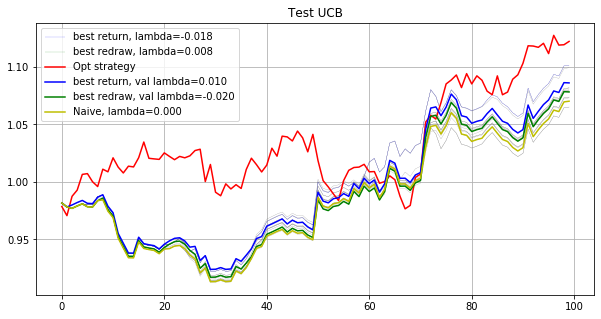

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.      0.0075  0.0006  0.     -0.      0.      0.
  0.      0.      0.0124  0.0071 -0.     -0.     -0.      0.0025  0.
 -0.      0.0904  0.0488 -0.      0.      0.      0.      0.0092 -0.
 -0.      0.      0.046   0.      0.      0.      0.0108  0.      0.0209
 -0.      0.0231  0.0189  0.      0.      0.      0.      0.0311 -0.
 -0.      0.0582 -0.     -0.     -0.      0.      0.     -0.      0.0242
  0.      0.      0.      0.     -0.     -0.      0.      0.031   0.0398
  0.0314  0.0448  0.0552  0.      0.0267 -0.     -0.      0.      0.0559
 -0.      0.     -0.     -0.     -0.      0.0853  0.0022  0.0277  0.
  0.      0.     -0.     -0.      0.0059 -0.     -0.      0.      0.
  0.      0.015  -0.      0.     -0.     -0.      0.      0.0496  0.0644
  0.0535]
0.997896847152789
[-0.      0.     -0.      0.      0.      0.0011  0.      0.      0.
 -0.     -0.      0.      0.      0.      0. 

[ 0.0027  0.     -0.      0.0026 -0.      0.0135 -0.      0.     -0.
 -0.      0.028   0.0691 -0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.0186  0.0365  0.0266  0.0039 -0.      0.0435 -0.
 -0.      0.      0.0326 -0.      0.059  -0.     -0.     -0.     -0.
  0.0226  0.0079  0.      0.      0.0576 -0.      0.     -0.     -0.
  0.      0.0287  0.      0.      0.      0.      0.0357  0.01    0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.0009
  0.0206  0.      0.0901  0.     -0.     -0.     -0.      0.      0.0028
  0.      0.0757  0.023  -0.     -0.     -0.      0.      0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2328  0.
 -0.      0.      0.0287 -0.     -0.     -0.     -0.     -0.      0.0068
  0.0195]
0.9915966715859578
[ 0.      0.      0.      0.0034  0.0003  0.0026  0.      0.     -0.
 -0.      0.0281 -0.     -0.     -0.      0.0247 -0.      0.027   0.
  0.049   0.      0.0343 -0.      0.      0.029   0.     -0.  

[-0.     -0.     -0.      0.0033  0.0011  0.0045  0.      0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.      0.0069  0.0113  0.0248 -0.      0.     -0.      0.0071 -0.
  0.0024  0.      0.0386  0.      0.042  -0.     -0.     -0.      0.
  0.      0.      0.0184  0.     -0.     -0.      0.     -0.     -0.
  0.0011 -0.     -0.      0.     -0.     -0.      0.0964  0.0133 -0.
  0.     -0.      0.089   0.0665  0.     -0.     -0.      0.0115 -0.
  0.0984  0.042  -0.      0.102   0.0326  0.     -0.      0.      0.1271
  0.      0.      0.      0.      0.      0.      0.0748  0.      0.
  0.0649 -0.      0.     -0.     -0.     -0.      0.0046  0.      0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.0157 -0.
  0.    ]
1.006551971820099
[ 0.0077  0.0207 -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0244 -0.      0.     -0.      0.      0.      0.
  0.1318 -0.      0.0643  0.0126 -0.     -0.     -0.      0.0013 -0.
  

[ 0.      0.0032  0.      0.     -0.      0.0056 -0.      0.     -0.
 -0.      0.      0.0551 -0.      0.0496  0.1471 -0.      0.0004 -0.
  0.1063  0.      0.0361  0.0613  0.     -0.      0.      0.      0.
 -0.      0.      0.089  -0.      0.      0.     -0.      0.0244 -0.
  0.0293 -0.      0.     -0.      0.0217  0.      0.0203 -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.0014  0.0127
  0.033   0.0137  0.046   0.      0.0392 -0.     -0.     -0.      0.0033
 -0.     -0.      0.     -0.      0.0258  0.      0.      0.0104 -0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.0545  0.      0.      0.0346 -0.      0.0678  0.0034
  0.0047]
1.0100590157762124
[ 0.      0.0269  0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.0313  0.0989 -0.      0.      0.0116 -0.      0.013  -0.
  0.      0.0304  0.0129  0.0482  0.0012  0.0062  0.      0.03

[-0.      0.0086  0.      0.0071  0.0129  0.006   0.      0.     -0.
  0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.0511 -0.      0.0082  0.     -0.      0.024  -0.
  0.0104  0.      0.004   0.     -0.      0.      0.0125  0.      0.0364
  0.      0.01    0.0071  0.      0.      0.      0.      0.0411  0.
  0.     -0.      0.      0.0238 -0.     -0.      0.     -0.      0.0396
  0.      0.      0.      0.0249  0.     -0.     -0.     -0.      0.
 -0.      0.0048 -0.      0.0972  0.0142 -0.      0.     -0.      0.0961
  0.      0.0103  0.0647 -0.      0.      0.0947 -0.      0.1049  0.
  0.      0.      0.0856  0.      0.0038 -0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.0489  0.      0.      0.0405  0.0064
  0.    ]
0.9870283008168325
[ 0.0173  0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.0017  0.041   0.     -0.      0.0211  0.0153 -0.      0.
  0.0794  0.      0.0598  0.0576  0.0377  0.      0.      

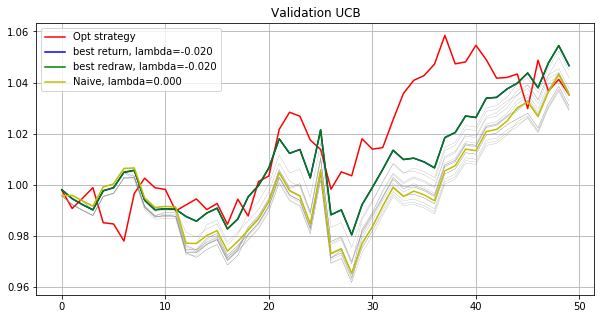

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[-0.      0.0108  0.      0.0046  0.     -0.      0.     -0.     -0.
  0.      0.0025  0.     -0.      0.      0.      0.0371 -0.      0.
  0.     -0.      0.013  -0.      0.0375  0.     -0.      0.0216 -0.
  0.      0.      0.0734 -0.      0.      0.      0.     -0.     -0.
  0.0598  0.0522  0.0039  0.0221  0.0711 -0.     -0.      0.0163  0.
  0.      0.0013  0.      0.     -0.     -0.      0.0617  0.0127 -0.
  0.     -0.      0.      0.      0.0417  0.     -0.     -0.     -0.
 -0.      0.0015 -0.     -0.     -0.     -0.      0.      0.      0.0386
 -0.      0.     -0.      0.      0.     -0.      0.1196  0.0784 -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.0177 -0.
 -0.      0.0568  0.     -0.     -0.      0.0694  0.      0.0482 -0.
  0.0264]
0.9988335691883216
[ 0.      0.0273 -0.      0.0045  0.0077  0.0025  0.      0.      0.
  0.      0.012   0.0361  0.0098  0.     -0.     -0.      0.      0.
  0.      0.0115  0.0182  0.      0.0331 -0.      0.      0.0648 -0.
 

[ 0.      0.      0.      0.0104  0.0068  0.0063  0.0001  0.      0.
  0.      0.0163  0.      0.0058  0.      0.     -0.      0.035   0.
  0.0254  0.      0.061   0.      0.      0.      0.      0.      0.
 -0.     -0.      0.0168  0.      0.      0.      0.      0.      0.
  0.0751 -0.      0.0225  0.0286  0.0073  0.01    0.01    0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.0098  0.009
 -0.      0.      0.      0.0188 -0.      0.0434  0.      0.0191  0.0283
  0.      0.0406 -0.     -0.      0.0453 -0.     -0.      0.      0.0902
  0.      0.      0.     -0.      0.      0.0543  0.032   0.      0.016
  0.0079  0.      0.      0.      0.0129  0.      0.023   0.     -0.
 -0.      0.0433  0.      0.      0.03    0.0168 -0.     -0.      0.1219
  0.    ]
1.0166860725272922
[ 0.      0.     -0.      0.0071  0.0011  0.      0.      0.     -0.
  0.     -0.      0.0094  0.0075  0.     -0.      0.0069  0.      0.
  0.0692  0.0072  0.1095  0.      0.0117 -0.      0.    

[ 0.      0.0245  0.      0.0002  0.0079  0.0171  0.      0.     -0.
 -0.     -0.     -0.      0.0006  0.     -0.      0.     -0.     -0.
  0.     -0.      0.0325  0.      0.0381  0.0074  0.      0.0183  0.
  0.     -0.      0.0277  0.     -0.     -0.      0.      0.      0.003
  0.1023  0.0376  0.0091  0.0094  0.      0.      0.      0.      0.
  0.049   0.0371 -0.     -0.      0.     -0.      0.0473  0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.013   0.0322
 -0.     -0.      0.038  -0.     -0.     -0.      0.      0.      0.0722
 -0.      0.0313  0.     -0.      0.      0.005   0.0033  0.0208  0.0121
 -0.     -0.      0.0688  0.      0.0279  0.     -0.      0.     -0.
  0.0178  0.0063  0.0528 -0.      0.      0.     -0.      0.1012  0.028
 -0.    ]
1.0025187711738133
[-0.     -0.      0.      0.0059  0.     -0.      0.     -0.      0.
 -0.     -0.      0.0441  0.0009 -0.     -0.     -0.      0.0225 -0.
  0.      0.0215  0.0477 -0.      0.0047  0.      0.    

[ 0.      0.      0.      0.0013  0.0054  0.      0.      0.      0.
 -0.     -0.      0.0322  0.0001 -0.     -0.     -0.     -0.      0.
  0.0889  0.0151  0.0288  0.0014  0.0181 -0.     -0.     -0.     -0.
 -0.     -0.      0.0609  0.0064 -0.      0.     -0.     -0.     -0.
  0.0164  0.037   0.0042 -0.     -0.     -0.      0.      0.0538 -0.
 -0.      0.0481 -0.      0.0541 -0.      0.      0.0329 -0.      0.0645
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.0142  0.0009
  0.0277  0.0079  0.0279  0.      0.0285  0.011  -0.     -0.      0.0722
 -0.      0.0379 -0.     -0.      0.      0.1063  0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.0244  0.
 -0.     -0.      0.0049  0.     -0.     -0.      0.     -0.     -0.
  0.0666]
1.0203204246815103
[-0.     -0.      0.      0.0009  0.      0.0047  0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.095   0.      0.0201  0.
 -0.     -0.      0.0618 -0.      0.0009  0.      0.      0.  

[ 0.      0.      0.0006  0.0061  0.0124  0.0023  0.0014  0.0007  0.
 -0.      0.     -0.      0.      0.      0.0177  0.      0.     -0.
  0.0161  0.0024  0.06    0.      0.0026 -0.      0.0006  0.      0.
  0.0054 -0.      0.064   0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0001  0.037   0.0023  0.0566  0.0146  0.      0.0503  0.
 -0.      0.0599 -0.     -0.      0.     -0.     -0.      0.      0.0352
  0.      0.      0.     -0.      0.0381  0.      0.      0.0365  0.0337
  0.0041  0.0026  0.0095  0.      0.0663 -0.      0.      0.0001 -0.
 -0.     -0.      0.     -0.      0.      0.0842  0.0349  0.0418 -0.
 -0.     -0.      0.      0.      0.0008 -0.      0.0166  0.     -0.
  0.      0.0061 -0.      0.0064  0.0119 -0.     -0.      0.077   0.0416
  0.0392]
0.9989548878720302
[ 0.      0.     -0.      0.      0.      0.0042 -0.      0.      0.
  0.     -0.      0.0281  0.0018  0.0663 -0.     -0.      0.0125  0.
  0.      0.      0.047   0.0266  0.     -0.      0.      0.03

[ 0.      0.0387 -0.      0.0075  0.      0.0008  0.      0.      0.
  0.      0.      0.0064  0.0068 -0.      0.     -0.      0.0162  0.
  0.      0.      0.0295 -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.0439  0.      0.0165  0.      0.0519  0.0007  0.
  0.      0.0691  0.0019  0.0071  0.0249  0.      0.      0.0268  0.
  0.0008  0.0337  0.      0.     -0.      0.      0.0267  0.      0.1124
 -0.      0.      0.      0.     -0.     -0.      0.      0.0237  0.
  0.0345  0.0356  0.0377  0.      0.0248  0.     -0.     -0.      0.0599
 -0.      0.     -0.      0.      0.      0.0101  0.      0.0966  0.
  0.      0.      0.      0.      0.      0.      0.      0.0476  0.
 -0.      0.0368 -0.      0.     -0.      0.      0.      0.      0.0401
  0.03  ]
0.9929140520397433
[-0.      0.015   0.      0.0057  0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.0392  0.104  -0.     -0.
  0.      0.      0.0306 -0.      0.0005 -0.      0.      0.02

[-0.      0.0358  0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.0126  0.
  0.0282  0.      0.0137  0.0585 -0.      0.0255 -0.      0.0258  0.
 -0.      0.      0.0086 -0.     -0.      0.     -0.      0.      0.205
  0.041  -0.      0.0062  0.      0.      0.      0.      0.0339 -0.
  0.0011  0.     -0.     -0.      0.     -0.     -0.     -0.      0.0063
 -0.      0.0399 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0114  0.0127  0.0624  0.      0.0211  0.     -0.     -0.      0.0179
  0.      0.0313 -0.      0.      0.      0.0387  0.0022  0.0338  0.
  0.      0.2025  0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.0099  0.0141
 -0.    ]
1.003777772282916
[ 0.      0.      0.      0.0073 -0.      0.0012 -0.     -0.     -0.
 -0.      0.03    0.0102  0.009   0.     -0.      0.0252 -0.     -0.
 -0.      0.0021  0.0338 -0.      0.     -0.      0.      0.

[ 0.      0.0087 -0.      0.0088  0.0065  0.0075 -0.      0.     -0.
 -0.     -0.     -0.      0.0083  0.     -0.      0.      0.0308  0.
  0.     -0.      0.058   0.      0.     -0.      0.      0.0045 -0.
  0.0689 -0.      0.0401  0.0705  0.0061 -0.      0.0096 -0.     -0.
 -0.      0.      0.0101  0.0036  0.0139  0.0087  0.014   0.0124 -0.
  0.     -0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.0018 -0.      0.      0.      0.      0.004   0.0001
  0.1119 -0.      0.      0.      0.0133  0.      0.      0.      0.1231
 -0.     -0.      0.     -0.     -0.      0.0384  0.0229  0.005   0.0153
  0.     -0.     -0.      0.      0.0493  0.0045 -0.      0.0083 -0.
  0.      0.066   0.0228 -0.      0.      0.     -0.      0.0403  0.0822
 -0.    ]
0.9965648253719345
[ 0.0253 -0.      0.      0.0013  0.0161  0.0041  0.     -0.      0.
 -0.      0.0413  0.0062  0.0015 -0.     -0.     -0.     -0.      0.
  0.0034  0.0154  0.0249 -0.      0.      0.     -0.      

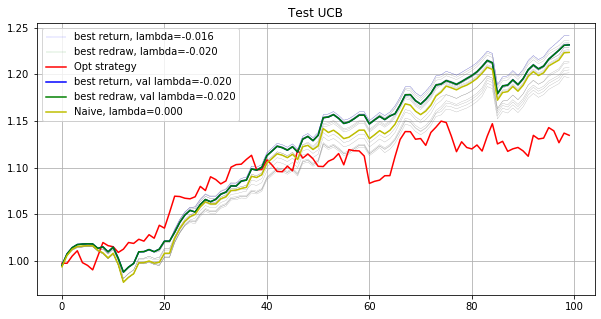

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[ 0.     -0.      0.0055  0.      0.0139  0.0062  0.     -0.      0.
  0.0201 -0.     -0.     -0.      0.0665  0.      0.      0.0115 -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.0193  0.     -0.      0.0381  0.0076  0.1174 -0.
  0.     -0.      0.      0.0183  0.     -0.      0.0509 -0.      0.
 -0.      0.     -0.      0.0228  0.      0.0299  0.0683 -0.      0.0864
  0.0462 -0.      0.     -0.     -0.      0.      0.0005  0.      0.0213
 -0.     -0.     -0.      0.0106  0.      0.0057  0.     -0.      0.0065
  0.      0.     -0.      0.     -0.      0.      0.     -0.      0.0165
  0.      0.      0.      0.0389  0.      0.      0.0203  0.0999  0.1371
  0.     -0.     -0.     -0.      0.     -0.      0.0052 -0.      0.0086
 -0.    ]
0.99716217059649
[ 0.0144 -0.      0.0059  0.0013  0.0109 -0.     -0.      0.      0.
 -0.     -0.     -0.      0.0418  0.      

[ 0.     -0.      0.005   0.0032  0.      0.0072  0.0006  0.     -0.
  0.0027 -0.      0.      0.      0.0326 -0.     -0.     -0.      0.
  0.0274 -0.      0.0155 -0.     -0.      0.0219  0.0679  0.     -0.
 -0.      0.      0.0422 -0.     -0.      0.0276  0.0008  0.0497  0.0287
 -0.     -0.      0.      0.      0.      0.      0.041   0.      0.
  0.     -0.      0.     -0.     -0.      0.0048  0.0304  0.      0.0802
 -0.     -0.      0.     -0.      0.      0.      0.0182  0.0706  0.
  0.      0.0165  0.      0.018  -0.      0.      0.0152  0.0174  0.0084
 -0.     -0.      0.      0.0059  0.     -0.      0.0023  0.0287 -0.
  0.0524  0.0788  0.0229  0.     -0.     -0.      0.0448 -0.      0.0243
 -0.      0.0631  0.002   0.     -0.      0.     -0.     -0.      0.0209
  0.    ]
0.9983768302363164
[ 0.0026  0.      0.0132  0.0067  0.019   0.0084  0.006  -0.     -0.
  0.0228  0.      0.     -0.     -0.      0.      0.0043 -0.      0.0089
  0.043  -0.      0.0083 -0.     -0.      0.0404  

[ 0.      0.      0.0123  0.0091 -0.      0.0086  0.0062  0.     -0.
  0.0361  0.      0.     -0.      0.      0.      0.0022 -0.      0.0058
  0.0153 -0.      0.0463  0.0086 -0.      0.0328  0.0076  0.      0.0102
 -0.     -0.      0.0604  0.     -0.      0.0162  0.     -0.     -0.
 -0.      0.     -0.      0.      0.0377  0.      0.0598 -0.      0.
  0.0043  0.031  -0.      0.0225  0.      0.0619  0.1103  0.      0.0532
  0.     -0.     -0.      0.      0.      0.0201 -0.     -0.      0.
  0.      0.0197  0.      0.0491 -0.      0.0218  0.      0.028  -0.
  0.0018 -0.      0.0027  0.0569  0.      0.      0.0256  0.     -0.
  0.      0.0416  0.0076  0.      0.0291 -0.     -0.     -0.     -0.
  0.      0.      0.     -0.     -0.      0.     -0.      0.      0.0373
  0.0002]
1.003001259179255
[ 0.      0.      0.0113  0.0054  0.0193  0.0062  0.0029 -0.      0.
  0.0333 -0.      0.      0.      0.      0.      0.0299  0.      0.
  0.014   0.     -0.      0.0488  0.     -0.      0.      0

[ 0.0048  0.      0.0083  0.0008  0.0016 -0.      0.      0.      0.
  0.0208  0.      0.      0.      0.0317  0.      0.0009  0.0258 -0.
  0.      0.      0.003   0.0138  0.     -0.      0.      0.      0.0016
  0.      0.      0.0518 -0.      0.      0.014   0.0091 -0.      0.0021
  0.0057 -0.      0.     -0.      0.      0.      0.0321 -0.      0.1046
  0.      0.0123  0.      0.0119 -0.      0.0323  0.0115  0.      0.0525
  0.     -0.     -0.     -0.     -0.      0.      0.045  -0.      0.0094
  0.     -0.      0.      0.0243  0.      0.0106 -0.      0.      0.
 -0.      0.      0.0381  0.0107  0.      0.      0.      0.      0.1195
 -0.     -0.      0.      0.      0.      0.      0.0454  0.197   0.
  0.     -0.     -0.      0.      0.      0.0472  0.     -0.      0.
  0.    ]
1.0027592813292958
[ 0.      0.0121  0.0057  0.      0.0021  0.      0.      0.     -0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
  0.      0.0024  0.0654  0.      0.      0.0184  

[ 0.     -0.      0.0057  0.0018  0.0076  0.     -0.     -0.     -0.
  0.0085  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.0077 -0.     -0.      0.0082  0.      0.      0.0485 -0.      0.
 -0.      0.      0.0662  0.     -0.     -0.      0.      0.2656  0.
  0.      0.0077  0.     -0.     -0.     -0.      0.0167  0.      0.
  0.0004  0.      0.      0.0545 -0.      0.0414  0.0121 -0.      0.0483
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.0104  0.      0.     -0.      0.005  -0.      0.      0.
  0.0027 -0.      0.0124  0.1018 -0.      0.0401  0.      0.0603  0.0369
 -0.     -0.      0.      0.     -0.     -0.      0.0437  0.042   0.
  0.      0.0064  0.      0.     -0.      0.      0.0227 -0.      0.003
  0.0118]
0.9966596758452454
Opt strategy   Total log return: 0.04480229    Max redraw: 0.03890024
Total return: 1.04582107
Mean return: 1.00089645
UCB strategy
lambda: -0.020   Total log return: 0.02061656    Max redraw: 0.026294

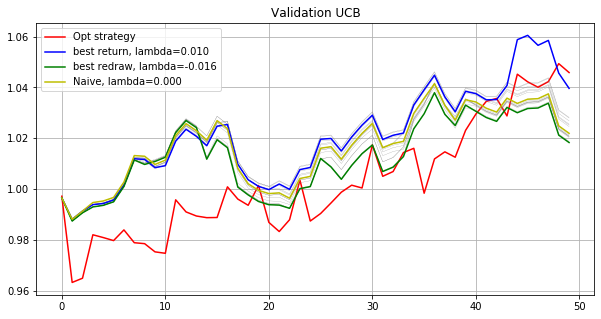

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.0038  0.      0.0122  0.0061  0.0021  0.0007  0.0019 -0.     -0.
  0.0138  0.      0.0192 -0.      0.0337  0.      0.0201 -0.     -0.
  0.0022 -0.     -0.      0.0023 -0.     -0.      0.0238  0.      0.0023
 -0.      0.      0.0674 -0.     -0.     -0.      0.028  -0.      0.0127
  0.      0.      0.1213 -0.      0.     -0.      0.0278 -0.      0.006
 -0.      0.0032  0.     -0.     -0.      0.0534  0.      0.      0.0499
  0.0149 -0.      0.     -0.      0.028  -0.      0.0782 -0.      0.0118
  0.      0.0108  0.      0.0157 -0.      0.0342 -0.      0.0242  0.
 -0.     -0.      0.      0.084  -0.     -0.     -0.      0.      0.0024
 -0.     -0.      0.0478  0.0006 -0.     -0.      0.0027  0.0167  0.0159
 -0.      0.      0.0396 -0.      0.0141  0.     -0.      0.0113  0.0335
 -0.    ]
0.990074008216164
[ 0.0106  0.      0.0093  0.0002  0.0022  0.     -0.      0.      0.
  0.0189 -0.      0.0173  0.     -0.     -0.     -0.     -0.     -0.
  0.0081  0.007  -0.      0.015   0.015   0.

[ 0.      0.      0.0046  0.     -0.     -0.      0.      0.      0.
  0.0197  0.      0.      0.      0.009   0.      0.      0.     -0.
  0.0048  0.      0.0137  0.0444 -0.      0.0363  0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.0048 -0.      0.0026
  0.0065  0.      0.0043  0.      0.      0.      0.0545 -0.      0.0758
  0.      0.004   0.      0.0373  0.      0.0121  0.0564  0.0386  0.0129
  0.      0.     -0.     -0.      0.     -0.      0.0261  0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.0282  0.
  0.      0.      0.      0.0435  0.     -0.      0.0206  0.      0.
 -0.      0.     -0.      0.0183  0.      0.      0.1389  0.15    0.1051
  0.     -0.      0.     -0.      0.      0.      0.      0.      0.0271
  0.    ]
0.9944100588249278
[ 0.     -0.      0.0055  0.      0.0046 -0.     -0.     -0.      0.
  0.0235  0.0214  0.     -0.      0.0612  0.      0.0113  0.0138 -0.
  0.0059  0.      0.      0.0362  0.      0.0397 -0.  

[-0.     -0.      0.0069  0.0031  0.0005  0.0058  0.0003  0.      0.
  0.0462  0.     -0.      0.     -0.     -0.      0.      0.0235 -0.
  0.0316 -0.      0.      0.049   0.      0.     -0.      0.      0.0015
 -0.     -0.      0.0273  0.     -0.      0.      0.0122 -0.      0.0234
 -0.      0.      0.     -0.     -0.     -0.      0.0681  0.      0.0511
  0.      0.     -0.      0.0322 -0.      0.0366  0.0551  0.0086  0.0294
 -0.     -0.      0.      0.     -0.     -0.      0.0213  0.     -0.
 -0.      0.     -0.      0.      0.      0.02    0.      0.0994 -0.
  0.      0.      0.0239  0.0207  0.0079  0.     -0.     -0.      0.
  0.0695  0.      0.      0.      0.      0.     -0.      0.0635  0.0879
  0.      0.0647  0.      0.      0.     -0.      0.     -0.      0.0088
 -0.    ]
0.9988482768542992
[ 0.      0.      0.0102  0.0075  0.0163  0.0143  0.0042  0.      0.
  0.0208  0.      0.     -0.     -0.     -0.      0.     -0.      0.0197
  0.0205  0.      0.0127  0.     -0.      0.  

[ 0.      0.      0.0141  0.0041  0.0117  0.      0.0042 -0.      0.
  0.0434  0.      0.     -0.      0.0118  0.     -0.     -0.      0.0301
  0.      0.     -0.      0.0078  0.      0.0167  0.      0.      0.0101
 -0.      0.      0.0217 -0.     -0.     -0.     -0.     -0.     -0.
  0.04   -0.     -0.      0.0066 -0.      0.      0.0194  0.     -0.
  0.      0.0245  0.      0.0047 -0.      0.0261  0.0402 -0.      0.0265
  0.0095 -0.      0.      0.      0.0041  0.      0.0288 -0.      0.0004
 -0.      0.0168  0.      0.019  -0.      0.0357  0.0024  0.0223  0.
 -0.      0.1106  0.      0.0664  0.0104 -0.      0.     -0.     -0.
  0.0098 -0.      0.      0.0237 -0.     -0.      0.0326  0.0447  0.
 -0.      0.0571  0.066   0.     -0.      0.0522 -0.     -0.      0.0237
  0.    ]
1.0050947774584253
[ 0.      0.      0.0132  0.004   0.016   0.0069  0.0048  0.     -0.
  0.0016 -0.      0.0041  0.     -0.     -0.     -0.      0.      0.
  0.0223 -0.      0.      0.0243 -0.     -0.      0.03

[ 0.      0.      0.0086  0.004   0.0044  0.      0.0026 -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.0083  0.01    0.012   0.      0.0085 -0.      0.     -0.
  0.     -0.      0.      0.1132  0.     -0.      0.0824 -0.     -0.
  0.0158  0.     -0.      0.      0.      0.0062 -0.     -0.      0.0557
  0.0072 -0.      0.      0.0505  0.      0.005  -0.      0.      0.0548
 -0.     -0.      0.      0.      0.     -0.      0.0277  0.085   0.
  0.      0.0061  0.0292  0.     -0.      0.      0.0114  0.0187  0.0031
  0.     -0.      0.0184  0.1226  0.     -0.     -0.      0.     -0.
  0.0423 -0.      0.     -0.     -0.     -0.      0.      0.017   0.0276
  0.      0.1312 -0.     -0.     -0.      0.      0.0104 -0.     -0.
  0.    ]
1.0037665045035886
[ 0.0032  0.      0.0072  0.      0.0064  0.     -0.     -0.     -0.
  0.0046  0.      0.     -0.     -0.      0.      0.0289  0.      0.
  0.      0.      0.      0.0274 -0.      0.      0.0062 -

[ 0.0112  0.      0.01    0.0019  0.0109  0.0054  0.0021  0.      0.
  0.0186 -0.      0.      0.      0.     -0.      0.0002  0.      0.0033
  0.0162  0.018   0.0491  0.0012  0.      0.0119  0.0366  0.      0.
  0.      0.      0.0094  0.0343  0.      0.0545  0.0101  0.      0.0327
  0.      0.      0.0015  0.      0.      0.      0.0062  0.0002  0.
  0.0155  0.0218 -0.      0.0285  0.0118  0.0178  0.      0.      0.0659
 -0.      0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.0041  0.     -0.     -0.      0.0126  0.     -0.      0.
  0.0357  0.0362  0.      0.0414  0.      0.     -0.      0.     -0.
  0.0362 -0.      0.      0.      0.     -0.      0.0726  0.      0.
 -0.     -0.      0.0251 -0.     -0.      0.1446  0.     -0.      0.0617
  0.0231]
1.0112579772946555
[-0.      0.0024  0.0093  0.      0.      0.0186  0.0011  0.     -0.
  0.0183  0.     -0.      0.     -0.     -0.      0.0177  0.      0.
  0.0125 -0.     -0.      0.0219 -0.      0.      0.      

[ 0.      0.      0.014   0.0022  0.0174  0.      0.0031 -0.      0.
  0.0123  0.      0.     -0.     -0.     -0.      0.0088 -0.     -0.
 -0.      0.      0.0178  0.      0.      0.      0.      0.      0.0122
 -0.     -0.      0.     -0.     -0.      0.0152  0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.0508  0.      0.
 -0.      0.0028  0.      0.0809  0.      0.0208  0.     -0.      0.0533
  0.      0.      0.      0.      0.     -0.      0.0539 -0.     -0.
  0.      0.      0.0173  0.019   0.      0.0104  0.     -0.     -0.
 -0.      0.0093 -0.      0.1153 -0.      0.0003  0.      0.0884  0.0337
  0.0337  0.      0.0519  0.0311 -0.      0.      0.1686  0.      0.
  0.012   0.      0.0021 -0.     -0.      0.0033  0.0202 -0.      0.018
 -0.    ]
0.9996516373361561
[ 0.      0.      0.0099  0.      0.0127  0.      0.0008  0.      0.
  0.0086  0.0174 -0.      0.     -0.     -0.     -0.      0.      0.
  0.0053 -0.     -0.      0.0055 -0.      0.0501  0.0008  0

[ 0.      0.      0.0123  0.      0.0185  0.024   0.0048 -0.      0.
  0.0597 -0.      0.      0.      0.0377  0.     -0.      0.     -0.
  0.0314  0.      0.      0.0378 -0.     -0.      0.      0.      0.0086
  0.      0.      0.0149 -0.      0.      0.0699  0.0422 -0.      0.0108
 -0.     -0.      0.      0.0034  0.      0.      0.0232  0.      0.0471
  0.      0.0032  0.      0.     -0.      0.0387 -0.      0.      0.
 -0.      0.     -0.      0.      0.0013 -0.      0.0031  0.0229  0.039
 -0.      0.      0.      0.0166  0.      0.0045  0.      0.0274 -0.
  0.0031  0.     -0.      0.089   0.      0.     -0.     -0.      0.
 -0.     -0.      0.0604  0.0147  0.1112  0.      0.     -0.      0.
  0.     -0.      0.016   0.016  -0.      0.      0.0267  0.      0.0599
 -0.    ]
1.0003242562397223
[-0.     -0.      0.0137  0.007   0.0088  0.      0.0071 -0.     -0.
  0.0337  0.     -0.     -0.      0.      0.      0.      0.0235 -0.
  0.0064  0.     -0.      0.0624  0.      0.      0.   

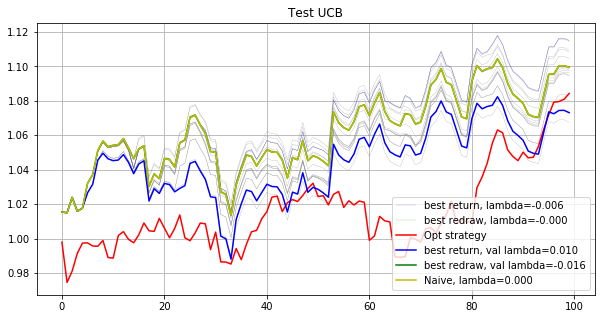

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.0319  0.0123  0.0091  0.0115  0.0059 -0.     -0.
  0.      0.0057  0.      0.0282  0.0056 -0.      0.0116 -0.      0.
  0.      0.     -0.      0.0558  0.      0.024   0.0029  0.      0.0028
 -0.      0.012   0.0385  0.     -0.      0.      0.0097  0.     -0.
 -0.     -0.      0.008   0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.028   0.0397  0.      0.0719
  0.0406  0.      0.      0.0005  0.      0.0256 -0.     -0.     -0.
 -0.      0.0167  0.0003  0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.1167 -0.     -0.      0.      0.0452  0.1299 -0.
  0.093   0.     -0.      0.      0.     -0.      0.      0.0113  0.
  0.      0.0263 -0.      0.     -0.      0.      0.0497  0.0042  0.01
  0.0147]
1.004842785002704
[ 0.      0.      0.0001  0.0121  0.0097 -0.      0.0083 -0.     -0.
  0.0046  0.0021  0.      0.0263  0.     -0.     -0.   

[ 0.      0.     -0.      0.0069  0.0021  0.      0.0011  0.      0.
  0.0235  0.0011 -0.      0.0241 -0.      0.     -0.      0.      0.
  0.0134  0.014   0.0062  0.013   0.      0.0052  0.0222  0.     -0.
 -0.      0.0043  0.0829  0.0224 -0.     -0.      0.     -0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.0559  0.0035
  0.0018  0.      0.0328  0.     -0.      0.083   0.0174  0.     -0.
  0.0283  0.     -0.     -0.      0.      0.0189  0.     -0.      0.
  0.0484 -0.     -0.      0.     -0.     -0.      0.0045  0.1916  0.
  0.     -0.      0.0382 -0.     -0.      0.0249  0.      0.04   -0.
 -0.     -0.      0.     -0.      0.      0.0204  0.      0.      0.0419
  0.     -0.     -0.     -0.      0.0357  0.      0.0701  0.     -0.
  0.    ]
0.9962673360670274
[ 0.     -0.      0.0188  0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.      0.0155  0.0019  0.      0.0058  0.0308 -0.     -

[-0.      0.0049 -0.      0.0086  0.0072  0.      0.0031  0.     -0.
  0.      0.026   0.      0.0291  0.0202 -0.      0.     -0.     -0.
  0.0183  0.      0.02    0.0075 -0.      0.0299  0.0319 -0.     -0.
 -0.     -0.      0.0096  0.      0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.0045  0.      0.025
  0.0064  0.      0.0332  0.0079  0.      0.0299  0.015  -0.      0.
  0.0456 -0.     -0.      0.0367  0.      0.0404  0.     -0.      0.
  0.      0.      0.0377  0.0204 -0.     -0.     -0.      0.1708  0.
  0.0093 -0.      0.0013  0.      0.0006 -0.      0.      0.0693  0.0145
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.0034
  0.      0.0472 -0.     -0.     -0.      0.0634  0.0669 -0.      0.0088
  0.0254]
1.0039102114041598
[ 0.     -0.      0.014   0.0044  0.0036  0.      0.      0.      0.
 -0.     -0.      0.0078  0.0091  0.0046 -0.      0.     -0.     -0.
  0.0398  0.0047  0.     -0.      0.      0.     -0.     -0

[-0.     -0.      0.0055  0.0043  0.0022  0.      0.     -0.      0.
  0.0084  0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.0741  0.0094 -0.      0.0722 -0.      0.
 -0.      0.0119 -0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.0029  0.     -0.      0.      0.
 -0.      0.0294  0.0019  0.      0.      0.1317  0.0175 -0.     -0.
  0.0251  0.      0.0856  0.0642 -0.      0.     -0.     -0.     -0.
  0.0237  0.0021  0.      0.0481  0.      0.0001 -0.      0.0391 -0.
  0.      0.     -0.      0.     -0.      0.0299  0.1014  0.      0.0276
 -0.      0.     -0.     -0.      0.      0.      0.      0.0409 -0.
  0.      0.0417 -0.     -0.      0.      0.0078  0.0914 -0.     -0.
 -0.    ]
1.0067456854217598
[-0.      0.      0.027   0.005   0.0042  0.     -0.      0.     -0.
 -0.      0.     -0.      0.0161  0.0225 -0.     -0.      0.     -0.
  0.0482  0.0164  0.0278  0.0144  0.      0.0141  0.0086 -0.     -0.
 

[ 0.      0.     -0.      0.0054  0.0036  0.      0.0016  0.      0.0214
 -0.     -0.      0.0228  0.0143  0.0098 -0.     -0.     -0.     -0.
 -0.     -0.      0.0024 -0.      0.0055  0.0194  0.0451 -0.     -0.
 -0.      0.      0.1121  0.      0.0033  0.     -0.     -0.      0.
  0.     -0.     -0.      0.0048 -0.     -0.      0.0591  0.0169 -0.
 -0.      0.0033  0.0202  0.      0.0011  0.0631  0.     -0.      0.0572
  0.034  -0.      0.0348 -0.     -0.      0.0279  0.0037  0.      0.
 -0.      0.0058 -0.      0.     -0.     -0.      0.      0.1524 -0.
  0.     -0.     -0.      0.0321  0.      0.      0.      0.0215  0.0795
 -0.     -0.      0.      0.      0.      0.     -0.      0.0023  0.0165
 -0.      0.      0.     -0.     -0.     -0.      0.0972  0.     -0.
 -0.    ]
0.9968150718696726
[-0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.0115  0.0126 -0.     -0.     -0.     -0.
  0.0183  0.     -0.      0.07   -0.     -0.      0.     -

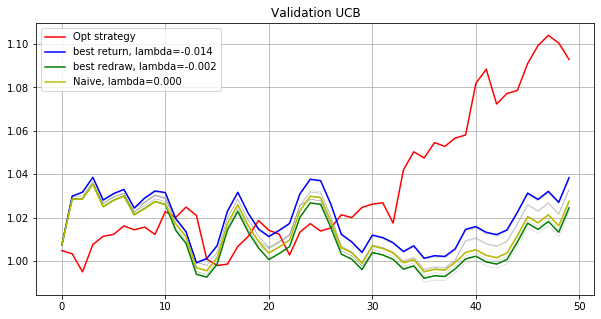

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[-0.      0.      0.0057  0.01    0.0098 -0.      0.0065 -0.      0.
  0.      0.      0.      0.0261  0.0579 -0.      0.0033 -0.      0.
  0.0253  0.0023 -0.      0.     -0.      0.0123  0.0667  0.      0.
  0.      0.0162  0.0812 -0.      0.     -0.      0.0323 -0.     -0.
  0.     -0.      0.0118  0.      0.     -0.     -0.      0.0097 -0.
 -0.     -0.      0.0096 -0.      0.0038  0.      0.      0.      0.
  0.0535  0.0105  0.0011  0.0389  0.      0.0374 -0.     -0.      0.
  0.0026  0.0213 -0.      0.     -0.      0.0092 -0.      0.      0.
  0.      0.0428 -0.     -0.     -0.      0.0798  0.0024  0.      0.0014
  0.     -0.      0.      0.     -0.      0.0272  0.      0.0092  0.0147
  0.0802  0.     -0.      0.06    0.0188  0.052   0.0026  0.0432  0.0008
  0.    ]
1.0015223969298799
[ 0.      0.      0.015   0.009   0.0088 -0.      0.0043 -0.     -0.
  0.005  -0.     -0.      0.028   0.0525 -0.      0.0088 -0.      0.
  0.      0.     -0.     -0.     -0.      0.0255 -0.      0.00

[-0.     -0.      0.021   0.0044  0.     -0.     -0.     -0.      0.
  0.     -0.      0.0264  0.0021  0.     -0.      0.      0.0276 -0.
  0.035   0.0053  0.008  -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.113  -0.     -0.      0.0387 -0.      0.     -0.
 -0.      0.0052  0.      0.     -0.      0.0418  0.     -0.      0.
  0.      0.0652  0.      0.     -0.      0.0074  0.     -0.      0.1012
  0.0257  0.      0.      0.0507  0.      0.      0.     -0.     -0.
  0.0132  0.      0.      0.0282 -0.      0.      0.0782  0.      0.
 -0.      0.      0.0268  0.     -0.     -0.     -0.      0.      0.
  0.1196  0.0093  0.     -0.      0.0162 -0.     -0.      0.     -0.
  0.      0.     -0.      0.      0.1028  0.      0.      0.0269  0.
 -0.    ]
0.9960925849235922
[ 0.      0.0027  0.      0.0066  0.0085  0.      0.0053  0.      0.0387
  0.     -0.      0.0402  0.0235 -0.      0.      0.      0.     -0.
  0.     -0.      0.     -0.     -0.      0.0278 -0.     -0.     -

[ 0.      0.0041  0.0194  0.0055  0.009  -0.      0.0034 -0.     -0.
 -0.     -0.      0.0044  0.0241  0.0171 -0.     -0.     -0.      0.
 -0.      0.0136  0.0078  0.     -0.      0.0145  0.0239  0.     -0.
  0.      0.     -0.      0.0781  0.0005  0.0057  0.     -0.      0.0226
 -0.     -0.      0.     -0.     -0.      0.0473  0.0469  0.0076 -0.
  0.0087  0.      0.      0.0023  0.0193  0.0349  0.      0.     -0.
  0.0303  0.0033 -0.      0.0328 -0.      0.0014 -0.     -0.     -0.
 -0.      0.0199  0.      0.     -0.     -0.      0.     -0.      0.023
  0.     -0.      0.0504  0.      0.      0.0122 -0.      0.0248  0.
 -0.     -0.     -0.      0.      0.0573  0.     -0.      0.      0.0419
 -0.      0.0156 -0.      0.     -0.      0.0342  0.1339  0.0542  0.0212
  0.0227]
0.9927446785671572
[ 0.      0.      0.0045  0.0037  0.      0.      0.     -0.      0.
  0.0483  0.      0.027   0.0166  0.0016 -0.      0.      0.     -0.
  0.0002  0.0613  0.      0.0378 -0.      0.0132  0.0415 -0

[-0.      0.      0.0171  0.0015  0.0061 -0.      0.0035  0.      0.0063
 -0.     -0.      0.      0.0118  0.      0.      0.      0.0208  0.
  0.0315  0.0144  0.0351  0.0044  0.0353  0.0186 -0.      0.      0.
  0.      0.0208  0.     -0.      0.0086  0.      0.0015 -0.     -0.
  0.      0.      0.      0.0686 -0.      0.0575  0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.0144 -0.      0.0724
  0.033  -0.     -0.      0.0002  0.      0.0312  0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.019   0.     -0.
  0.0137 -0.      0.     -0.     -0.      0.0584  0.2555  0.     -0.
 -0.      0.0267 -0.      0.0584 -0.      0.0419  0.     -0.      0.0118
  0.    ]
0.9953674840916851
[ 0.      0.      0.0233  0.0012  0.     -0.      0.      0.      0.
  0.0432  0.      0.0133  0.0052  0.0018 -0.      0.      0.     -0.
 -0.      0.0024  0.0253 -0.      0.      0.0066  0.0345 -0.  

[ 0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.0048 -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0489  0.0476 -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.0366 -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.      0.0037 -0.      0.     -0.      0.
  0.      0.0253 -0.     -0.     -0.      0.0298  0.      0.      0.0576
  0.      0.0393 -0.      0.0882  0.     -0.      0.1078 -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.0201 -0.
  0.      0.     -0.      0.      0.      0.0457 -0.      0.1269 -0.
 -0.      0.0018  0.     -0.      0.      0.      0.1819 -0.      0.
 -0.      0.1061 -0.     -0.     -0.     -0.      0.0276 -0.     -0.
 -0.    ]
0.9675332070548582
[ 0.0033 -0.      0.003   0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.0149  0.      0.      0.      0.     -0.      0.
  0.     -0.      0.0617  0.0315 -0.     -0.      0.      0.     -0.
 

[ 0.      0.     -0.      0.0051  0.      0.      0.      0.      0.0177
 -0.     -0.     -0.      0.0077  0.0167  0.      0.      0.      0.0195
  0.044  -0.      0.024   0.0025  0.      0.0083 -0.      0.     -0.
 -0.      0.      0.0443  0.     -0.      0.0297  0.0037  0.      0.1283
 -0.     -0.     -0.      0.      0.      0.0363 -0.      0.     -0.
 -0.      0.      0.0011  0.     -0.      0.      0.     -0.      0.0069
  0.0264  0.035  -0.      0.023  -0.      0.      0.     -0.      0.
  0.0437 -0.     -0.      0.      0.     -0.      0.      0.0221 -0.
  0.      0.0083  0.1349  0.0408  0.     -0.      0.0377  0.0139 -0.
  0.0602  0.     -0.     -0.      0.      0.      0.      0.      0.0283
  0.      0.0887 -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.0413]
0.9908714041312371
[ 0.      0.0219  0.0316 -0.     -0.      0.     -0.     -0.      0.0039
 -0.     -0.     -0.      0.005   0.0057 -0.      0.     -0.     -0.
 -0.      0.      0.0189 -0.     -0.      0.0027  

[-0.     -0.      0.031  -0.      0.0023 -0.      0.      0.      0.0043
  0.      0.      0.     -0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.041   0.      0.      0.0164  0.     -0.      0.
  0.     -0.     -0.      0.0163 -0.     -0.      0.0138 -0.     -0.
  0.      0.     -0.      0.      0.0145  0.      0.      0.1136  0.
  0.     -0.      0.     -0.      0.0018  0.0173  0.      0.      0.1258
  0.0126  0.0639  0.     -0.     -0.      0.0087  0.0061  0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.0059 -0.
 -0.      0.      0.      0.     -0.      0.0072  0.      0.0984  0.
  0.      0.      0.      0.      0.      0.2424  0.      0.      0.0027
 -0.      0.0261  0.     -0.     -0.      0.128   0.     -0.     -0.
  0.    ]
1.0149718134849692
[ 0.     -0.     -0.      0.0122  0.0096  0.      0.0031  0.      0.
 -0.      0.     -0.      0.0132  0.      0.      0.      0.      0.
 -0.      0.      0.      0.0182  0.      0.0125  0.0175  0.  

[ 0.      0.      0.0206 -0.     -0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.0053  0.      0.     -0.     -0.      0.
 -0.     -0.      0.023   0.      0.      0.      0.0038  0.      0.
  0.      0.      0.      0.      0.     -0.      0.0383 -0.      0.
 -0.      0.     -0.      0.0028 -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.      0.      0.0877  0.
 -0.      0.      0.      0.2556  0.     -0.      0.      0.      0.
  0.1656  0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.0692  0.      0.     -0.      0.3     0.0281  0.      0.
 -0.    ]
0.9851283861504198
[ 0.      0.      0.0149  0.      0.      0.      0.     -0.      0.
  0.0082  0.      0.      0.003  -0.      0.      0.      0.      0.
 -0.      0.0938  0.      0.0484 -0.     -0.      0.0668  0.      0.
  0. 

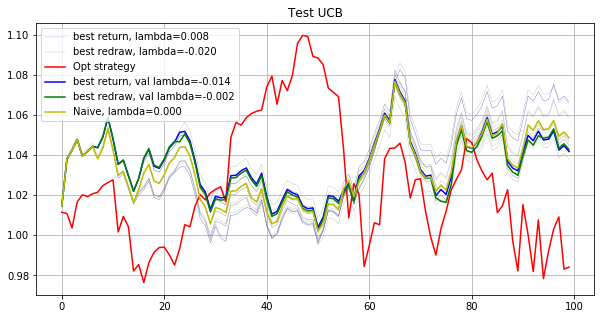

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.0223
 -0.      0.      0.007  -0.      0.      0.0076  0.019   0.0145 -0.
  0.1078 -0.      0.     -0.      0.      0.      0.0081 -0.      0.0156
 -0.      0.     -0.     -0.      0.0058  0.     -0.      0.1023  0.
  0.     -0.     -0.      0.      0.0322  0.0761  0.     -0.      0.0338
  0.0178  0.0699  0.     -0.     -0.      0.      0.0305  0.      0.
  0.     -0.     -0.      0.      0.0302  0.      0.      0.      0.0083
 -0.     -0.     -0.      0.0272  0.      0.     -0.     -0.      0.
  0.1793  0.      0.      0.0399 -0.      0.      0.      0.015   0.0364
  0.0478 -0.     -0.      0.0132  0.     -0.      0.0184 -0.      0.0139
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.    ]
1.0269029154701212
[-0.      0.0249  0.0043 -0.      0.      0.0143  0.0448 -0.      0.0195
  0.      0.0018  0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.      0.0318  0.     -0.
 -0.      0.      0.0018 -0.     -0.     -0.      0.1386 -0.      0.
  0.     -0.      0.0523  0.0129 -0.     -0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.2804  0.
 -0.      0.     -0.     -0.      0.0755  0.      0.      0.0265 -0.
  0.      0.0118  0.      0.      0.      0.1046  0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.0145  0.     -0.
 -0.     -0.      0.0212  0.0416 -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.0356  0.     -0.
  0.0253  0.091   0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.0346 -0.     -0.     -0.
 -0.    ]
1.0016421976084307
[-0.      0.0378 -0.      0.      0.     -0.      0.      0.08    0.0036
  0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
  0.0507 -0.      0.      0.      0.     -0.      0.0847  0.      0.00

[ 0.      0.     -0.      0.     -0.      0.0054 -0.      0.      0.0133
 -0.     -0.      0.0161 -0.      0.      0.0219  0.      0.     -0.
  0.0009 -0.     -0.      0.0274  0.      0.      0.0539  0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.0845  0.
 -0.     -0.     -0.     -0.      0.0491  0.1    -0.      0.0647 -0.
  0.0192  0.0503 -0.     -0.      0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.      0.0325 -0.      0.0118  0.
 -0.     -0.      0.0492  0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.016   0.0631  0.
  0.0138  0.0278 -0.      0.0342  0.     -0.      0.      0.0479  0.0974
  0.      0.019   0.0599  0.     -0.      0.0104  0.      0.0105 -0.
 -0.    ]
1.000510389179128
[ 0.     -0.     -0.     -0.     -0.     -0.      0.      0.      0.0008
  0.     -0.     -0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.015   0.     -0.     -0.      0.0594 -0.   

[ 0.      0.0406 -0.      0.     -0.      0.     -0.     -0.      0.0207
 -0.      0.     -0.      0.0029 -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0236  0.      0.      0.      0.0374  0.      0.0113
 -0.      0.      0.0038 -0.     -0.      0.0445 -0.      0.0835 -0.
 -0.      0.      0.0682  0.018   0.      0.0117 -0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.      0.0012  0.
  0.      0.      0.      0.      0.0274  0.      0.0032 -0.     -0.
  0.0115  0.     -0.      0.      0.      0.     -0.      0.      0.
  0.0318 -0.      0.      0.      0.0196 -0.      0.0384 -0.      0.
  0.0954  0.0294 -0.      0.0555  0.      0.      0.0073  0.0186  0.
  0.      0.      0.0052  0.     -0.      0.      0.1283  0.      0.1221
  0.0391]
1.0109007252252202
[ 0.      0.0002 -0.     -0.     -0.      0.      0.     -0.      0.0097
 -0.     -0.     -0.      0.0068 -0.     -0.      0.0146 -0.     -0.
 -0.     -0.      0.0066  0.      0.      0.      0.0862  

[ 0.      0.0381 -0.      0.      0.      0.      0.0544 -0.      0.0134
 -0.     -0.      0.0062 -0.      0.      0.0133  0.0932 -0.     -0.
  0.0271 -0.     -0.     -0.      0.      0.      0.0811  0.0317  0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.      0.      0.0646  0.0525 -0.     -0.     -0.
  0.02    0.     -0.     -0.      0.      0.0646  0.0051 -0.      0.
  0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.0365 -0.      0.0706  0.      0.      0.      0.     -0.
  0.0419  0.      0.      0.0552 -0.      0.      0.0198  0.      0.
  0.0854  0.0354 -0.     -0.     -0.     -0.      0.0083 -0.      0.
  0.      0.      0.     -0.      0.      0.037   0.     -0.      0.0447
 -0.    ]
0.9919099267912772
[-0.      0.0205 -0.      0.      0.      0.      0.      0.      0.0129
  0.      0.0029 -0.     -0.     -0.     -0.      0.0152  0.      0.
 -0.      0.      0.0385  0.     -0.     -0.      0.0749  0.00

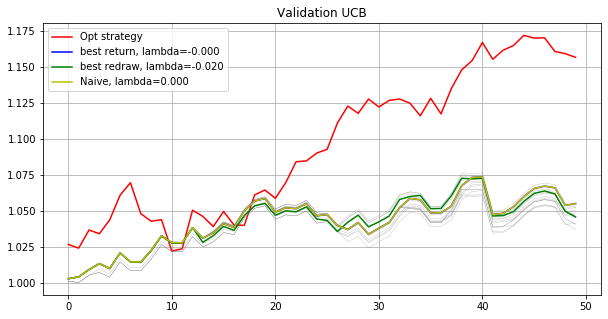

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[-0.      0.0136 -0.      0.0008  0.      0.004  -0.      0.      0.029
 -0.     -0.     -0.     -0.     -0.      0.005   0.0292  0.     -0.
  0.0042 -0.     -0.     -0.      0.      0.0093  0.0233  0.      0.
 -0.     -0.      0.     -0.      0.0113  0.0159 -0.      0.0887 -0.
  0.     -0.      0.0258  0.0167  0.031   0.0013  0.     -0.     -0.
  0.021   0.0187  0.      0.      0.      0.0175  0.      0.     -0.
  0.     -0.      0.0066  0.     -0.      0.      0.0877 -0.     -0.
  0.0026 -0.      0.     -0.      0.0328  0.      0.0541 -0.      0.
  0.     -0.      0.0009  0.     -0.      0.      0.      0.0054 -0.
  0.1386  0.0026 -0.      0.0676  0.      0.0385  0.      0.0776  0.
  0.0234  0.0126  0.      0.     -0.      0.      0.      0.0397  0.0429
 -0.    ]
1.0014395669308325
[ 0.      0.0254  0.     -0.     -0.     -0.      0.0244  0.      0.0296
 -0.      0.     -0.     -0.     -0.     -0.      0.0722 -0.     -0.
  0.0106 -0.     -0.     -0.     -0.      0.      0.0815  0.026

[ 0.      0.      0.      0.      0.      0.     -0.      0.      0.0219
 -0.      0.0232 -0.     -0.      0.     -0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.1218  0.1558  0.
 -0.     -0.     -0.     -0.      0.0036  0.0392 -0.      0.0071  0.
  0.     -0.      0.0219 -0.     -0.      0.0547  0.      0.      0.
  0.0051  0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.0082  0.      0.      0.0248 -0.      0.0547  0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.0174 -0.      0.
 -0.     -0.      0.      0.0231 -0.     -0.      0.0515  0.      0.0905
  0.0582  0.0415 -0.     -0.      0.     -0.     -0.      0.0701  0.0185
  0.      0.      0.0029  0.     -0.     -0.      0.0084 -0.      0.0759
 -0.    ]
1.0122417018064038
[ 0.      0.     -0.      0.     -0.      0.0062 -0.     -0.      0.022
 -0.      0.029   0.0218  0.002   0.      0.      0.0199 -0.     -0.
 -0.     -0.     -0.      0.0412  0.      0.0079  0.032

[ 0.      0.0178 -0.      0.      0.      0.      0.      0.      0.0213
 -0.      0.      0.0081 -0.      0.      0.      0.     -0.     -0.
  0.0259 -0.      0.0381 -0.      0.      0.      0.0923  0.079   0.
 -0.     -0.      0.     -0.     -0.      0.0017 -0.     -0.      0.
 -0.     -0.      0.0128  0.      0.0434  0.0522  0.     -0.     -0.
  0.0384  0.      0.     -0.      0.      0.     -0.     -0.      0.0221
  0.     -0.     -0.      0.     -0.      0.0008  0.     -0.      0.
  0.     -0.      0.1249 -0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.      0.0062  0.      0.0178 -0.      0.0471
  0.      0.0328  0.      0.0197 -0.     -0.      0.      0.0543 -0.
  0.      0.      0.1104  0.     -0.     -0.      0.0392 -0.      0.0783
  0.0155]
0.9968614828967012
[-0.      0.0156 -0.      0.      0.      0.     -0.      0.0055  0.0147
 -0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.01

[ 0.      0.0013 -0.      0.      0.      0.0012 -0.      0.0035  0.0189
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.0106  0.0093  0.
  0.      0.     -0.     -0.     -0.      0.0127  0.     -0.      0.
  0.      0.0737  0.      0.      0.      0.1365  0.      0.     -0.
  0.0312  0.0082  0.      0.0157 -0.      0.     -0.     -0.      0.
  0.      0.      0.0967  0.      0.     -0.     -0.      0.      0.
 -0.      0.0254  0.      0.     -0.      0.      0.      0.     -0.
  0.0073 -0.     -0.      0.      0.0074 -0.      0.      0.      0.0799
 -0.      0.0939  0.      0.0667  0.     -0.      0.1711  0.0201 -0.
 -0.      0.     -0.      0.      0.0254 -0.      0.0734 -0.      0.
  0.0099]
0.9952221051202633
[ 0.      0.      0.      0.0014  0.     -0.     -0.      0.0079  0.0253
 -0.      0.     -0.     -0.     -0.      0.      0.0218  0.      0.
 -0.     -0.      0.0137  0.      0.      0.      0.062   0.00

[ 0.      0.      0.     -0.      0.      0.0054  0.     -0.      0.0231
  0.      0.     -0.     -0.     -0.      0.      0.0252 -0.     -0.
  0.      0.      0.0896 -0.     -0.      0.0086  0.0058 -0.      0.0371
  0.0376 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.      0.0056  0.      0.      0.0355  0.0405  0.     -0.     -0.
  0.      0.0213 -0.      0.035   0.     -0.     -0.      0.      0.
 -0.      0.      0.0597 -0.     -0.      0.      0.0855  0.0214 -0.
  0.      0.     -0.     -0.      0.      0.0095 -0.     -0.     -0.
  0.     -0.      0.      0.      0.0199  0.     -0.      0.     -0.
  0.0842  0.004  -0.     -0.      0.0229  0.      0.1116  0.1528 -0.
 -0.      0.      0.      0.     -0.     -0.      0.0582 -0.      0.
  0.    ]
1.0025233034256849
[ 0.      0.0459 -0.      0.0586  0.      0.0025  0.0533  0.0083  0.0125
  0.     -0.      0.0005  0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.1055  0.  

[-0.      0.0385  0.      0.0018  0.      0.      0.      0.      0.0245
 -0.      0.1038  0.0176  0.0033 -0.     -0.      0.0332 -0.     -0.
  0.0114  0.     -0.     -0.     -0.     -0.      0.      0.      0.
  0.0174 -0.     -0.      0.0268 -0.      0.0765 -0.      0.      0.
 -0.      0.0123  0.0288  0.0382 -0.      0.0451 -0.      0.0464 -0.
  0.0102  0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.104   0.      0.      0.     -0.     -0.      0.0496 -0.     -0.
 -0.      0.0331  0.      0.0542 -0.      0.0086 -0.      0.      0.
  0.      0.     -0.      0.0196  0.0054  0.      0.      0.021  -0.
  0.      0.0288  0.      0.0057  0.      0.0385  0.      0.034   0.0227
  0.     -0.      0.      0.      0.      0.      0.0392  0.      0.
 -0.    ]
1.0055138972652902
[-0.      0.0035 -0.     -0.      0.      0.      0.0619 -0.      0.0195
 -0.      0.0374  0.0075  0.     -0.     -0.      0.0183 -0.     -0.
  0.0076  0.     -0.      0.      0.     -0.      0.1132  0.00

[-0.      0.0399 -0.      0.     -0.      0.0021  0.0469 -0.      0.0228
 -0.      0.0148 -0.      0.007   0.      0.      0.      0.      0.
 -0.     -0.      0.0123  0.      0.      0.      0.033   0.      0.
 -0.     -0.      0.005  -0.     -0.      0.0797 -0.      0.005  -0.
  0.0103 -0.      0.     -0.      0.2209  0.0779 -0.     -0.     -0.
  0.      0.0895  0.      0.0127  0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.0086  0.0286 -0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.0008  0.
 -0.     -0.      0.      0.0411 -0.      0.     -0.      0.0596 -0.
 -0.     -0.     -0.      0.0315  0.      0.      0.0583  0.0577 -0.
  0.     -0.      0.      0.      0.      0.      0.0208  0.      0.
  0.0134]
1.012951985381345
[-0.      0.009  -0.     -0.     -0.     -0.      0.      0.      0.0102
 -0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.0092 -0.      0.0095  0.     -0.     -0.      0.0637  0.      0

[-0.      0.0402  0.     -0.     -0.     -0.     -0.      0.0063  0.0049
  0.      0.0069 -0.     -0.     -0.      0.0121 -0.      0.     -0.
 -0.     -0.      0.1139 -0.     -0.      0.      0.0344 -0.      0.0799
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.051   0.
  0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.0126 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.0135  0.     -0.      0.     -0.     -0.      0.     -0.
  0.0412 -0.      0.0474 -0.      0.0028  0.     -0.     -0.      0.
  0.1173  0.0565 -0.      0.0104 -0.      0.      0.1037  0.0494  0.
 -0.      0.     -0.     -0.      0.     -0.      0.1427 -0.      0.053
  0.    ]
1.0103237192461871
[-0.     -0.     -0.      0.0785 -0.      0.     -0.     -0.      0.021
 -0.      0.0105  0.023  -0.     -0.      0.      0.0336  0.     -0.
 -0.     -0.     -0.      0.0287  0.     -0.      0.0418  0.

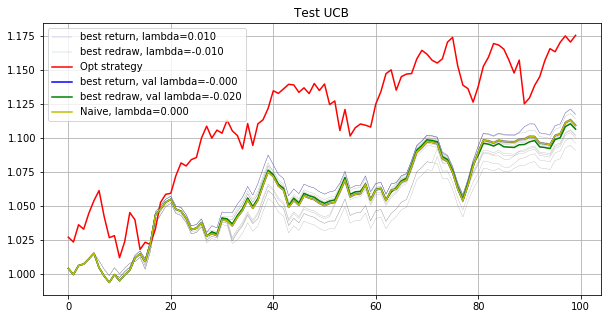

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[ 0.     -0.      0.0263  0.      0.      0.      0.      0.     -0.
 -0.      0.0004 -0.     -0.      0.     -0.      0.0253 -0.      0.0078
 -0.      0.      0.0469  0.      0.      0.0137  0.0046  0.0472  0.0204
  0.0021 -0.      0.0083  0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.0631 -0.     -0.     -0.     -0.      0.147  -0.      0.0127
  0.006   0.0045  0.     -0.      0.0214 -0.      0.0166 -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.077   0.0577  0.      0.0415  0.      0.1174 -0.      0.
  0.0141  0.0509 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0974  0.      0.     -0.     -0.      0.07   -0.      0.      0.
 -0.    ]
0.9944631100282031
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.0011  0.002   0.0061  0.0103  0.0033  0.      0

[ 0.      0.0047 -0.      0.      0.      0.0178  0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.0609 -0.     -0.     -0.
  0.0015 -0.      0.      0.0368 -0.      0.014  -0.     -0.     -0.
  0.     -0.      0.0182 -0.     -0.     -0.     -0.      0.      0.
 -0.      0.0032  0.012   0.0587 -0.      0.      0.0538  0.0005  0.
 -0.      0.1282 -0.     -0.      0.0758  0.     -0.     -0.      0.
 -0.     -0.     -0.      0.0498  0.0103  0.     -0.      0.0787  0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.      0.0497
 -0.      0.0466  0.0417 -0.      0.1062  0.0139 -0.     -0.     -0.
  0.0423  0.0096 -0.     -0.     -0.     -0.     -0.      0.      0.029
  0.      0.001   0.     -0.      0.      0.     -0.      0.0142  0.0208
 -0.    ]
0.9888168677425562
[ 0.      0.0033  0.0217  0.      0.      0.      0.      0.      0.
  0.0014  0.      0.      0.0129  0.0753 -0.      0.0017  0.0087  0.0089
  0.0092 -0.      0.0943 -0.      0.      0.     -0.      0

[ 0.      0.      0.011   0.      0.      0.      0.0072 -0.      0.
  0.      0.     -0.      0.      0.      0.0587  0.0413  0.      0.
  0.      0.      0.0627  0.0266  0.      0.0066  0.      0.0084 -0.
  0.0021  0.      0.0179 -0.      0.0401  0.      0.      0.      0.0733
  0.      0.      0.      0.     -0.      0.      0.     -0.      0.0502
 -0.      0.     -0.      0.0763  0.009   0.      0.0797 -0.     -0.
  0.      0.039  -0.      0.      0.0546  0.      0.0639  0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.0195  0.     -0.      0.0319  0.0275  0.      0.1133  0.
 -0.     -0.      0.0367  0.     -0.      0.      0.0038  0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.      0.0308 -0.
  0.0079]
0.9952767758595392
[-0.     -0.      0.0347  0.0065  0.     -0.      0.      0.     -0.
  0.      0.      0.      0.0078  0.      0.0622  0.0467 -0.      0.0076
  0.     -0.      0.0783  0.0419 -0.      0.017  -0.      0.01

[ 0.     -0.      0.      0.     -0.      0.0106  0.0044 -0.     -0.
 -0.      0.     -0.      0.      0.      0.0537  0.0084 -0.      0.
  0.     -0.      0.0213  0.     -0.      0.     -0.      0.039  -0.
  0.     -0.      0.015  -0.      0.      0.0264 -0.     -0.      0.0046
 -0.     -0.      0.0053  0.031  -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.0496 -0.      0.1097  0.      0.
  0.     -0.      0.0126 -0.      0.      0.0497  0.037  -0.      0.
  0.0117  0.      0.     -0.     -0.      0.     -0.     -0.      0.0873
 -0.     -0.      0.0771 -0.     -0.      0.0263 -0.     -0.     -0.
 -0.      0.0158  0.      0.      0.      0.0561 -0.     -0.      0.0346
  0.     -0.      0.1166 -0.     -0.      0.     -0.      0.      0.0962
  0.    ]
0.9878648095037552
[-0.      0.0012  0.0155 -0.      0.      0.      0.0023 -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.0538 -0.      0.
 -0.      0.     -0.      0.0379  0.     -0.      0.      

[ 0.      0.01    0.0101 -0.     -0.      0.0159  0.007   0.0047 -0.
  0.0076 -0.     -0.      0.     -0.      0.      0.0259 -0.      0.013
 -0.     -0.      0.      0.0105  0.      0.     -0.      0.0694  0.
 -0.     -0.      0.0289 -0.      0.      0.0279  0.     -0.      0.0212
 -0.      0.      0.0082  0.     -0.      0.     -0.      0.011  -0.
  0.0292 -0.     -0.      0.      0.0533  0.0064 -0.     -0.     -0.
 -0.      0.0645 -0.      0.041   0.0053  0.      0.      0.0234  0.
  0.0587 -0.      0.      0.      0.0854  0.0311  0.      0.      0.
 -0.      0.1064  0.      0.0059  0.      0.0328 -0.     -0.      0.
 -0.      0.0528  0.0212  0.     -0.     -0.     -0.     -0.      0.062
 -0.      0.0282  0.     -0.     -0.      0.     -0.     -0.      0.0213
  0.    ]
1.0078776562173615
[ 0.      0.0064  0.     -0.     -0.      0.      0.0149  0.      0.
 -0.     -0.      0.008   0.0321  0.      0.0643  0.01   -0.     -0.
 -0.     -0.      0.1125  0.0394  0.      0.0114 -0.      0.

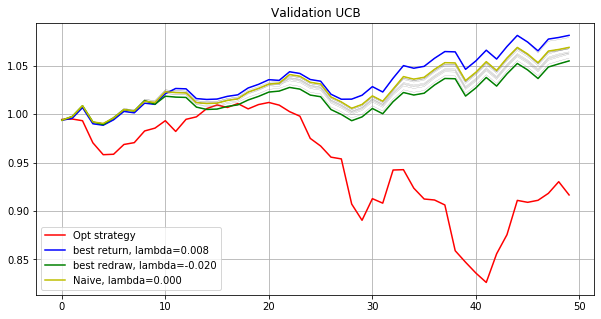

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.0031 -0.      0.0108 -0.     -0.      0.0195 -0.      0.
  0.0003 -0.      0.1913  0.0316  0.      0.0081  0.      0.0283  0.
  0.      0.      0.0188 -0.     -0.      0.1004 -0.     -0.      0.0361
  0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.0048 -0.      0.      0.      0.0218  0.      0.1474 -0.      0.0352
 -0.      0.     -0.      0.0155  0.      0.0877 -0.      0.0185  0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.0124  0.
 -0.      0.0786  0.0323  0.     -0.      0.     -0.      0.      0.
 -0.      0.0318 -0.      0.     -0.      0.0122  0.      0.      0.0533
 -0.     -0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.    ]
1.0073742320443546
[-0.      0.0013  0.034  -0.      0.0049  0.     -0.      0.     -0.
  0.0009 -0.     -0.      0.0035  0.0269 -0.      0.0225  0.      0.0089
  0.0078 -0.      0.0524  0.0324  0.      0.     -0.     -

[ 0.      0.0053  0.0361  0.      0.0035  0.      0.0091  0.      0.
  0.      0.      0.0135  0.0086  0.      0.0196  0.006   0.     -0.
  0.      0.      0.0385  0.      0.0292  0.      0.      0.      0.0247
  0.0071  0.      0.0336 -0.      0.      0.0253 -0.      0.      0.
  0.      0.      0.0213  0.0211  0.      0.      0.0081  0.      0.
  0.      0.0584 -0.     -0.      0.0062  0.      0.2167 -0.     -0.
 -0.      0.      0.0225  0.0067  0.0987 -0.      0.      0.     -0.
  0.      0.      0.     -0.     -0.      0.      0.0986  0.0446 -0.
  0.      0.0466  0.      0.      0.      0.0075 -0.     -0.     -0.
  0.      0.0554 -0.      0.     -0.     -0.      0.0144  0.     -0.
 -0.     -0.      0.     -0.     -0.      0.0131 -0.      0.     -0.
  0.    ]
0.9985033081548832
[ 0.      0.0033  0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.0283  0.     -0.      0.0168 -0.      0.0056
 -0.      0.      0.      0.0168  0.      0.      0.      0.1093  

[-0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.024   0.0734 -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.1743  0.      0.      0.     -0.     -0.
 -0.      0.      0.1873  0.     -0.      0.      0.016   0.0965  0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.1233
 -0.      0.0226  0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.0465
  0.      0.      0.236  -0.     -0.     -0.     -0.     -0.      0.
 -0.    ]
1.0057616082203895
[ 0.     -0.      0.0279 -0.     -0.      0.0031 -0.      0.     -0.
  0.      0.     -0.      0.0011  0.      0.0462 -0.     -0.      0.
 -0.     -0.      0.      0.      0.      0.     -0.      0.086  -

[ 0.013  -0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.031   0.0589 -0.     -0.     -0.     -0.      0.
 -0.      0.      0.0059  0.     -0.      0.     -0.      0.0732 -0.
  0.      0.      0.0115 -0.      0.0684 -0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.      0.0935  0.0297  0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.0076  0.      0.0513  0.0004 -0.
 -0.      0.      0.     -0.     -0.     -0.      0.0884 -0.      0.1796
  0.     -0.     -0.      0.     -0.     -0.      0.0139  0.      0.0781
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.0465
  0.      0.0102  0.1387  0.      0.     -0.      0.      0.      0.
  0.    ]
0.9953122103846954
[ 0.      0.      0.      0.      0.0129 -0.      0.0092 -0.     -0.
 -0.     -0.     -0.      0.0087  0.      0.0147 -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.07

[ 0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.041  -0.     -0.
 -0.     -0.      0.      0.0013  0.     -0.      0.      0.0028 -0.
 -0.      0.     -0.      0.008  -0.      0.0489 -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.1093  0.      0.1385 -0.     -0.      0.1021 -0.      0.0447
 -0.      0.     -0.     -0.      0.0061 -0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.0598 -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.0103 -0.     -0.     -0.      0.      0.0338
  0.0934 -0.      0.3     0.      0.     -0.     -0.     -0.      0.
  0.    ]
0.993188831542606
[ 0.      0.      0.      0.     -0.      0.      0.0095  0.     -0.
  0.      0.0098 -0.     -0.      0.     -0.      0.0237  0.      0.
  0.      0.      0.0688  0.0043 -0.      0.      0.      0.0415 -0

[-0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.0151  0.021  -0.     -0.
 -0.      0.      0.091  -0.      0.      0.     -0.      0.0529 -0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.      0.0163  0.     -0.      0.0109  0.      0.
 -0.      0.1248  0.      0.1122  0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.0049
 -0.      0.124  -0.      0.     -0.      0.      0.      0.0503 -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.158  -0.      0.1886  0.      0.     -0.      0.0249 -0.      0.0052
 -0.    ]
1.0101453425151734
[ 0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.      0.      0.      0.0087  0.0121  0.
  0.     -0.      0.      0.      0.      0.      0.      0.0306  

[ 0.0038 -0.      0.0096  0.      0.      0.0071  0.     -0.     -0.
 -0.     -0.      0.0135 -0.      0.0891  0.     -0.      0.      0.
  0.     -0.      0.266   0.      0.      0.     -0.      0.      0.0325
 -0.      0.      0.0012 -0.     -0.      0.0557 -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.0142 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.0957 -0.
  0.0734 -0.     -0.      0.      0.     -0.     -0.      0.      0.1631
  0.     -0.      0.0063 -0.     -0.     -0.      0.084   0.      0.0595
  0.0178 -0.      0.     -0.     -0.      0.     -0.      0.      0.0073
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.    ]
1.012261582700843
[ 0.0084  0.      0.0264 -0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.004   0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1555 -0.     -0.      0.     -0.      0

[-0.     -0.      0.028   0.      0.      0.0032  0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.0312 -0.      0.
 -0.     -0.     -0.     -0.      0.      0.      0.      0.0658  0.
 -0.     -0.     -0.      0.0085  0.      0.0584 -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.0316 -0.      0.0594 -0.      0.      0.      0.
 -0.      0.242   0.      0.0249  0.     -0.      0.0627  0.1235  0.
 -0.      0.     -0.      0.      0.0109 -0.      0.      0.      0.
 -0.      0.1176  0.0219  0.     -0.     -0.      0.      0.0286  0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.      0.055
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.0268
 -0.    ]
1.0010859690294194
[ 0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.0006 -0.     -0.      0.0355  0.0508 -0.      0.
  0.      0.      0.      0.     -0.      0.0003  0.      0.0421 -0

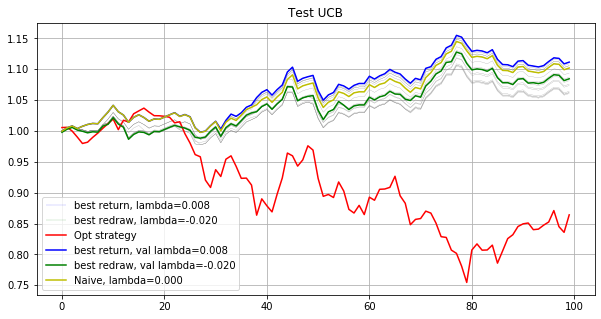

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[ 0.0519 -0.      0.     -0.     -0.      0.0099  0.     -0.     -0.
 -0.     -0.      0.0302  0.     -0.      0.      0.     -0.     -0.
  0.0156 -0.     -0.      0.0224 -0.      0.0736 -0.      0.0071  0.0434
  0.     -0.      0.      0.     -0.      0.     -0.      0.0651  0.0127
  0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.0445  0.     -0.      0.1016 -0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.     -0.      0.0354 -0.
  0.04    0.      0.0658  0.     -0.      0.      0.0027  0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.0846  0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.2509 -0.     -0.      0.
  0.0426]
0.9825954430920014
[ 0.0509 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.0088 -0.      0.0163 -0.      0.      0.   

[ 0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.      0.0036 -0.     -0.     -0.      0.     -0.
  0.     -0.      0.0362  0.0211  0.      0.0132 -0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.0984 -0.      0.005   0.     -0.      0.      0.     -0.
  0.     -0.      0.0477 -0.      0.1871  0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.1366 -0.
 -0.      0.      0.1121  0.     -0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.0873 -0.      0.
  0.     -0.     -0.      0.0541  0.0535  0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.1439
  0.    ]
1.015071047560413
[-0.      0.     -0.     -0.     -0.      0.0466 -0.      0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.0478  0.
  0.     -0.      0.0358  0.0601 -0.     -0.     -0.      0.      0.033

[-0.      0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.0805 -0.      0.091   0.
 -0.      0.0073 -0.      0.     -0.      0.      0.      0.0951  0.0031
  0.      0.0313  0.      0.0092  0.0036 -0.     -0.      0.      0.
  0.0066  0.      0.     -0.      0.0949  0.0008 -0.     -0.      0.
  0.1282  0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.0171  0.0509 -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.0202  0.0127 -0.      0.
  0.      0.      0.      0.1001  0.      0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.2124  0.     -0.      0.0351
 -0.    ]
0.9913132357869452
[ 0.0402  0.      0.      0.     -0.      0.037   0.      0.     -0.
  0.      0.0221  0.      0.009  -0.      0.      0.      0.0631  0.
  0.      0.      0.0636  0.      0.      0.0081  0.     -0.      

[ 0.      0.      0.      0.     -0.      0.0093 -0.      0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.0489 -0.      0.      0.
 -0.      0.0068  0.021  -0.     -0.      0.     -0.      0.1496  0.0392
  0.     -0.      0.048  -0.     -0.     -0.      0.     -0.      0.0276
 -0.      0.      0.083   0.     -0.      0.0267 -0.     -0.      0.0123
 -0.     -0.     -0.      0.0074 -0.     -0.     -0.      0.096  -0.
  0.     -0.      0.      0.0173 -0.      0.      0.      0.      0.0132
 -0.      0.1702  0.      0.     -0.      0.      0.0411  0.      0.
  0.182  -0.      0.0004 -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
1.007107280480615
[-0.     -0.      0.      0.     -0.      0.0081 -0.      0.      0.
 -0.     -0.      0.      0.0062 -0.      0.0562 -0.     -0.     -0.
 -0.      0.0027  0.0682  0.029   0.0057  0.0511  0.      0

[ 0.0557 -0.      0.0085  0.     -0.      0.0075  0.      0.0002 -0.
 -0.      0.0089  0.      0.0152 -0.      0.     -0.      0.0866 -0.
 -0.      0.      0.      0.      0.0105  0.0143  0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.0012  0.0519 -0.
 -0.      0.      0.     -0.     -0.     -0.      0.0097  0.     -0.
  0.      0.0536 -0.      0.      0.1093 -0.      0.      0.      0.
  0.1533 -0.     -0.     -0.      0.     -0.     -0.      0.0583 -0.
 -0.      0.0278  0.0796  0.      0.      0.0045  0.      0.0117  0.0382
 -0.      0.      0.      0.     -0.      0.0451  0.003   0.     -0.
 -0.     -0.      0.      0.      0.0538 -0.      0.      0.     -0.
  0.0542 -0.     -0.      0.0374 -0.     -0.      0.     -0.     -0.
 -0.    ]
0.9848508366082236
[ 0.     -0.      0.002  -0.      0.      0.043   0.      0.006   0.
  0.      0.0235 -0.      0.0133  0.      0.      0.      0.     -0.
  0.      0.      0.     -0.     -0.     -0.     -0.      0.0038  0.
 

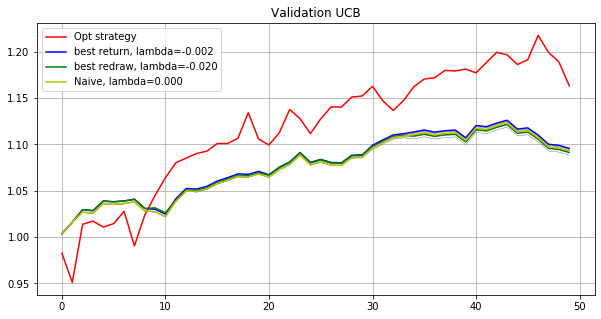

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[ 0.     -0.      0.      0.      0.      0.02    0.      0.      0.
  0.      0.0173  0.0491  0.      0.      0.     -0.      0.     -0.
  0.0269  0.     -0.      0.0449 -0.      0.      0.      0.      0.0583
 -0.      0.0004 -0.     -0.      0.      0.     -0.      0.1189  0.0137
  0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.0548 -0.      0.082  -0.     -0.      0.0098 -0.      0.      0.0113
  0.0595 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.0108  0.      0.0325 -0.      0.      0.      0.      0.     -0.
  0.0024  0.0676  0.      0.      0.      0.0689  0.      0.0417  0.
  0.      0.0358  0.      0.1733  0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
 -0.    ]
1.020259288623234
[-0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.1392 -0.
 -0.     -0.      0.0494 -0.      0.      0.0442  0.      0.   

[-0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.046   0.0157  0.0027  0.0231  0.      0.      0.0524
 -0.     -0.      0.1129  0.      0.      0.     -0.      0.0229 -0.
  0.     -0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.0879 -0.      0.0204  0.      0.      0.0317  0.0194
  0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.0217  0.      0.      0.0916  0.     -0.      0.     -0.      0.131
  0.      0.     -0.      0.      0.      0.1208  0.0692 -0.      0.
 -0.      0.     -0.      0.     -0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.1307
 -0.    ]
1.028800024461947
[ 0.0395  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.2063 -0.
  0.001  -0.      0.      0.      0.      0.0142  0.     -0.

[ 0.0269 -0.      0.0028  0.      0.      0.0113  0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.0502 -0.     -0.      0.     -0.      0.0406
 -0.      0.0002  0.     -0.      0.      0.     -0.      0.0674 -0.
 -0.     -0.      0.003  -0.     -0.     -0.      0.     -0.     -0.
  0.1403 -0.      0.0184  0.      0.118   0.     -0.     -0.      0.0064
  0.1318 -0.     -0.      0.     -0.     -0.     -0.      0.0189 -0.
 -0.      0.      0.0443  0.      0.      0.      0.      0.      0.0982
  0.      0.     -0.     -0.     -0.      0.      0.0189  0.      0.
  0.     -0.      0.      0.0123  0.0333  0.      0.      0.      0.
  0.     -0.      0.0763  0.0805 -0.      0.      0.     -0.      0.
 -0.    ]
1.0019124581684806
[ 0.0751 -0.      0.0014 -0.     -0.      0.0001 -0.      0.     -0.
  0.     -0.     -0.      0.0109  0.     -0.      0.      0.2052 -0.
  0.0224  0.      0.0308 -0.      0.      0.     -0.     -0.  

[-0.     -0.      0.0102  0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.0123  0.0019
  0.008  -0.      0.      0.022  -0.      0.0716  0.     -0.      0.0347
 -0.      0.      0.0229 -0.      0.      0.      0.      0.0298 -0.
 -0.     -0.      0.     -0.      0.      0.      0.0275  0.      0.035
  0.0064  0.0389 -0.      0.      0.1295  0.0877 -0.      0.0143 -0.
  0.      0.      0.      0.0592 -0.      0.     -0.      0.     -0.
 -0.      0.      0.1475  0.      0.      0.0173  0.0459  0.      0.095
  0.      0.      0.      0.     -0.     -0.      0.0204  0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.062  -0.     -0.      0.      0.     -0.     -0.
 -0.    ]
0.9931700546478691
[ 0.0501 -0.      0.004  -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0066  0.      0.      0.      0.     -0.
  0.      0.     -0.      0.0127  0.0155  0.0017  0.      0.

[ 0.0728  0.     -0.      0.      0.      0.016  -0.      0.      0.
 -0.      0.     -0.      0.0238  0.      0.      0.      0.     -0.
 -0.      0.      0.061   0.0029  0.     -0.      0.      0.      0.0677
  0.0406 -0.      0.      0.      0.      0.     -0.      0.      0.0159
  0.0058 -0.      0.     -0.     -0.     -0.      0.      0.     -0.
  0.0594  0.      0.0271  0.     -0.     -0.     -0.      0.      0.0115
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.0662
  0.      0.      0.048   0.0021  0.     -0.      0.     -0.      0.083
  0.     -0.      0.     -0.      0.      0.      0.1059  0.0152  0.0712
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.1376
  0.     -0.      0.      0.0299 -0.      0.      0.      0.0364 -0.
  0.    ]
1.0146089970768786
[ 0.     -0.      0.      0.      0.      0.      0.      0.0046  0.
  0.      0.      0.      0.0006  0.     -0.      0.      0.     -0.
  0.0136  0.     -0.     -0.      0.      0.045

[-0.     -0.     -0.      0.      0.      0.0178  0.      0.0052 -0.
  0.      0.      0.0061  0.     -0.      0.      0.      0.0521  0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.0009 -0.     -0.     -0.     -0.      0.      0.0936  0.0004
 -0.      0.      0.0035 -0.     -0.     -0.      0.      0.     -0.
  0.     -0.      0.0272  0.      0.0012 -0.     -0.      0.0333  0.0062
 -0.     -0.     -0.      0.0755  0.      0.0377 -0.      0.      0.
  0.     -0.      0.0656  0.0672  0.      0.      0.      0.      0.0143
  0.      0.036  -0.     -0.      0.      0.1048  0.      0.     -0.
  0.     -0.      0.0422 -0.      0.009  -0.     -0.      0.      0.
 -0.      0.      0.      0.3    -0.      0.     -0.     -0.     -0.
 -0.    ]
1.0071731206191268
[ 0.0349 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.0092 -0.     -0.      0.      0.0093 -0.
  0.     -0.      0.0603 -0.     -0.      0.0289 -0.     -0.  

[ 0.0716  0.      0.0026  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.0187  0.
  0.      0.      0.      0.      0.      0.0517  0.     -0.      0.0586
  0.      0.012   0.0044 -0.      0.0163  0.     -0.      0.0597  0.0083
  0.0528 -0.     -0.      0.      0.      0.      0.0345  0.      0.014
  0.0075  0.0782  0.075   0.     -0.     -0.      0.0145  0.      0.0094
 -0.     -0.     -0.     -0.      0.0021 -0.      0.      0.022  -0.
  0.      0.      0.0418  0.     -0.      0.      0.     -0.      0.093
  0.     -0.      0.      0.     -0.     -0.      0.0147  0.     -0.
  0.     -0.      0.1041 -0.     -0.     -0.      0.      0.0267  0.
  0.     -0.      0.0873  0.      0.      0.0185 -0.     -0.     -0.
 -0.    ]
1.0125024876283915
[ 0.0234  0.      0.      0.      0.      0.0303 -0.     -0.     -0.
 -0.     -0.      0.0137  0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.0246 -0.    

[ 0.0198  0.      0.      0.     -0.      0.0235  0.     -0.     -0.
  0.      0.0396 -0.      0.0073 -0.      0.081   0.      0.      0.
  0.      0.      0.0341  0.      0.002   0.0474  0.     -0.      0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.1186 -0.
 -0.     -0.     -0.      0.0298  0.     -0.      0.      0.      0.0123
 -0.      0.0598  0.0258  0.      0.0145  0.0286  0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.133  -0.
  0.      0.      0.1141 -0.      0.     -0.      0.     -0.      0.0681
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.0058  0.      0.0019  0.0408  0.      0.     -0.
  0.      0.      0.      0.      0.      0.0098  0.      0.0105  0.0718
 -0.    ]
0.9928794598790096
[ 0.0388  0.     -0.      0.      0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.0553 -0.
  0.     -0.     -0.      0.0167  0.     -0.      0.     -0.  

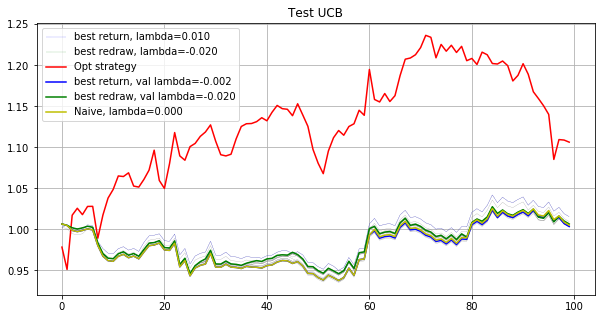

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.70769646
Mean return: 1.00066916
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


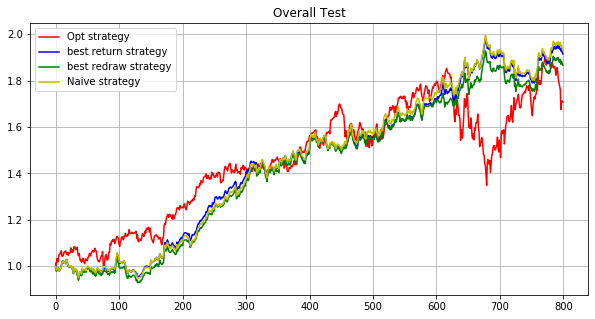

In [9]:
run(path, maxiter, subn, lb, testv=np.arange(-0.02, 0.0100001, 0.002), delta=50)

In [6]:
logrt = [np.ones((1, 100))]

for phs in range(4, 12):
    print('Phase %d' % phs)
    lb = 5
    maxiter = 8000
    subn = 100       
    path='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
        
    _, _, predY0, std_varY0, sample_Y0 = get_res(path, phs, maxiter, subn, lb)
    logrt.append(sample_Y0)

Phase 4
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Phase 5
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Phase 6
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Phase 7
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Phase 8
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Phase 9
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Phase 10
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Phase 11
./tmp2/res_phase11_iter8000_subn100_lb5.npz


In [7]:
lrt = np.concatenate(logrt, axis=0)

In [8]:
lrt.shape

(801, 100)

In [9]:
for i in range(1, 801):
    lrt[i, :] = exp(lrt[i, :])*lrt[i-1, :]

In [10]:
df = pd.DataFrame(lrt, columns = list(range(100,200)))

<AxesSubplot:>

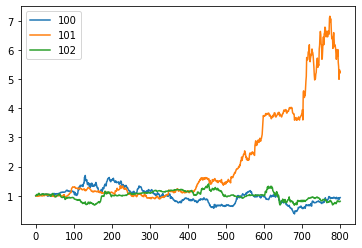

In [11]:
df.iloc[:,:3].plot()

In [99]:
# set algo parameters
algo = algos.OLMAR(window=5, eps=10)

# run
result = algo.run(df)

Summary:
    Profit factor: 1.11
    Sharpe ratio: 0.81 ± 0.65
    Ulcer index: 2.17
    Information ratio (wrt UCRP): 0.52
    Appraisal ratio (wrt UCRP): 0.43 ± 0.56
    UCRP sharpe: 0.89 ± 0.66
    Beta / Alpha: 1.18 / 17.637%
    Annualized return: 30.16%
    Annualized volatility: 44.75%
    Longest drawdown: 316 days
    Max drawdown: 36.05%
    Winning days: 53.8%
    Annual turnover: 303.6
        


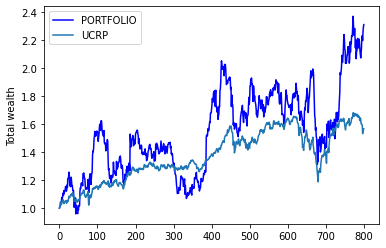

In [100]:
print(result.summary())
ax = result.plot(weights=False, assets=False, ucrp=True, logy=False);

In [101]:
olmar = ax[0].get_lines()[0].get_ydata()
ucpr = ax[0].get_lines()[1].get_ydata()

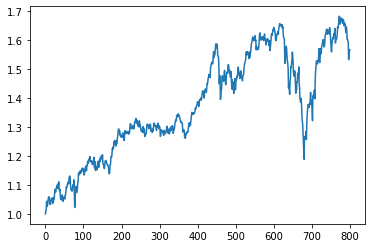

In [102]:
plt.plot(ucpr)

In [63]:
# set algo parameters
algoup = algos.UP( eval_points=1E+4, leverage=1)

# run
resultup = algoup.run(df)

Summary:
    Profit factor: 1.15
    Sharpe ratio: 0.89 ± 0.66
    Ulcer index: 2.68
    Information ratio (wrt UCRP): 0.64
    Appraisal ratio (wrt UCRP): 0.01 ± 0.56
    UCRP sharpe: 0.89 ± 0.66
    Beta / Alpha: 1.00 / 0.021%
    Annualized return: 15.20%
    Annualized volatility: 17.71%
    Longest drawdown: 154 days
    Max drawdown: 28.26%
    Winning days: 53.8%
    Annual turnover: 3.2
        


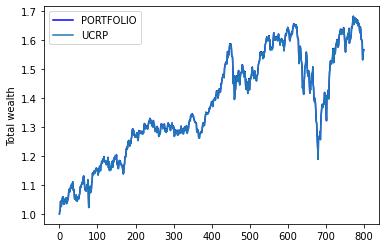

In [64]:
print(resultup.summary())
resultup.plot(weights=False, assets=False, ucrp=True, logy=False);

In [65]:
up = ax[0].get_lines()[0].get_ydata()

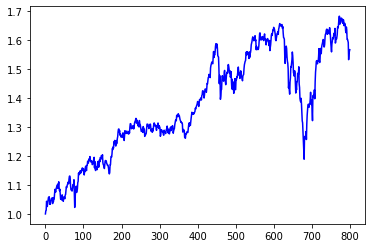

In [66]:
# plt.plot(ucpr, 'r')
plt.plot(up, 'b')

In [74]:
# set algo parameters
algoup = algos.BestSoFar()

# run
resultup = algoup.run(df)

Summary:
    Profit factor: 1.04
    Sharpe ratio: 0.44 ± 0.59
    Ulcer index: 0.92
    Information ratio (wrt UCRP): 0.11
    Appraisal ratio (wrt UCRP): 0.02 ± 0.56
    UCRP sharpe: 0.89 ± 0.66
    Beta / Alpha: 1.21 / 1.025%
    Annualized return: 10.18%
    Annualized volatility: 44.95%
    Longest drawdown: 650 days
    Max drawdown: 38.81%
    Winning days: 52.2%
    Annual turnover: 38.7
        


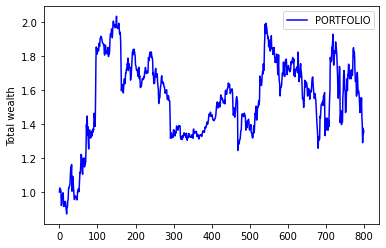

In [82]:
print(resultup.summary())
ax=resultup.plot(weights=False, assets=False, ucrp=False, logy=False);

In [83]:
bsf = ax[0].get_lines()[0].get_ydata()

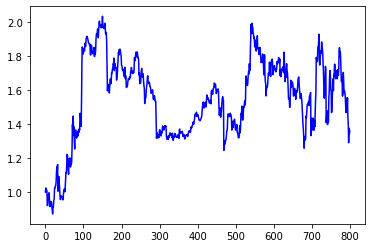

In [84]:
# plt.plot(ucpr, 'r')
plt.plot(bsf, 'b')

In [87]:
# set algo parameters
algoup = algos.BNN()

# run
resultup = algoup.run(df)

Summary:
    Profit factor: 1.03
    Sharpe ratio: 0.31 ± 0.57
    Ulcer index: 0.35
    Information ratio (wrt UCRP): -0.15
    Appraisal ratio (wrt UCRP): -0.16 ± 0.56
    UCRP sharpe: 0.89 ± 0.66
    Beta / Alpha: 1.02 / -5.050%
    Annualized return: 4.85%
    Annualized volatility: 35.61%
    Longest drawdown: 640 days
    Max drawdown: 59.62%
    Winning days: 51.4%
    Annual turnover: 388.4
        


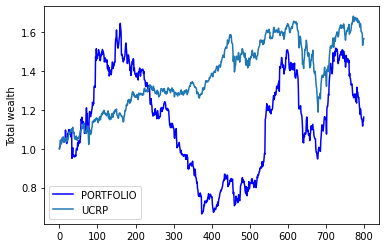

In [88]:
print(resultup.summary())
resultup.plot(weights=False, assets=False, ucrp=True, logy=False);

In [89]:
bnn = ax[0].get_lines()[0].get_ydata()

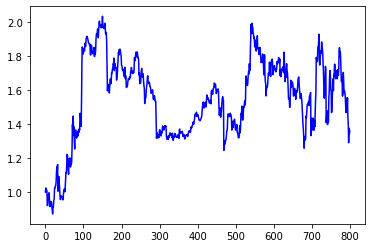

In [90]:
# plt.plot(ucpr, 'r')
plt.plot(bnn, 'b')

Opt strategy
Total return: 2.40277901
Mean return: 1.00109638


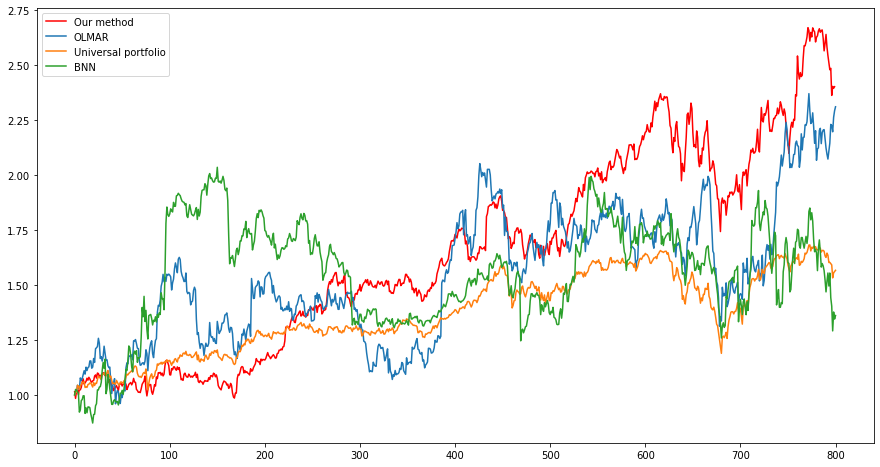

In [103]:
plt.figure(figsize=(15,8))
rt_v = opt_lst
print('Opt strategy')
print('Total return: %.8f' % exp(sum(rt_v)))
print('Mean return: %.8f' % exp(np.mean(rt_v)))
exp_rt = rt_v.copy()
for i in range(1, len(rt_v)):
    exp_rt[i] += exp_rt[i-1]
exp_rt = exp(exp_rt)
plt.plot(exp_rt, 'r', label='Our method')
plt.plot(olmar, label='OLMAR')
plt.plot(up, label='Universal portfolio')
plt.plot(bnn, label='BNN')
plt.legend()